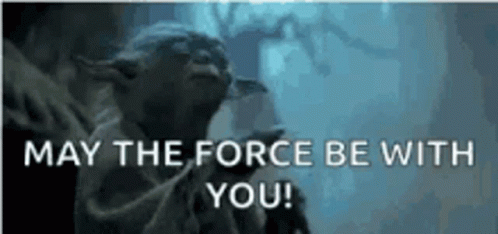

# Group Project - AI for Security
# Group: Data Vader 

## (may the data be with you) 

**Members:**
- Andrea Ferrazzano - andrea1.ferrazzano@mail.polimi.it - 10703279
- Marco Gorini - marco2.gorini@mail.polimi.it - 10710545
- Leonardo Saveri - leonardo.saveri@mail.polimi.it - 10745545
- Claudia Pierpaoli - claudia.pierpaoli@mail.polimi.it - 11016822

# Preprocessing and Analysis

## Objective:
For this project, we analyzed data that involves the problem of the protection of Internet of Things (IoT) devices such as Amazon echo, Google Nest, Sonos speakers, etc. The data set comes from a real IoT network with 105 different devices.
The creators of the dataset have attacked the network in 7 different ways on a total of 33 occasions. We found that the original dataset is very large (3GB), so we started with the 5% sample provided for us and then expanded with the use of a larger part of the dataset.

Since we need to classify within 8 classes, let's consider that when choosing at random, the probability of a correct classification is 12.5%. Of course we have to try to aim for a better accuracy, since we can imagine that a trained human can correctly identify all of these attacks.

## Table of Contents

[Pre-Processing](#1)\
[Linear Classifiers](#2)\
[Non Linear Classifiers](#3)\
[Ensambles](#4)\
[Unsupervised Classification](#5)\
[Anomaly Detection Techniques](#6)\
[Comparison with another Paper](#7)

## Imports

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy import stats
from sklearn.model_selection import train_test_split

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

## A) Compute Summary Statistics

We started by importing the 5% sample of our IoT dataset and implementing some data visualization in order to better understand the data, such as the features present.

In [3]:
df_5 = pd.read_csv("data/IoT_5Percent.csv")
df_5.head()

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label
0,0.092170,16692.50,17.00,64.0,4124.115328,4124.115328,0.0,0.0,0.0,0.0,...,0.000000,50.00,8.312373e+07,9.5,10.000000,0.00000,0.000000,0.00,141.55,DDoS-UDP_Flood
1,0.152987,17635.00,17.00,64.0,3601.595667,3601.595667,0.0,0.0,0.0,0.0,...,0.000000,50.00,8.310619e+07,9.5,10.000000,0.00000,0.000000,0.00,141.55,DDoS-UDP_Flood
2,0.000000,0.00,1.00,64.0,163.479196,163.479196,0.0,0.0,0.0,0.0,...,0.000000,42.00,8.312400e+07,9.5,9.165151,0.00000,0.000000,0.00,141.55,DDoS-ICMP_Flood
3,0.000000,54.00,6.00,64.0,6.207933,6.207933,0.0,0.0,0.0,0.0,...,0.000000,54.00,8.333214e+07,9.5,10.392305,0.00000,0.000000,0.00,141.55,DDoS-PSHACK_Flood
4,0.006760,199.78,16.67,64.0,37.627478,37.627478,0.0,0.0,0.0,0.0,...,3.970412,177.28,8.300370e+07,9.5,18.997839,5.63636,153.637263,0.11,141.55,DoS-UDP_Flood


In [4]:
df_5.shape

(2332150, 47)

The dataset contains 2332150 entries and 47 columns. Now let's show more information about the dataset and the types of the columns.

In [ ]:
df_5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2332150 entries, 0 to 2332149
Data columns (total 47 columns):
 #   Column           Dtype  
---  ------           -----  
 0   flow_duration    float64
 1   Header_Length    float64
 2   Protocol Type    float64
 3   Duration         float64
 4   Rate             float64
 5   Srate            float64
 6   Drate            float64
 7   fin_flag_number  float64
 8   syn_flag_number  float64
 9   rst_flag_number  float64
 10  psh_flag_number  float64
 11  ack_flag_number  float64
 12  ece_flag_number  float64
 13  cwr_flag_number  float64
 14  ack_count        float64
 15  syn_count        float64
 16  fin_count        float64
 17  urg_count        float64
 18  rst_count        float64
 19  HTTP             float64
 20  HTTPS            float64
 21  DNS              float64
 22  Telnet           float64
 23  SMTP             float64
 24  SSH              float64
 25  IRC              float64
 26  TCP              float64
 27  UDP         

There are a total of 47 columns (46 features of type float64, and 1 class label of type object). We found that the data did not contain any categorical features (only numerical ones), we don't need to worry about them in this preprocessing part. Below we checked whether we had any missing values. We are happy to see that we have none!

In [ ]:
df_5.isna().sum().sum()

0

Then we searched for columns that contain binary values.

In [ ]:
bool_cols = [col for col in df_5 
             if np.isin(df_5[col].dropna().unique(), [0, 1]).all()]
bool_cols

['fin_flag_number',
 'syn_flag_number',
 'rst_flag_number',
 'psh_flag_number',
 'ack_flag_number',
 'ece_flag_number',
 'cwr_flag_number',
 'HTTP',
 'HTTPS',
 'DNS',
 'Telnet',
 'SMTP',
 'SSH',
 'IRC',
 'TCP',
 'UDP',
 'DHCP',
 'ARP',
 'ICMP',
 'IPv',
 'LLC']

To see other important information about the dataset, we ran summary statistics:

In [ ]:
df_5.describe()

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,AVG,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight
count,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,...,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06,2.332150e+06
mean,5.757926e+00,7.714112e+04,9.072652e+00,6.634822e+01,9.091876e+03,9.091876e+03,3.048512e-06,8.665952e-02,2.077379e-01,9.049761e-02,...,1.247483e+02,3.329294e+01,1.247587e+02,8.316881e+07,9.497866e+00,1.312542e+01,4.705157e+01,3.055702e+04,9.630161e-02,1.414963e+02
std,2.857280e+02,4.637787e+05,8.956664e+00,1.403039e+01,9.990555e+04,9.990555e+04,2.209338e-03,2.813355e-01,4.056882e-01,2.868934e-01,...,2.408751e+02,1.599584e+02,2.414911e+02,1.700245e+07,8.170173e-01,8.631892e+00,2.262434e+02,3.116256e+05,2.326818e-01,2.101296e+01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,4.200000e+01,0.000000e+00,4.200000e+01,0.000000e+00,1.000000e+00,9.165151e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
25%,0.000000e+00,5.400000e+01,6.000000e+00,6.400000e+01,2.091515e+00,2.091515e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,5.000000e+01,0.000000e+00,5.000000e+01,8.307156e+07,9.500000e+00,1.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,1.415500e+02
50%,0.000000e+00,5.400000e+01,6.000000e+00,6.400000e+01,1.579892e+01,1.579892e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,5.400000e+01,0.000000e+00,5.400000e+01,8.312452e+07,9.500000e+00,1.039230e+01,0.000000e+00,0.000000e+00,0.000000e+00,1.415500e+02
75%,1.051811e-01,2.726300e+02,1.436000e+01,6.400000e+01,1.173987e+02,1.173987e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,5.405011e+01,3.719096e-01,5.406000e+01,8.334391e+07,9.500000e+00,1.039673e+01,5.059213e-01,1.344216e+00,8.000000e-02,1.415500e+02
max,1.314562e+05,9.840879e+06,4.700000e+01,2.550000e+02,8.388608e+06,8.388608e+06,2.989952e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,8.609545e+03,8.493570e+03,9.622800e+03,1.676394e+08,1.500000e+01,1.284702e+02,1.203616e+04,7.290803e+07,1.000000e+00,2.446000e+02


The summary statistics tell us various information about the features, which can be quite useful. But in order to best visualize the data and have a more in depth idea of what we will be working with, we found it best to analyze the data with visual plots and graphs, as shown later.

The target value we need to predict is the "label" column. In reality, we noticed that many labels were associated with overall the same type of attack, so we grouped them into more general categories, with the hope that our models could work better with less labels (as shown in this paper: https://www.mdpi.com/1424-8220/23/13/5941#B99-sensors-23-05941). Now, let's plot the distribution of these labels and create a new "category_label", which will contain the group for each single value.

In [ ]:
df_5.groupby("label").size().sort_values(ascending=False)

label
DDoS-ICMP_Flood            358566
DDoS-UDP_Flood             270120
DDoS-TCP_Flood             224376
DDoS-PSHACK_Flood          204981
DDoS-SYN_Flood             203200
DDoS-RSTFINFlood           202274
DDoS-SynonymousIP_Flood    179873
DoS-UDP_Flood              166013
DoS-TCP_Flood              133466
DoS-SYN_Flood              101658
BenignTraffic               54489
Mirai-greeth_flood          49684
Mirai-udpplain              44356
Mirai-greip_flood           37752
DDoS-ICMP_Fragmentation     22633
MITM-ArpSpoofing            15414
DDoS-UDP_Fragmentation      14330
DDoS-ACK_Fragmentation      14300
DNS_Spoofing                 8846
Recon-HostDiscovery          6531
Recon-OSScan                 4983
Recon-PortScan               4110
DoS-HTTP_Flood               3663
VulnerabilityScan            1906
DDoS-HTTP_Flood              1443
DDoS-SlowLoris               1151
DictionaryBruteForce          661
BrowserHijacking              303
CommandInjection              286
SqlInjec

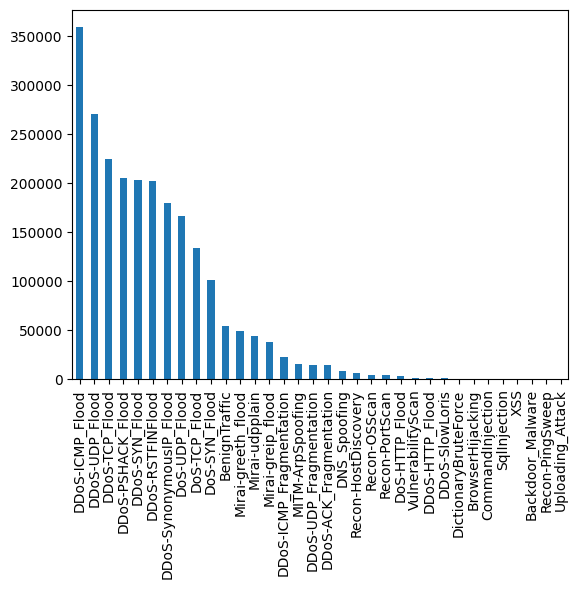

In [ ]:
df_5.label.value_counts().plot(kind='bar')
plt.show()

We can see that the dataset is very unbalanced in this way. Let's now combine attacks into categories and plot again the distribution.

In [ ]:
dict_8classes = {}
dict_8classes['DDoS-RSTFINFlood'] = 'DDoS'
dict_8classes['DDoS-PSHACK_Flood'] = 'DDoS'
dict_8classes['DDoS-SYN_Flood'] = 'DDoS'
dict_8classes['DDoS-UDP_Flood'] = 'DDoS'
dict_8classes['DDoS-TCP_Flood'] = 'DDoS'
dict_8classes['DDoS-ICMP_Flood'] = 'DDoS'
dict_8classes['DDoS-SynonymousIP_Flood'] = 'DDoS'
dict_8classes['DDoS-ACK_Fragmentation'] = 'DDoS'
dict_8classes['DDoS-UDP_Fragmentation'] = 'DDoS'
dict_8classes['DDoS-ICMP_Fragmentation'] = 'DDoS'
dict_8classes['DDoS-SlowLoris'] = 'DDoS'
dict_8classes['DDoS-HTTP_Flood'] = 'DDoS'

dict_8classes['DoS-UDP_Flood'] = 'DoS'
dict_8classes['DoS-SYN_Flood'] = 'DoS'
dict_8classes['DoS-TCP_Flood'] = 'DoS'
dict_8classes['DoS-HTTP_Flood'] = 'DoS'


dict_8classes['Mirai-greeth_flood'] = 'Mirai'
dict_8classes['Mirai-greip_flood'] = 'Mirai'
dict_8classes['Mirai-udpplain'] = 'Mirai'

dict_8classes['Recon-PingSweep'] = 'Recon'
dict_8classes['Recon-OSScan'] = 'Recon'
dict_8classes['Recon-PortScan'] = 'Recon'
dict_8classes['VulnerabilityScan'] = 'Recon'
dict_8classes['Recon-HostDiscovery'] = 'Recon'

dict_8classes['DNS_Spoofing'] = 'Spoofing'
dict_8classes['MITM-ArpSpoofing'] = 'Spoofing'

dict_8classes['BrowserHijacking'] = 'Web'
dict_8classes['Backdoor_Malware'] = 'Web'
dict_8classes['XSS'] = 'Web'
dict_8classes['Uploading_Attack'] = 'Web'
dict_8classes['SqlInjection'] = 'Web'
dict_8classes['CommandInjection'] = 'Web'

dict_8classes['DictionaryBruteForce'] = 'BruteForce'

dict_8classes['BenignTraffic'] = 'BenignTraffic'

In [ ]:
category_labels = [dict_8classes[label] for label in df_5['label']]
df_5["category_label"] = category_labels

In [ ]:
df_5.groupby("category_label").size().sort_values(ascending=False)

category_label
DDoS             1697247
DoS               404800
Mirai             131792
BenignTraffic      54489
Spoofing           24260
Recon              17640
Web                 1261
BruteForce           661
dtype: int64

Now to visualize our regrouped attacks:

<Axes: >

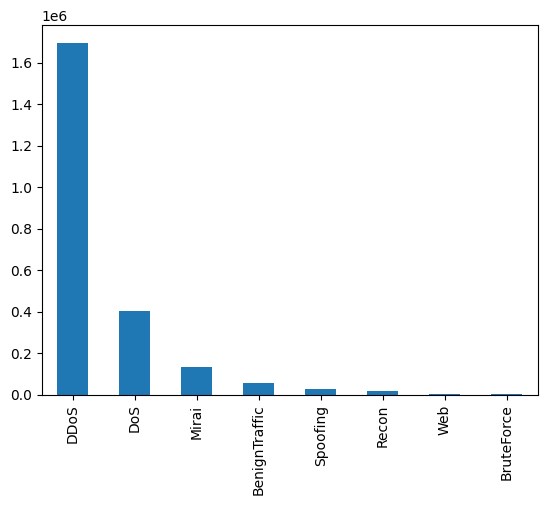

In [ ]:
df_5.category_label.value_counts().plot(kind='bar')

The classes are extremely unbalanced. Thinking about the future, we would probably need a much more balanced dataset. Because we have a bigger dataset (the original) available, and the best way to deal with unbalanced data would be to collect more data (and not to undersample or oversample) we decided to create a different dataset, with 20k entries for each of the different categories (when available). In this way we should be able to get a more balanced dataset, with real entries.

<a id="1"></a>
<h1>EXTRA: Building the dataset</h1>

The full dataset is obtained from this kaggle repository: https://www.kaggle.com/datasets/madhavmalhotra/unb-cic-iot-dataset/data

In [ ]:
# Uncomment this to run -> run cell below to read file directly
# THIS WAS RUN ON GOOGLE COLAB TO NOT DOWLOAD EVERYTHING ON PERSONAL MACHINE, DIRECTORY ARE DIFFERENT
"""
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download madhavmalhotra/unb-cic-iot-dataset

!unzip -q /content/unb-cic-iot-dataset.zip -d .

import os
import pandas as pd

dict_8classes = {}
dict_8classes['DDoS-RSTFINFlood'] = 'DDoS'
dict_8classes['DDoS-PSHACK_Flood'] = 'DDoS'
dict_8classes['DDoS-SYN_Flood'] = 'DDoS'
dict_8classes['DDoS-UDP_Flood'] = 'DDoS'
dict_8classes['DDoS-TCP_Flood'] = 'DDoS'
dict_8classes['DDoS-ICMP_Flood'] = 'DDoS'
dict_8classes['DDoS-SynonymousIP_Flood'] = 'DDoS'
dict_8classes['DDoS-ACK_Fragmentation'] = 'DDoS'
dict_8classes['DDoS-UDP_Fragmentation'] = 'DDoS'
dict_8classes['DDoS-ICMP_Fragmentation'] = 'DDoS'
dict_8classes['DDoS-SlowLoris'] = 'DDoS'
dict_8classes['DDoS-HTTP_Flood'] = 'DDoS'

dict_8classes['DoS-UDP_Flood'] = 'DoS'
dict_8classes['DoS-SYN_Flood'] = 'DoS'
dict_8classes['DoS-TCP_Flood'] = 'DoS'
dict_8classes['DoS-HTTP_Flood'] = 'DoS'


dict_8classes['Mirai-greeth_flood'] = 'Mirai'
dict_8classes['Mirai-greip_flood'] = 'Mirai'
dict_8classes['Mirai-udpplain'] = 'Mirai'

dict_8classes['Recon-PingSweep'] = 'Recon'
dict_8classes['Recon-OSScan'] = 'Recon'
dict_8classes['Recon-PortScan'] = 'Recon'
dict_8classes['VulnerabilityScan'] = 'Recon'
dict_8classes['Recon-HostDiscovery'] = 'Recon'

dict_8classes['DNS_Spoofing'] = 'Spoofing'
dict_8classes['MITM-ArpSpoofing'] = 'Spoofing'

dict_8classes['BrowserHijacking'] = 'Web'
dict_8classes['Backdoor_Malware'] = 'Web'
dict_8classes['XSS'] = 'Web'
dict_8classes['Uploading_Attack'] = 'Web'
dict_8classes['SqlInjection'] = 'Web'
dict_8classes['CommandInjection'] = 'Web'

dict_8classes['DictionaryBruteForce'] = 'BruteForce'

dict_8classes['BenignTraffic'] = 'BenignTraffic'

df = pd.DataFrame()

for category in ['DDoS', 'DoS', 'Mirai', 'Recon', 'Spoofing', 'Web', 'BruteForce', 'BenignTraffic']:
    print('starting: ', category)
    df_cat = pd.DataFrame()
    for i in os.listdir('/content/wataiData/csv/CICIoT2023'):
        df_temp = pd.read_csv('/content/wataiData/csv/CICIoT2023/' + i)
        category_label = []
        for label in df_temp['label']:
            category_label.append(dict_7classes[label])
        df_temp['category_label'] = category_label
        df_temp = df_temp.query("category_label==@category").copy()
        df_cat = pd.concat([df_cat, df_temp])
        if len(df_cat) >= 20000:
            df = pd.concat([df, df_cat.head(20000)].copy())
            break
    if category == 'BruteForce':
        df = pd.concat([df, df_cat.head(20000)].copy())
        break

df.category_label.value_counts

df.shape

df.to_csv('/content/full_balanced_data.csv', index=None)
"""

In [3]:
df = pd.read_csv("data/full_balanced_data.csv")
df.head()

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label,category_label
0,3.391010,86.40,6.0,64.00,0.353898,0.353898,0.0,0.0,0.0,0.0,...,54.00,8.333083e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-PSHACK_Flood,DDoS
1,0.000000,0.00,1.0,64.00,0.995891,0.995891,0.0,0.0,0.0,0.0,...,42.00,8.313207e+07,9.5,9.165151,0.000000,0.000000,0.00,141.55,DDoS-ICMP_Flood,DDoS
2,0.000000,54.69,6.0,63.78,29852.697509,29852.697509,0.0,0.0,0.0,0.0,...,54.69,8.306737e+07,9.5,10.402806,0.659309,7.245867,0.03,141.55,DDoS-TCP_Flood,DDoS
3,0.891138,91.80,6.0,64.00,2.940833,2.940833,0.0,0.0,1.0,0.0,...,54.00,8.336111e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-SynonymousIP_Flood,DDoS
4,0.000000,0.00,1.0,64.00,2.011545,2.011545,0.0,0.0,0.0,0.0,...,42.00,8.312779e+07,9.5,9.165151,0.000000,0.000000,0.00,141.55,DDoS-ICMP_Flood,DDoS


In [4]:
df.groupby("category_label").size().sort_values(ascending=False)

category_label
BenignTraffic    20000
DDoS             20000
DoS              20000
Mirai            20000
Recon            20000
Spoofing         20000
Web              20000
BruteForce       13064
dtype: int64

<Axes: >

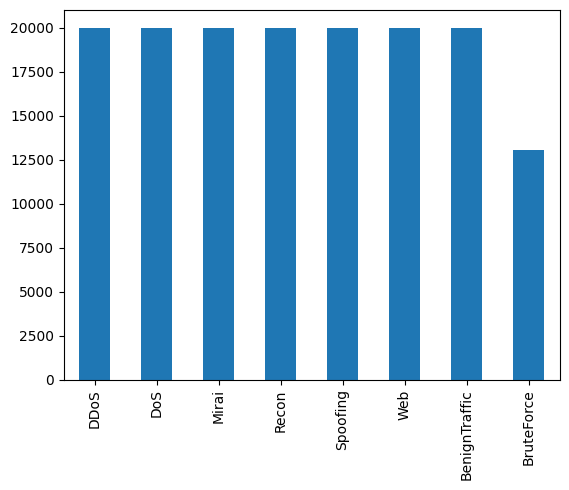

In [5]:
df.category_label.value_counts().plot(kind='bar')

By seeing the plot and the number of entries for each attack, we can now work with a more balanced dataset, and is ready for an exploratory data analysis. It is important to note that the BruteForce label contains less entries, because overall in the original dataset BruteForce didn't contain as many entries compared to the other labels.

## EXTRA: Extracting the final test set

We can now create a big test dataset that we will use to evaluate the classifiers that we will train.

In [6]:
from sklearn.model_selection import train_test_split

df_DDoS = df[df['category_label'] == 'DDoS'].copy()
df_DoS = df[df['category_label'] == 'DoS'].copy()
df_Mirai = df[df['category_label'] == 'Mirai'].copy()
df_Recon = df[df['category_label'] == 'Recon'].copy()
df_Spoofing = df[df['category_label'] == 'Spoofing'].copy()
df_BenignTraffic = df[df['category_label'] == 'BenignTraffic'].copy()
df_Web = df[df['category_label'] == 'Web'].copy()
df_BruteForce = df[df['category_label'] == 'BruteForce'].copy()

dfs = [df_DDoS, df_DoS, df_Mirai, df_Recon, df_Spoofing, df_BenignTraffic, df_Web, df_BruteForce]
dfs_use = []
dfs_final_test = []

for df in dfs:
    df_train, df_test = train_test_split(df, train_size=10000, random_state=42)
    dfs_use.append(df_train)
    dfs_final_test.append(df_test)

df = pd.concat(dfs_use)
df_test = pd.concat(dfs_final_test)

<Axes: >

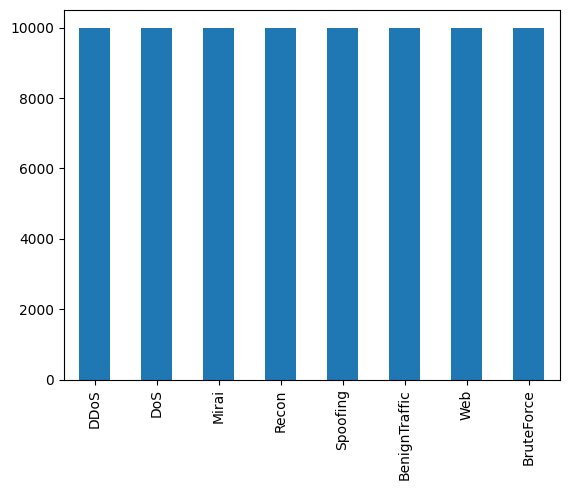

In [7]:
df.category_label.value_counts().plot(kind='bar')

<Axes: >

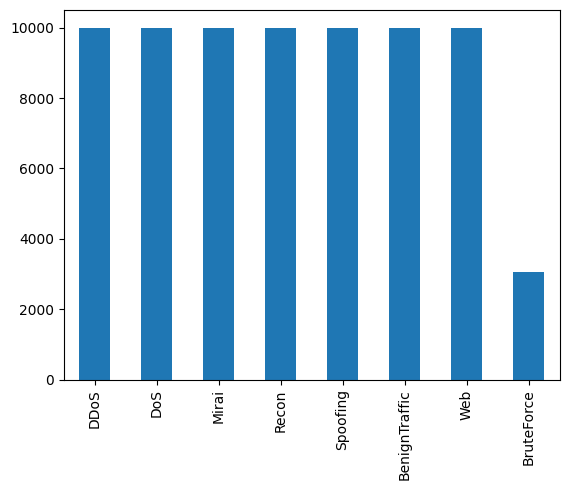

In [8]:
df_test.category_label.value_counts().plot(kind='bar')

In [14]:
df_test.to_csv("data/final_test_data.csv", index=None)

We will not be touching this final test data, and use it to evaluate the final classifiers. The test dataset contains 10k entries for each label, except for BruteForcing that has less entries.

## B) Visualize the data:
We begin by importing the necessary libraries:

In [9]:
import seaborn as sns
from ipywidgets import interact, widgets

In this section, we want to see if any of our features contain significant outliers and data that might be unneccesary for our analysis and that may skew our results. It is important to note that all of these analysis will be performed by label, this is becuase in this specific case (attacks) the outliers might be true outliers, and by working on grouped labels we can avoid removing data that are naturally different between each other.

In [10]:
columns = df.drop(['label', 'category_label'], axis=1).columns

### Box Plot & Histogram

With the following helper functions, we can create some interactive plots that make it easier for us to analyze the data without plotting too many distributions at one.

In [11]:
def create_boxplot(df):
    def plot(column):
        plt.figure(figsize=(6, 4))
        sorted_categories = sorted(df['category_label'].unique())
        sns.boxplot(x='category_label', y=column, data=df, order=sorted_categories)
        plt.title(f'Boxplot for {column}')
        plt.xticks(rotation=45)
        plt.show()

    columns = df.drop(['label', 'category_label'], axis=1).columns
    dropdown_menu = widgets.Dropdown(options=columns, description='Select Column')

    interact(plot, column=dropdown_menu)

In [12]:
def create_hist(df):
    def plot(column):
        plt.figure(figsize=(12, 16))
        columns_per_row = 2
        unique_categories = sorted(df['category_label'].unique())
        num_categories = len(unique_categories)
        num_rows = (num_categories + columns_per_row - 1) // columns_per_row
        
        overall_min = df[column].min()
        overall_max = df[column].max()

        for i, category in enumerate(unique_categories, start=1):
            plt.subplot(num_rows, columns_per_row, i)
            
            
            bins = 50 
            bin_edges = [overall_min + (overall_max - overall_min) * j / bins for j in range(bins + 1)]
            sns.histplot(df[df['category_label'] == category][column], bins=bin_edges, kde=True)
            plt.title(f'Histogram for {column} - {category}')
            plt.xlabel(column)
            plt.ylabel('Frequency')

        plt.tight_layout()
        plt.show()

    columns = df.drop(['label', 'category_label'], axis=1).columns
    dropdown_menu = widgets.Dropdown(options=columns, description='Select Column')

    interact(plot, column=dropdown_menu)

In [13]:
create_boxplot(df)

interactive(children=(Dropdown(description='Select Column', options=('flow_duration', 'Header_Length', 'Protoc…

As part of the visualization of the data, we can determine the minimum and maximum values, median, and the quartiles for each label.

In [ ]:
create_hist(df)

interactive(children=(Dropdown(description='Select Column', options=('flow_duration', 'Header_Length', 'Protoc…

Above we created histograms to best visualize the distribution of the data based on the different labels.

To best determine what features to drop, we also created a correlation matrix to see what features might be correlated with each other. When two features are correlated they usually have almost the same impact on the prediction, so one can be dropped. 

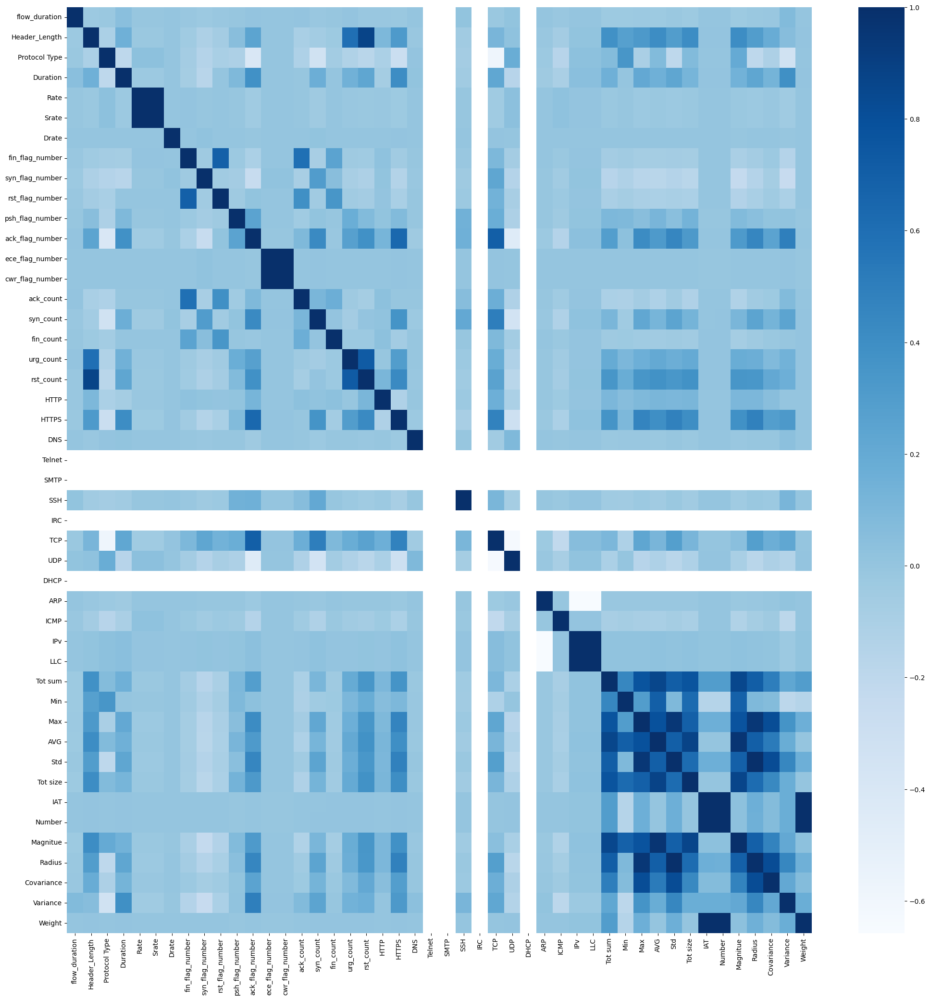

In [52]:
plt.figure(figsize=(25,25))
sns.heatmap(df[columns].corr(), cbar=True, cmap='Blues')
plt.show()

## Train-Test Split

Let's now split the dataframe into the training and testing data, so that we can work on removing some outliers/features from the training data alone.

The test data that we are creating here will be used later to evaluate models when testing different paramethers (faster then testing on big test set).

In [21]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

<Axes: >

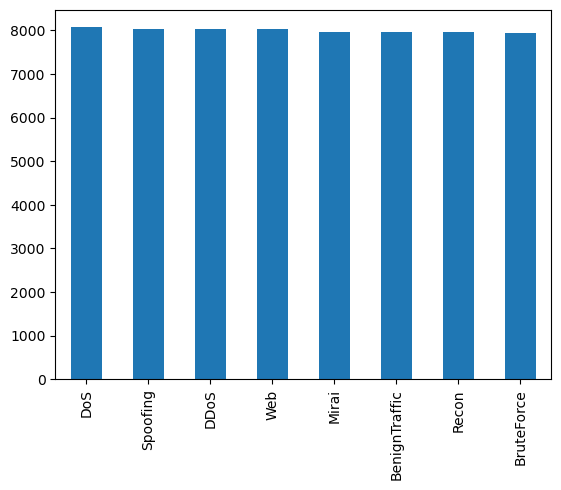

In [22]:
df_train.category_label.value_counts().plot(kind='bar')

<Axes: >

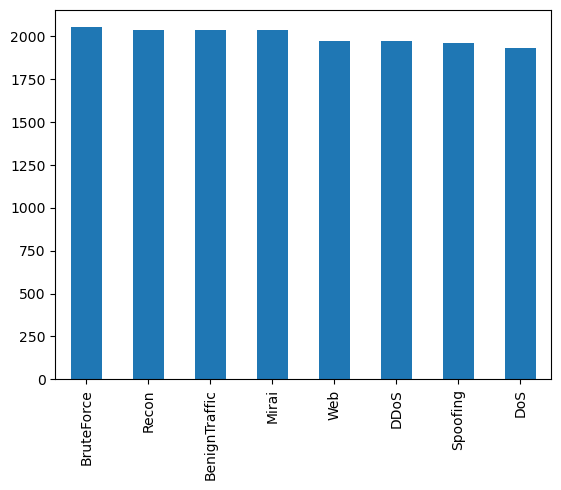

In [23]:
df_test.category_label.value_counts().plot(kind='bar')

The training and testing data contains 8000 entries and 2000 entries respectively.

In order to logically remove outliers based on the label, working with dataframes we divided for each label. We removed very few of them, mainly to remove them from columns that would contain otherwise mostly the same value. Then to proceed we remove these columns.


In [24]:
df_DDoS = df_train[df_train['category_label'] == 'DDoS'].copy()
df_DoS = df_train[df_train['category_label'] == 'DoS'].copy()
df_Mirai = df_train[df_train['category_label'] == 'Mirai'].copy()
df_Recon = df_train[df_train['category_label'] == 'Recon'].copy()
df_Spoofing = df_train[df_train['category_label'] == 'Spoofing'].copy()
df_BenignTraffic = df_train[df_train['category_label'] == 'BenignTraffic'].copy()
df_Web = df_train[df_train['category_label'] == 'Web'].copy()
df_BruteForce = df_train[df_train['category_label'] == 'BruteForce'].copy()

dfs = [df_DDoS, df_DoS, df_Mirai, df_Recon, df_Spoofing, df_BenignTraffic, df_Web, df_BruteForce]

In [25]:
df_noOut = pd.DataFrame()
for df_small in dfs:
    Q1 = df_small.quantile(0.05, numeric_only=True)
    Q3 = df_small.quantile(0.95, numeric_only=True)
    IQR = Q3 - Q1
    df__small_noOut= df_small[~((df_small<(Q1-1.5*IQR))|(df_small>(Q3+1.5*IQR))).any(axis=1)]
    df_noOut = pd.concat([df_noOut, df__small_noOut])


In [26]:
df_noOut

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label,category_label
9216,0.179236,34353.0,17.0,64.0,5381.270971,5381.270971,0.0,0.0,0.0,0.0,...,50.0,8.309874e+07,9.5,10.000000,0.000000,0.000000,0.0,141.55,DDoS-UDP_Flood,DDoS
8745,0.000000,54.0,6.0,64.0,3.500237,3.500237,0.0,0.0,0.0,0.0,...,54.0,8.307247e+07,9.5,10.392305,0.000000,0.000000,0.0,141.55,DDoS-TCP_Flood,DDoS
767,0.000000,54.0,6.0,64.0,1.964445,1.964445,0.0,1.0,0.0,1.0,...,54.0,8.334505e+07,9.5,10.392305,0.000000,0.000000,0.0,141.55,DDoS-RSTFINFlood,DDoS
4240,0.056592,24416.0,17.0,64.0,8687.939069,8687.939069,0.0,0.0,0.0,0.0,...,50.0,8.309854e+07,9.5,10.000000,0.000000,0.000000,0.0,141.55,DDoS-UDP_Flood,DDoS
1553,0.141661,41525.0,17.0,64.0,5861.688641,5861.688641,0.0,0.0,0.0,0.0,...,50.0,8.310643e+07,9.5,10.000000,0.000000,0.000000,0.0,141.55,DDoS-UDP_Flood,DDoS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146738,29.741062,2474.7,5.4,89.8,0.843541,0.843541,0.0,0.0,0.0,0.0,...,75.8,1.666014e+08,13.5,20.869937,328.053795,53972.480847,1.0,244.60,DictionaryBruteForce,BruteForce
148186,32.902408,4817.0,5.9,70.3,2.185764,2.185764,0.0,0.0,0.0,0.0,...,268.2,1.666013e+08,13.5,19.926096,259.399693,35165.118743,1.0,244.60,DictionaryBruteForce,BruteForce
142819,151.224092,7710.7,8.1,100.9,8.198359,8.198359,0.0,0.0,0.0,0.0,...,79.5,1.666013e+08,13.5,13.066891,66.793175,2241.983920,1.0,244.60,DictionaryBruteForce,BruteForce
147482,52.893145,61552.7,6.0,60.6,64.318027,64.318027,0.0,0.0,0.0,0.0,...,1138.0,1.666014e+08,13.5,47.619821,1349.119123,914883.417976,1.0,244.60,DictionaryBruteForce,BruteForce


<Axes: >

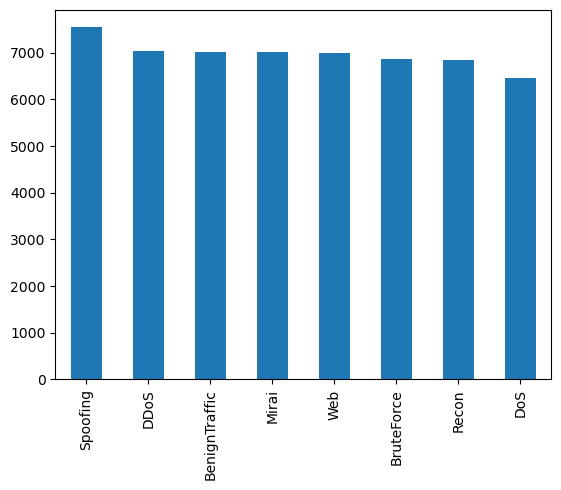

In [27]:
df_noOut.category_label.value_counts().plot(kind="bar")

In [28]:
nunique = df_noOut.nunique()
cols_to_drop = nunique[nunique == 1].index
df_noOut.drop(cols_to_drop, axis=1, inplace = True)
#df_noOut.sum()

In [29]:
df_noOut.shape

(55749, 37)

In [30]:
create_boxplot(df_noOut)

interactive(children=(Dropdown(description='Select Column', options=('flow_duration', 'Header_Length', 'Protoc…

In [31]:
create_hist(df_noOut)

interactive(children=(Dropdown(description='Select Column', options=('flow_duration', 'Header_Length', 'Protoc…

Now let's see how the dataset and the distributions have changed. Looking at the duration label, the boxplots show less outliers compared to the original dataset. 

In [32]:
df_noOut.groupby("category_label").size().sort_values(ascending=False)

category_label
Spoofing         7541
DDoS             7032
BenignTraffic    7018
Mirai            7005
Web              6991
BruteForce       6872
Recon            6839
DoS              6451
dtype: int64

We just dropped columns that have the same values, now we look for the columns that have a correlation higher than 95%.

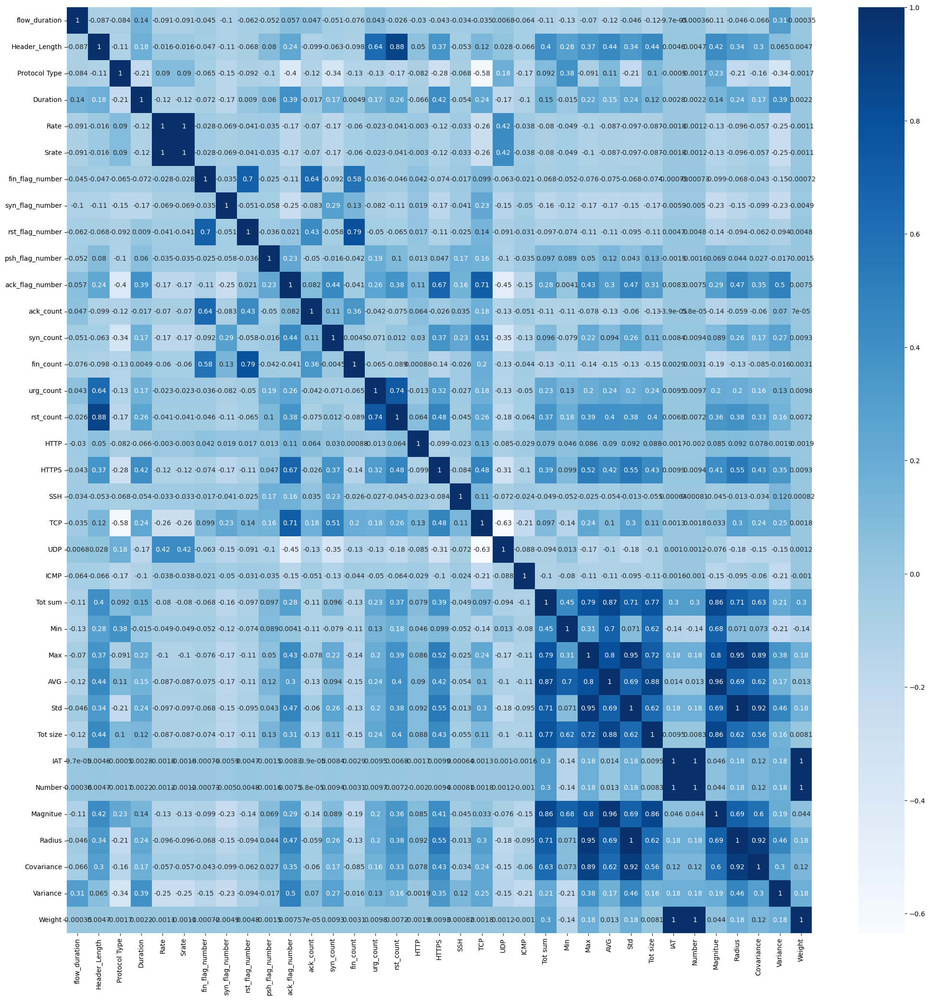

In [33]:
corr_matrix= df_noOut.corr()
plt.figure(figsize=(25,25))
sns.heatmap(corr_matrix, annot= True, cbar=True, cmap='Blues')
plt.show()

In [34]:
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

df_noOut.drop(to_drop, axis=1, inplace=True)

The columns with a correlation higher than 95% have now been dropped; We can now visualize the altered correlation matrix. 

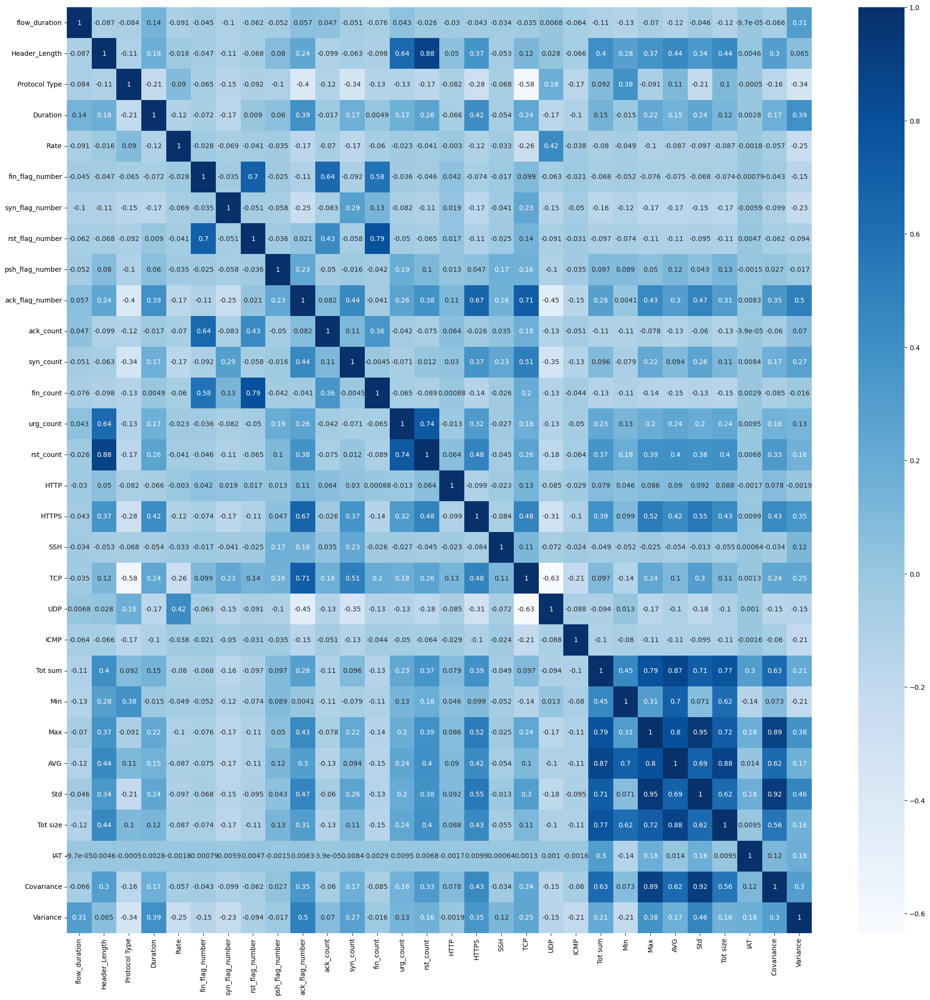

In [35]:
corr_matrix= df_noOut.corr()
plt.figure(figsize=(25,25))
sns.heatmap(corr_matrix, annot= True, cbar=True, cmap='Blues')
plt.show()

In [36]:
df_noOut.shape

(55749, 32)

In [37]:
create_boxplot(df_noOut)

interactive(children=(Dropdown(description='Select Column', options=('flow_duration', 'Header_Length', 'Protoc…

In [38]:
create_hist(df_noOut)

interactive(children=(Dropdown(description='Select Column', options=('flow_duration', 'Header_Length', 'Protoc…

In [ ]:
df_noOut.to_csv("data/df_train.csv", index=None)

In [ ]:
df_test[df_noOut.columns].to_csv("data/df_test.csv", index=None)

We now have df_train, df_test, df_test_final.

- Df_train contains the data we will use to train our classifiers that have undergone feature selection and outlier removal.
- df_test contains a small sample of data that hasn't been processed and that will be used for evaluating our classifiers while we do parameter selection.
- Df_test_final contains a large sample of the unprocessed data to evaluate the best classifiers that we will find. 

<a id="2"></a>
# Linear Classifiers

## Objective:
In this section of the project, we train linear classifiers and will evaluate:

### Accuracy
- **Explanation:** The overall correctness of predictions.
- **Formula:** $ \frac{TP + TN}{TP + TN + FP + FN} $

### Precision
- **Explanation:** Proportion of true positives among all positive predictions.
- **Formula:** $ \frac{TP}{TP + FP} $

### Recall (Sensitivity or True Positive Rate)
- **Explanation:** Proportion of actual positives correctly predicted.
- **Formula:** $ \frac{TP}{TP + FN} $

### Specificity (True Negative Rate)
- **Explanation:** Proportion of actual negatives correctly predicted.
- **Formula:** $ \frac{TN}{TN + FP} $

### F1 Score
- **Explanation:** Harmonic mean of precision and recall, balances both.
- **Formula:** $ \frac{2TP}{2TP + FP + FN} $

## Imports

In [ ]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from joblib import dump, load

from sklearn.metrics import (
    accuracy_score, 
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    ConfusionMatrixDisplay
)

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import LinearSVC, SVC

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
import time

## Preparing the data

In our analysis, we saw that there was a slightly advantage to use the MinMaxScaler (mainly time-wise) so we are using that one.

In [ ]:
df_train = pd.read_csv("data/df_train.csv")
df_test = pd.read_csv("data/df_test.csv")

print(df_train.shape)
df_test.shape

(55749, 32)


(16000, 32)

In [ ]:
df_train.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'fin_flag_number', 'syn_flag_number', 'rst_flag_number',
       'psh_flag_number', 'ack_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'SSH', 'TCP',
       'UDP', 'ICMP', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT',
       'Covariance', 'Variance', 'label', 'category_label'],
      dtype='object')

In [ ]:
X_train = df_train.drop(columns=["label", "category_label"])
X_test = df_test.drop(columns=["label", "category_label"])

y_train = df_train["category_label"]
y_test = df_test["category_label"]

Now we are scaling values in the train and the test set (everything in this case, because there are only numerical features) to have better performances and predictions.

In [ ]:
scaler = MinMaxScaler().fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

Let's save the standars scaler also for the future

In [ ]:
dump(scaler, "scalers/MinMax_scaler.bin", compress=True)

['scalers/MinMax_scaler.bin']

In [ ]:
X_train

array([[6.23926880e-05, 3.51799317e-03, 3.48251141e-01, ...,
        4.95699232e-01, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 5.52998665e-06, 1.09276559e-01, ...,
        4.95542567e-01, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 5.52998665e-06, 1.09276559e-01, ...,
        4.97168543e-01, 0.00000000e+00, 0.00000000e+00],
       ...,
       [5.26417584e-02, 7.89630890e-04, 1.54898979e-01, ...,
        9.93807472e-01, 3.51855034e-04, 1.00000000e+00],
       [1.84123318e-02, 6.30343721e-03, 1.09276559e-01, ...,
        9.93807866e-01, 1.43581019e-01, 1.00000000e+00],
       [7.85270688e-02, 5.22818251e-03, 1.80968933e-01, ...,
        2.38578678e-11, 1.37506930e-04, 9.00000000e-01]])

In [ ]:
X_test

array([[6.71990368e-04, 4.35761002e-01, 1.09276559e-01, ...,
        9.93822377e-01, 2.77462212e-01, 1.00000000e+00],
       [2.15150703e-03, 2.72177750e-04, 3.48251141e-01, ...,
        3.81115471e-11, 4.00248523e-04, 9.00000000e-01],
       [7.44866824e-05, 4.80391988e-05, 1.09276559e-01, ...,
        8.85326117e-13, 3.23289405e-05, 9.00000000e-01],
       ...,
       [6.43533149e-02, 4.53481435e-03, 1.22311536e-01, ...,
        9.93870220e-01, 3.66891909e-04, 1.00000000e+00],
       [3.28807419e-02, 6.47223493e-03, 3.00456224e-01, ...,
        8.11236054e-11, 5.70437350e-04, 9.00000000e-01],
       [0.00000000e+00, 5.52998665e-06, 1.09276559e-01, ...,
        4.97162423e-01, 0.00000000e+00, 0.00000000e+00]])

To ensure consistency, we converted the labels from strings to numerical values.

In [ ]:
label2id = {'BenignTraffic': 0, 'Mirai': 1, 'DDoS': 2, 'Spoofing': 3, 'Web': 4, 'Recon': 5, 'BruteForce': 6, 'DoS': 7}
id2label = {0: 'BenignTraffic', 1: 'Mirai', 2: 'DDoS', 3: 'Spoofing', 4: 'Web', 5: 'Recon', 6: 'BruteForce', 7: 'DoS'}
y_train = [label2id[label] for label in y_train]
y_test = [label2id[label] for label in y_test]

## df_test_final
 

In [ ]:
df_test_final = pd.read_csv("data/final_test_data.csv")
df_test_final = df_test_final[df_train.columns]

X_test_final = df_test_final.drop(columns=["label", "category_label"])
y_test_final = df_test_final["category_label"]

X_test_final = scaler.transform(X_test_final)
y_test_final = [label2id[label] for label in y_test_final]

In [ ]:
X_test_final

array([[0.00000000e+00, 5.52998665e-06, 1.09276559e-01, ...,
        4.97189731e-01, 0.00000000e+00, 0.00000000e+00],
       [2.11623367e-05, 3.54072756e-03, 3.48251141e-01, ...,
        4.95748301e-01, 0.00000000e+00, 0.00000000e+00],
       [1.62244423e-05, 1.59187117e-03, 3.48251141e-01, ...,
        4.95693809e-01, 1.35708219e-06, 5.00000000e-02],
       ...,
       [5.96485960e-02, 4.05759698e-03, 2.04866391e-01, ...,
        9.93659510e-01, 2.30069310e-02, 1.00000000e+00],
       [1.29483675e-05, 1.89453246e-05, 1.35346513e-01, ...,
        9.93807282e-01, 3.50791102e-04, 1.00000000e+00],
       [1.85072518e-02, 8.11929025e-03, 1.17966544e-01, ...,
        9.93807611e-01, 1.38643743e-04, 1.00000000e+00]])

In [ ]:
df_train.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'fin_flag_number', 'syn_flag_number', 'rst_flag_number',
       'psh_flag_number', 'ack_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'SSH', 'TCP',
       'UDP', 'ICMP', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT',
       'Covariance', 'Variance', 'label', 'category_label'],
      dtype='object')

<Axes: >

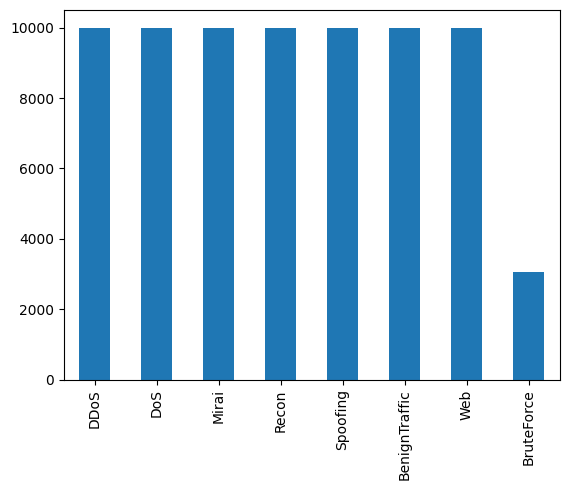

In [ ]:
df_test_final.category_label.value_counts().plot(kind='bar')

Here we import our preprocessed dataset to try linear models and see which of them predict better.

## Linear Classifiers

We are going to work with the following linear classifiers:
- Logistic Regression
- Gaussian Naive Bayes
- Support Vector Machine

## Helper Function

This helper function will help us plot the different metrics for each classifier

In [ ]:
def plot_metric(eval_dict, model_name, param_name, param_values, log_scale=False):
    fig, ax = plt.subplots(3, 2, figsize=(12, 8), sharex=True)

    metrics = {
        'Accuracy': 'list_accuracy',
        'Precision': 'list_precision',
        'Recall': 'list_recall',
        'Specificity': 'list_specificity',
        'F1': 'list_f1',
        'Training time': 'list_training_time'
    }

    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:olive', 'tab:cyan', 'tab:red']

    for i, (metric_name, metric_key) in enumerate(metrics.items()):
        x_value = list(range(0, len(eval_dict[metric_key])))
        ax[i // 2, i % 2].plot(x_value, eval_dict[metric_key], c=colors[i])
        if log_scale:
            ax[i // 2, i % 2].set_xscale('log')
        
        # Add xticks at the position of the maximum value
        max_idx = np.argmax(eval_dict[metric_key])
        max_value = eval_dict[metric_key][max_idx]
        ax[i // 2, i % 2].axvline(x=x_value[max_idx], color='lightgray', linestyle='--')
        ax[i // 2, i % 2].axhline(y=max_value, color='lightgray', linestyle='--')
        ax[i // 2, i % 2].scatter(x_value[max_idx], max_value, color='red', marker='o')
        ax[i // 2, i % 2].set_xticks(ticks=x_value, labels=param_values, rotation=90)
        
        ax[i // 2, i % 2].set_title(f'{metric_name} ({model_name})')
        ax[i // 2, i % 2].set_xlabel(param_name)
        
        # Add y-axis label (tick) for the maximum value
        ax[i // 2, i % 2].set_ylabel(metric_name)
        yticks = list(ax[i // 2, i % 2].get_yticks())
        del yticks[-2:]
        yticks.append(max_value)
        ax[i // 2, i % 2].set_yticks(yticks)
        if metric_name != 'Training time':
            ax[i // 2, i % 2].text(max_idx, eval_dict[metric_key][np.argmin(eval_dict[metric_key])], f'{param_values[max_idx]}', c='red')
        
    plt.tight_layout()
    plt.show()


## Logistic Regression

Before running the model, we must create a list of parameters for Logistic Regression and a list for each metric we want to evalute. In this case, we have chosen to work on the C parameter (regularization parameter) to look at the behaviour of Logistic Regression.

In [ ]:
list_param_LR = np.linspace(0.1, 1.0, 19)
list_param_LR

array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 ,
       0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ])

In [ ]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

# Initialize variables to keep track of the best model
best_accuracy = 0.0

for val in list_param_LR:
    # Create classifier instance
    model = LogisticRegression(max_iter=5000, tol=1e-3, C=val)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    model.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = model.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(model, 'models/linear/logistic_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)


Now we plot the performance.
### Hyperparameter C:
The metrics are based on the hyperparameter C, which:
- The higher the C, the more complex the model is because the regularization is weaker
- The lower the C, the simpler the model is because the regularization is stronger

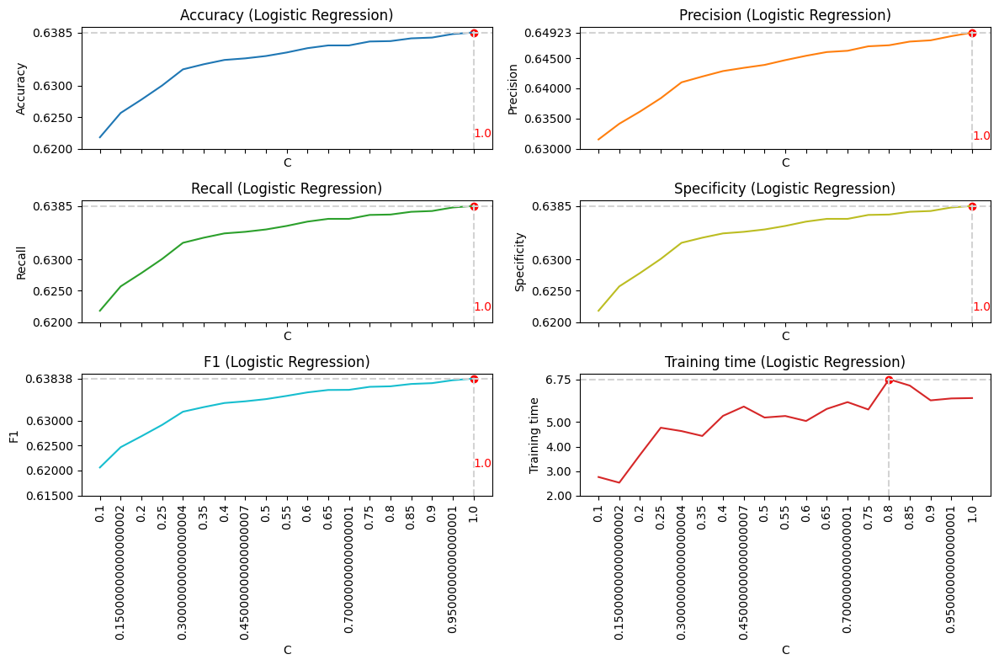

In [ ]:
plot_metric(eval_dict, 'Logistic Regression', 'C', list_param_LR)

As we can see, Logistic Regression is very fast by nature but the accuracy metric and others are not so high, which could be considered when evaluating the best model.

Now we run it on the bigger test set. 

In [ ]:
clf = load('models/linear/logistic_best.joblib')
y_pred = clf.predict(X_test_final)

In [ ]:
print(classification_report(y_test_final, y_pred,target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.65      0.68      0.67     10000
        Mirai       0.99      0.97      0.98     10000
         DDoS       0.80      0.57      0.66     10000
     Spoofing       0.65      0.58      0.62     10000
          Web       0.53      0.53      0.53     10000
        Recon       0.65      0.43      0.52     10000
   BruteForce       0.21      0.51      0.30      3064
          DoS       0.64      0.82      0.72     10000

     accuracy                           0.65     73064
    macro avg       0.64      0.64      0.62     73064
 weighted avg       0.68      0.65      0.65     73064



After rerunning the model on the bigger test set, we can see that the Accuracy metric's difference is almost negligible (.638 and .65 respectively), indicating that the model is not at risk of overfitting.

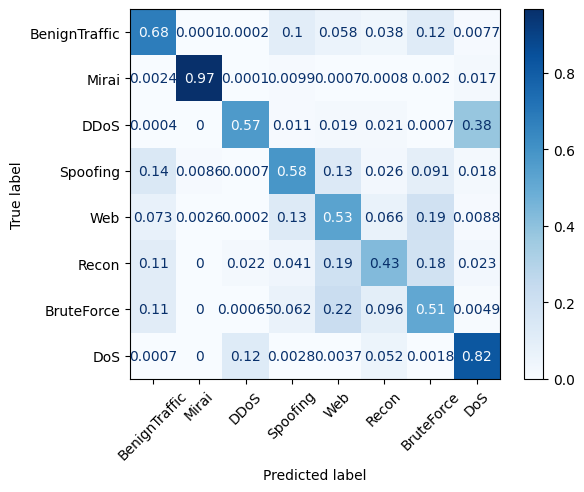

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, y_pred, display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

We can see that the model performs especially well when classifying the Mirai attack because 97% of the Mirai attacks have been correctly classified. 
On the other hand, the model performs the worst when classifying the Recon attack, with only about 43% of them being classified correctly. 

### Gaussian Naive Bayes

In Gaussian Naive Bayes we have a parameter that controls the smoothing of the variance. We used default parameters from linear classifiers class exercise.

In [ ]:
list_param_NB = np.logspace(0, -9, 19)
list_param_NB

array([1.00000000e+00, 3.16227766e-01, 1.00000000e-01, 3.16227766e-02,
       1.00000000e-02, 3.16227766e-03, 1.00000000e-03, 3.16227766e-04,
       1.00000000e-04, 3.16227766e-05, 1.00000000e-05, 3.16227766e-06,
       1.00000000e-06, 3.16227766e-07, 1.00000000e-07, 3.16227766e-08,
       1.00000000e-08, 3.16227766e-09, 1.00000000e-09])

In [ ]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

# Initialize variables to keep track of the best model
best_accuracy = 0.0

for val in list_param_NB:
    # Create classifier instance
    model = GaussianNB(var_smoothing=val)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    model.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = model.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(model, 'models/linear/NB_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)


## Plotting the Metrics

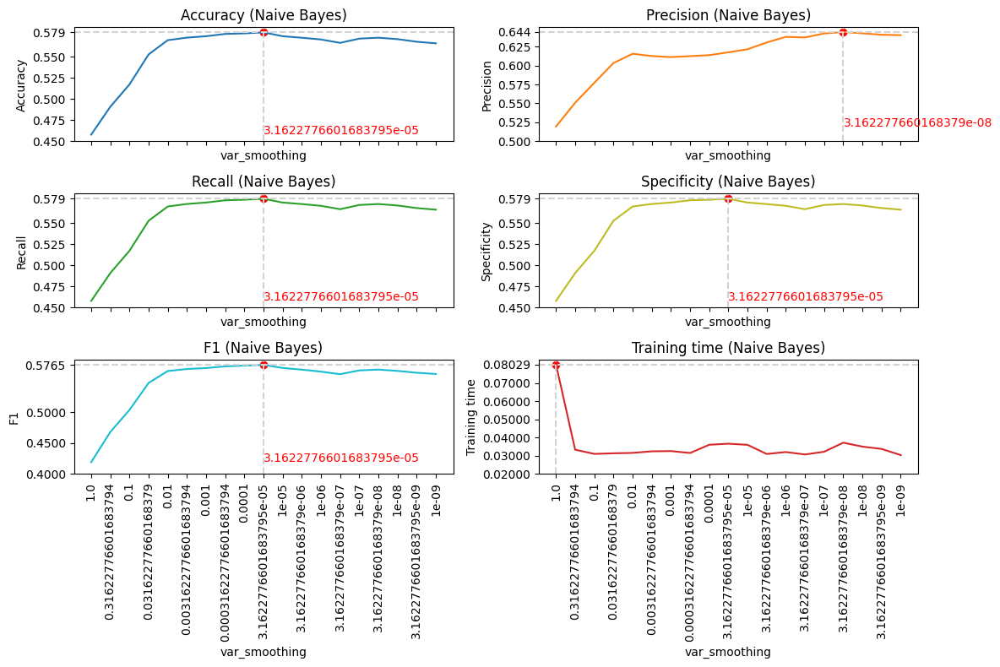

In [ ]:
plot_metric(eval_dict, 'Naive Bayes', 'var_smoothing', list_param_NB)

In [ ]:
clf = load('models/linear/NB_best.joblib')
y_pred = clf.predict(X_test_final)

In [ ]:
print(classification_report(y_test_final, y_pred,target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.49      0.72      0.58     10000
        Mirai       1.00      0.94      0.97     10000
         DDoS       0.85      0.49      0.62     10000
     Spoofing       0.54      0.30      0.39     10000
          Web       0.41      0.51      0.46     10000
        Recon       0.74      0.38      0.50     10000
   BruteForce       0.19      0.41      0.26      3064
          DoS       0.63      0.85      0.72     10000

     accuracy                           0.59     73064
    macro avg       0.61      0.58      0.56     73064
 weighted avg       0.65      0.59      0.59     73064



After rerunning the model on the bigger test set, we can see that the Accuracy metric's difference is once again almost negligible, indicating that the model is not at risk of overfitting.

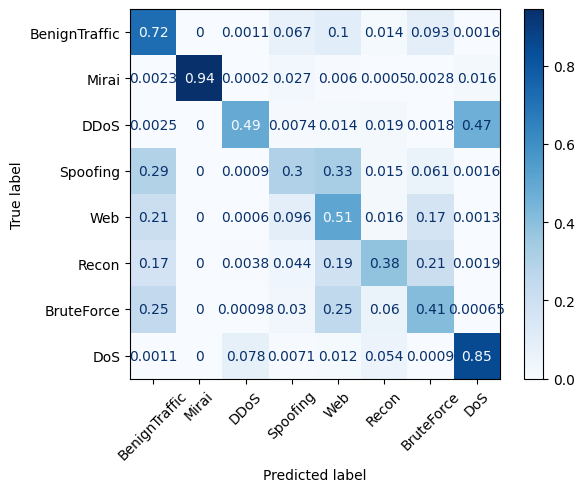

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, y_pred, display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

## Linear SVM

The hyperparameter chosen is C, in which:
- For large values of C, the optimization will choose a smaller-margin hyperplane, depending on whether the hyperplane does a better job of getting all the training points classified correctly.  
- For small values of C,  the optimizer will look for a larger-margin separating hyperplane, even if that hyperplane misclassifies more points.

In [ ]:
list_param_SVM = np.linspace(0.1, 2.0, 20)
list_param_SVM

array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. ])

In [ ]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

# Initialize variables to keep track of the best model
best_accuracy = 0.0

for val in list_param_SVM:
    model = LinearSVC(C=val, max_iter=10000)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    model.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = model.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(model, 'models/linear/linearSVC_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)


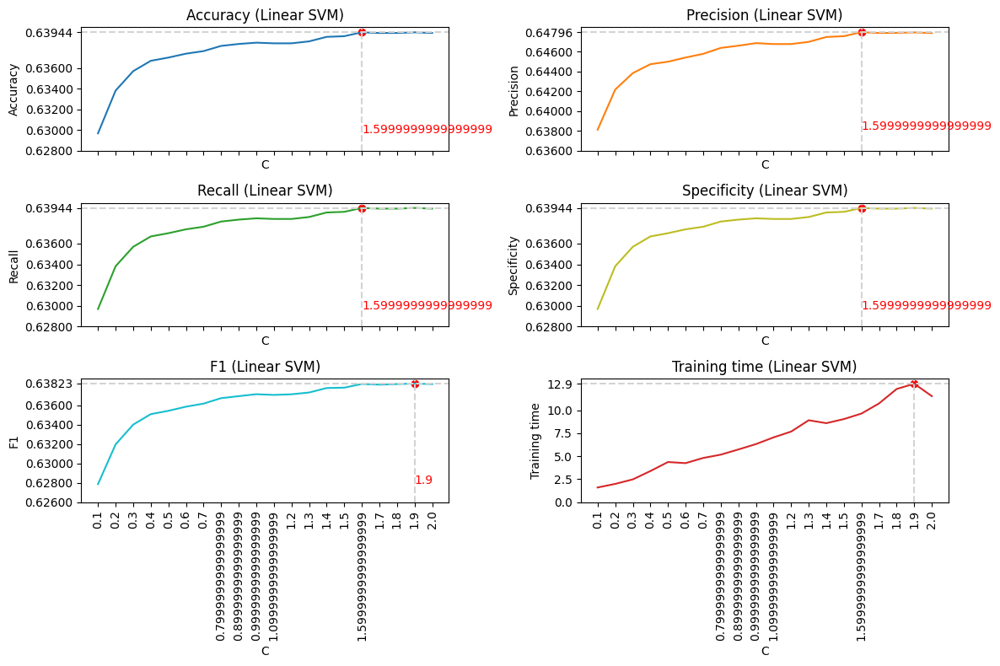

In [ ]:
plot_metric(eval_dict, 'Linear SVM', 'C', list_param_SVM)

Above we can see that as C increases (the margin decreases), we see a higher performance of our metrics. 

In [ ]:
clf = load('models/linear/linearSVC_best.joblib')
y_pred = clf.predict(X_test_final)

In [ ]:
print(classification_report(y_test_final, y_pred,target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.65      0.72      0.68     10000
        Mirai       0.98      0.97      0.98     10000
         DDoS       0.79      0.59      0.67     10000
     Spoofing       0.66      0.56      0.61     10000
          Web       0.54      0.56      0.55     10000
        Recon       0.64      0.42      0.51     10000
   BruteForce       0.22      0.48      0.30      3064
          DoS       0.64      0.81      0.72     10000

     accuracy                           0.65     73064
    macro avg       0.64      0.64      0.63     73064
 weighted avg       0.68      0.65      0.66     73064



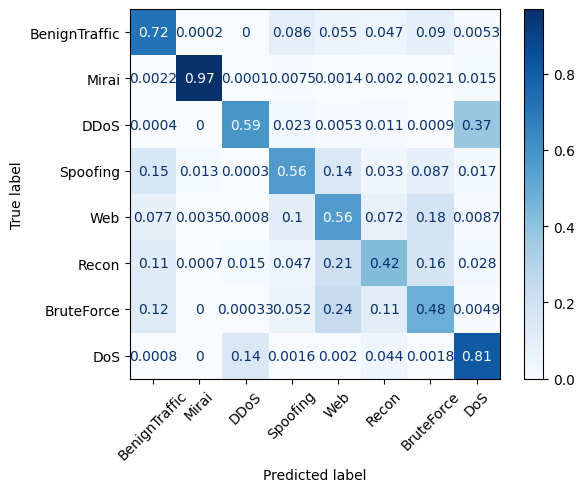

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, y_pred, display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

Also here we are happy to see that the metrics remain consistent between the small test and the big test dataset. The model is quite good at classifying Mirai, but not so great at the others (with an exception of DoS)

<a id="3"></a>
# Non Linear Classifiers

## Objective:
In this section of the project, we train non linear classifiers and will evaluate it using the same metrics described above.

Some of the following code is a repetition from before, this is because originally we were using multiple notebooks and preferred to keep the structure to run single sections if needed.

## Imports

In [ ]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from joblib import dump, load
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy import stats
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import time
from sklearn.metrics import (
    accuracy_score, 
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    average_precision_score,
    roc_curve,
    roc_auc_score
)
from sklearn.calibration import CalibrationDisplay
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_validate

## Preparing the data

In [ ]:
df_train = pd.read_csv("data/df_train.csv")
df_test = pd.read_csv("data/df_test.csv")

print(df_train.shape)
df_test.shape

(106461, 37)


(30613, 37)

In [ ]:
df_train.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'Srate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number',
       'psh_flag_number', 'ack_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'SSH', 'TCP',
       'UDP', 'ICMP', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT',
       'Number', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight',
       'label', 'category_label'],
      dtype='object')

In [ ]:
X_train = df_train.drop(columns=["label", "category_label"])
X_test = df_test.drop(columns=["label", "category_label"])

y_train = df_train["category_label"]
y_test = df_test["category_label"]

Now we are scaling values in the train and the test set (everything in this case, because there are only numerical features) to have better performances and predictions.

In [ ]:
standard_scaler = StandardScaler().fit(X_train)

X_train = standard_scaler.transform(X_train)
X_test = standard_scaler.transform(X_test)

Let's save the standars scaler also for the future

In [ ]:
#dump(standard_scaler, "scalers/standard_scaler.bin", compress=True)

In [ ]:
X_train

array([[-0.35783634, -0.38945825, -0.96776639, ..., -0.34611033,
        -1.22351325, -0.00148732],
       [-0.35783634, -0.38941128, -0.52971559, ..., -0.34611033,
        -1.22351325, -0.00148732],
       [-0.35756658, -0.38939812, -0.52971559, ..., -0.34611033,
        -1.22351325, -0.00148732],
       ...,
       [-0.24805674, -0.38403351, -0.43334441, ..., -0.34371997,
         1.03459445,  1.28693162],
       [ 0.84589391, -0.29711208, -0.14423088, ..., -0.34169314,
         0.35716214, -1.28990626],
       [-0.13634996, -0.38450125, -0.24060206, ..., -0.26270529,
         1.03459445,  1.28693162]])

In [ ]:
X_test

array([[-0.35779965, -0.38222422,  0.41910245, ..., -0.34610864,
        -0.95254032, -0.00148732],
       [-0.21566835, -0.38648426, -0.28440714, ...,  0.16990613,
         1.03459445,  1.28693162],
       [-0.28462578,  0.15191701, -0.63484778, ...,  0.24150108,
         1.03459445,  1.28693162],
       ...,
       [-0.35613823, -0.3893892 , -0.52971559, ..., -0.34611033,
        -1.22351325, -0.00148732],
       [-0.31089163, -0.38812514,  0.00470639, ..., -0.34443892,
         0.80878368, -1.28990626],
       [ 0.63260148, -0.38384772, -0.27564612, ..., -0.32699794,
         0.92168906, -0.00148732]])

In [ ]:
label2id = {'BenignTraffic': 0, 'Mirai': 1, 'DDoS': 2, 'Spoofing': 3, 'Web': 4, 'Recon': 5, 'BruteForce': 6, 'DoS': 7}
id2label = {0: 'BenignTraffic', 1: 'Mirai', 2: 'DDoS', 3: 'Spoofing', 4: 'Web', 5: 'Recon', 6: 'BruteForce', 7: 'DoS'}
y_train = [label2id[label] for label in y_train]
y_test = [label2id[label] for label in y_test]

Let's prepare also the final test we will use with each best classifier

In [ ]:
df_test_final = pd.read_csv("data/final_test_data.csv")
df_test_final = df_test_final[df_train.columns]

X_test_final = df_test_final.drop(columns=["label", "category_label"])
y_test_final = df_test_final["category_label"]

X_test_final = standard_scaler.transform(X_test_final)
y_test_final = [label2id[label] for label in y_test_final]

In [ ]:
X_test_final

array([[-0.35783634, -0.38941128, -0.52971559, ..., -0.34611033,
        -1.22351325, -0.00148732],
       [-0.35754794, -0.35938168,  0.43399618, ..., -0.34611033,
        -1.22351325, -0.00148732],
       [-0.35761523, -0.37593616,  0.43399618, ..., -0.34609245,
        -1.11060786, -0.00148732],
       ...,
       [ 0.45506423, -0.35499115, -0.14423088, ..., -0.04296205,
         1.03459445,  1.28693162],
       [-0.35765988, -0.38929732, -0.42458339, ..., -0.34148817,
         1.03459445,  1.28693162],
       [-0.10561657, -0.32048926, -0.49467152, ..., -0.3442835 ,
         1.03459445,  1.28693162]])

In [ ]:
df_train.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'Srate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number',
       'psh_flag_number', 'ack_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'SSH', 'TCP',
       'UDP', 'ICMP', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT',
       'Number', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight',
       'label', 'category_label'],
      dtype='object')

<Axes: >

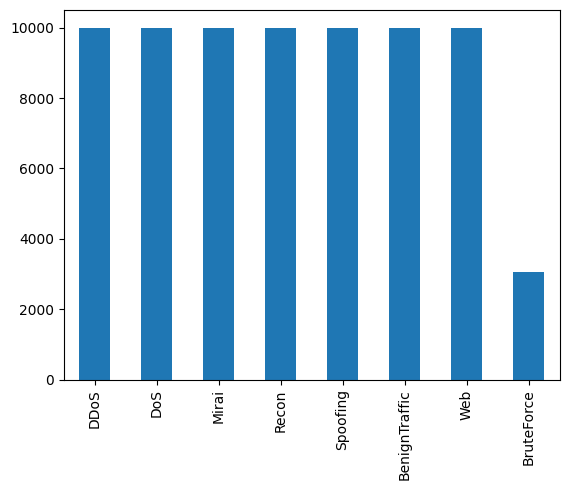

In [ ]:
df_test_final.category_label.value_counts().plot(kind='bar')

<h1> NON-LINEAR CLASSIFIERS </h1>

### Helper Function

In [ ]:
def plot_metric(eval_dict, model_name, param_name, param_values, log_scale=False):
    fig, ax = plt.subplots(3, 2, figsize=(12, 8), sharex=True)

    metrics = {
        'Accuracy': 'list_accuracy',
        'Precision': 'list_precision',
        'Recall': 'list_recall',
        'Specificity': 'list_specificity',
        'F1': 'list_f1',
        'Training time': 'list_training_time'
    }

    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:olive', 'tab:cyan', 'tab:red']

    for i, (metric_name, metric_key) in enumerate(metrics.items()):
        x_value = list(range(0, len(eval_dict[metric_key])))
        ax[i // 2, i % 2].plot(x_value, eval_dict[metric_key], c=colors[i])
        if log_scale:
            ax[i // 2, i % 2].set_xscale('log')
        
        # Add xticks at the position of the maximum value
        max_idx = np.argmax(eval_dict[metric_key])
        max_value = eval_dict[metric_key][max_idx]
        ax[i // 2, i % 2].axvline(x=x_value[max_idx], color='lightgray', linestyle='--')
        ax[i // 2, i % 2].axhline(y=max_value, color='lightgray', linestyle='--')
        ax[i // 2, i % 2].scatter(x_value[max_idx], max_value, color='red', marker='o')
        ax[i // 2, i % 2].set_xticks(ticks=x_value, labels=param_values, rotation=90)
        
        ax[i // 2, i % 2].set_title(f'{metric_name} ({model_name})')
        ax[i // 2, i % 2].set_xlabel(param_name)
        
        # Add y-axis label (tick) for the maximum value
        ax[i // 2, i % 2].set_ylabel(metric_name)
        yticks = list(ax[i // 2, i % 2].get_yticks())
        del yticks[-2:]
        yticks.append(max_value)
        ax[i // 2, i % 2].set_yticks(yticks)
        if metric_name != 'Training time':
            ax[i // 2, i % 2].text(max_idx, eval_dict[metric_key][np.argmin(eval_dict[metric_key])], f'{param_values[max_idx]}', c='red')
        
    plt.tight_layout()
    plt.show()


<h2> k-Nearest-Neighbors </h2>

Now let's create the list of parameters for k-Nearest-Neighbors and a list for each metrics: we will evaluate them for each parameter in the list. In this case, we have chosen to do from 1 to 50 neighbors because the dataset is big, so we could try more neighbors than just 5 having good perfomances. Then, we will plot and analyze the metrics.

In [ ]:
list_param_k_nearest_neighbors = range(1,50)

In [ ]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

In [ ]:
# Initialize variables to keep track of the best model
best_accuracy = 0.0

for val in list_param_k_nearest_neighbors:
    # Create classifier instance
    clf = KNeighborsClassifier(n_neighbors=val, )
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/nonLinear/knn_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

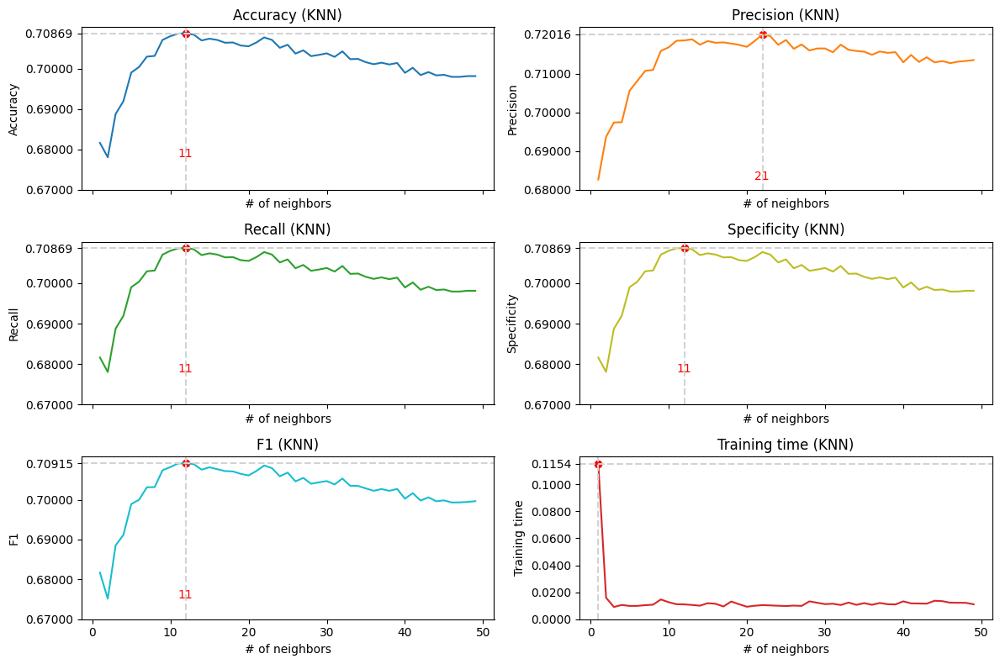

In [ ]:
plot_metric(eval_dict, 'KNN', '# of neighbors', list_param_k_nearest_neighbors)

As we can see from the metrics, for the number of neighbors between 1 and 11 (21 for precision) the scores of the metrics start to grow, but from 11 (21 for precision) it decreases; This is because analyzing too many neighbors at once could result in underfitting- the association of wrong labels (for the property of the algorithm). Also, we had the greatest time performances with kNN: this is because it does not do anything complicated, it just needs to calculate the distances between point in the n-dimension space and K neighbors, so these are very basic actions to perform for the machine.

let's now load the best (k = 11) model and analyze the confusion matrix for this model

In [ ]:
clf = load('models/nonLinear/knn_best.joblib')
y_pred = clf.predict(X_test_final)

In [ ]:
print(classification_report(y_test_final, y_pred,target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.63      0.72      0.67     10000
        Mirai       1.00      0.97      0.99     10000
         DDoS       0.84      0.86      0.85     10000
     Spoofing       0.70      0.58      0.63     10000
          Web       0.57      0.63      0.60     10000
        Recon       0.78      0.52      0.63     10000
   BruteForce       0.30      0.54      0.38      3064
          DoS       0.80      0.82      0.81     10000

     accuracy                           0.72     73064
    macro avg       0.70      0.71      0.70     73064
 weighted avg       0.74      0.72      0.73     73064



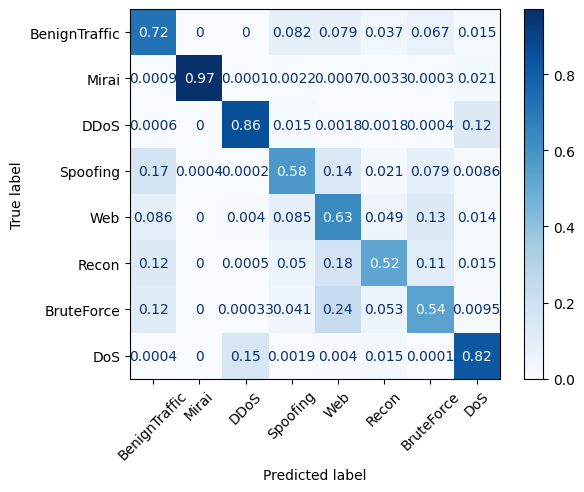

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, y_pred, display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

We can already see that it performs better, and we are happy to see that the DDoS and the DoS are better recognized between each other (before many DDoS were classified as DoS)

<h2> Decision Tree </h2>

Now we will try with Decision Tree.Let's create the list of parameters for Decision Tree classifier and a list for each metrics: we will evaluate them for each parameter in the list. In this case, we have chosen to do from 3 to 200 as a max_depth, and a step of 5 to look at the behaviour of Decision Tree classifier based on how much it can increase its perfomance with the increasing of the max_depth we want to reach. Then, we will plot and analyze the metrics.

In [ ]:
list_param_decision_tree = range(3, 200, 5)

In [ ]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

In [ ]:
# Initialize variables to keep track of the best model
best_accuracy = 0.0

for val in list_param_decision_tree:
    # Create classifier instance
    clf = DecisionTreeClassifier(max_depth=val, random_state=777)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/nonLinear/DT_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

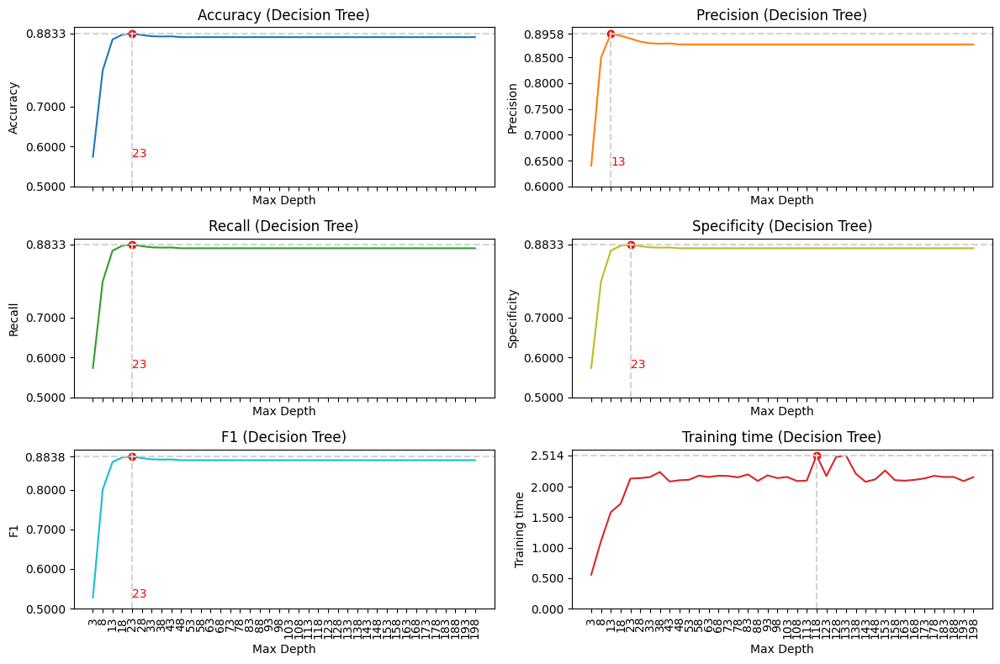

In [ ]:
plot_metric(eval_dict, 'Decision Tree', 'Max Depth', list_param_decision_tree)

As we can see from the plots, from around a max_depth of 23-25 the metrics are converging. In this case, another important metric to consider is time: note that the greater the max_depth we want to reach, greater will be the peaks of the time. It's much faster than other classifiers because Decison Trees work well on large datasets. Other than time perfomances, we had a higher accuracy, precision, recall, specificity and f1 values than the other classifiers: this is because Decision Trees work in general very well on multi labelled dataset.

let's now load the best (max_depth = 23) model and analyze the confusion matrix for this model

In [ ]:
clf = load('models/nonLinear/DT_best.joblib')
y_pred = clf.predict(X_test_final)

In [ ]:
print(classification_report(y_test_final, y_pred, target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.86      0.85      0.86     10000
        Mirai       1.00      0.98      0.99     10000
         DDoS       1.00      0.96      0.98     10000
     Spoofing       0.84      0.81      0.83     10000
          Web       0.76      0.86      0.80     10000
        Recon       0.86      0.77      0.81     10000
   BruteForce       0.59      0.77      0.67      3064
          DoS       1.00      0.98      0.99     10000

     accuracy                           0.88     73064
    macro avg       0.86      0.87      0.86     73064
 weighted avg       0.89      0.88      0.88     73064



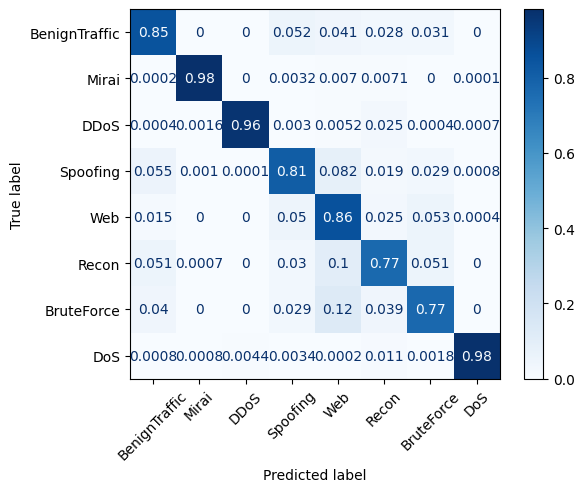

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, y_pred, display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

As seen above, the label-based performance is significantly better than the other models. 

<h3> Kernel Support Vector Machines </h3>

Now we will try with Kernel Support Vector Machines.Let's create the list of parameters for Kernel Support Vector Machines classifier and a list for each metrics: we will evaluate them for each parameter in the list. In this case, we have chosen to work on the C parameter (regularization parameter) to look at the behaviour of Kernel Support Vector Machines classifier.Then, we will plot and analyze the metrics.

In [ ]:
list_param_kernel_support_vector_machines = [0.1, 0.5, 1.0, 2.5, 5.0]

In [ ]:
eval_dict = {'list_accuracy': [],
            'list_precision': [],
            'list_recall': [],
            'list_specificity': [],
            'list_f1': [],
            'list_training_time': []}

In [ ]:
# Initialize variables to keep track of the best model
best_accuracy = 0.0

for val in list_param_kernel_support_vector_machines:
    # Create classifier instance
    clf = SVC(C=val, random_state=777)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/nonLinear/kernel_SVM_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

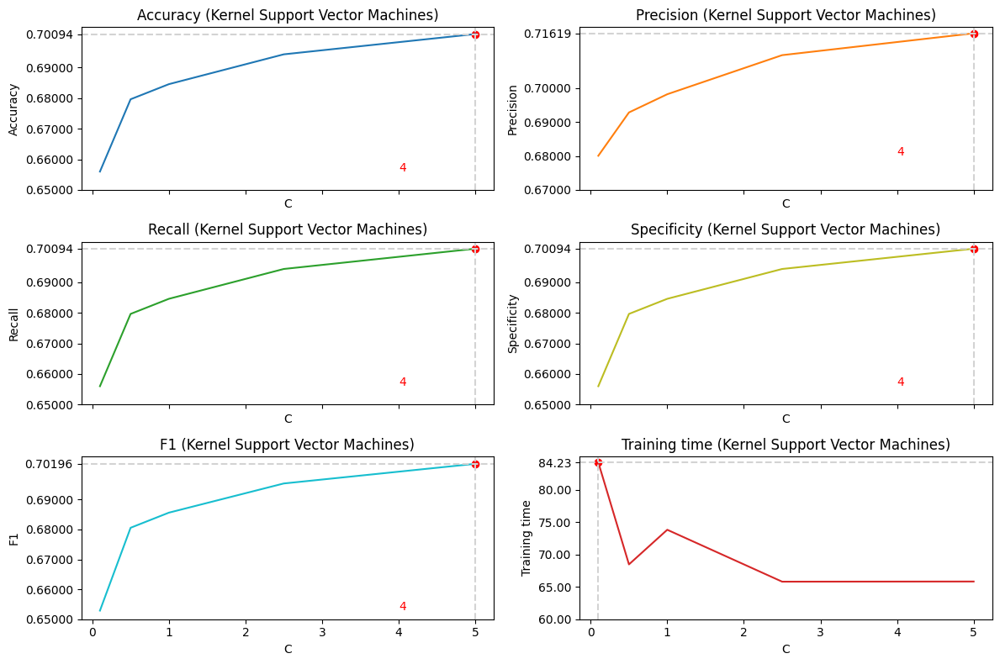

In [ ]:
plot_metric(eval_dict, 'Kernel Support Vector Machines', 'C', list_param_kernel_support_vector_machines)

As we can see, Kernel SVM is a very slow non linear classifier for this dataset: this is because we are working on a relatively large dataset, and we know that complexity of training kernelized SVM grows quadratically with number of training samples. The general trend of performance remains the same: as C increases, the performance increases. 

let's now load the best (C=) model and analyze the confusion matrix for this model

In [ ]:
clf = load('models/nonLinear/kernel_SVM_best.joblib')
y_pred = clf.predict(X_test_final)

It takes quite long to predict (4 min)

In [ ]:
print(classification_report(y_test_final, y_pred,target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.73      0.74      0.74     10000
        Mirai       1.00      0.97      0.98     10000
         DDoS       0.76      0.72      0.74     10000
     Spoofing       0.66      0.63      0.65     10000
          Web       0.59      0.72      0.65     10000
        Recon       0.85      0.51      0.64     10000
   BruteForce       0.30      0.60      0.40      3064
          DoS       0.76      0.75      0.75     10000

     accuracy                           0.72     73064
    macro avg       0.71      0.71      0.69     73064
 weighted avg       0.74      0.72      0.72     73064



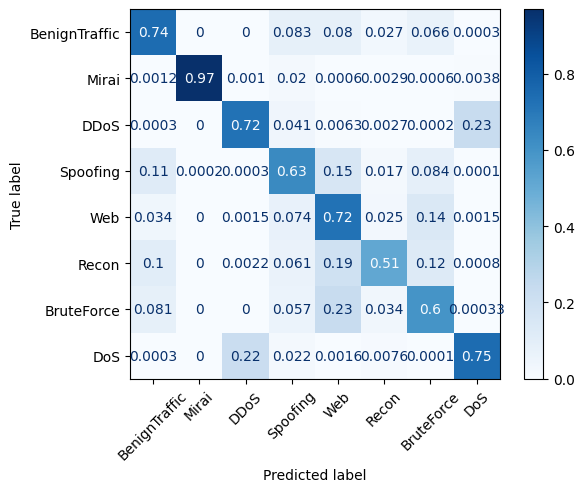

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, y_pred, display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

<h3> Neural Networks </h3>

Now we will try with Neural Networks. In this case, the parameter under consideration is the number of hidden layers to look at the behaviour of the NN classifier. Then, we will plot and analyze the metrics.
We chose to keep a low number of perceptrons within each layer in order to maintain time efficiency and also considering the size and complexity of our dataset.

In [ ]:
list_param_neural_networks = [(10),(50),(50, 10),(50, 50),(100, 50, 10)]

In [ ]:
eval_dict = {'list_accuracy': [],
            'list_precision': [],
            'list_recall': [],
            'list_specificity': [],
            'list_f1': [],
            'list_training_time': []}

In this case, the default number of iterations (200) was not sufficient to make the optimization converge, so we needed to increase it.

In [ ]:
# Initialize variables to keep track of the best model
best_accuracy = 0.0

for val in list_param_neural_networks:
    # Create classifier instance
    clf = MLPClassifier(hidden_layer_sizes=val, max_iter=2000, random_state=777, early_stopping=True, n_iter_no_change=100)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/nonLinear/NN_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

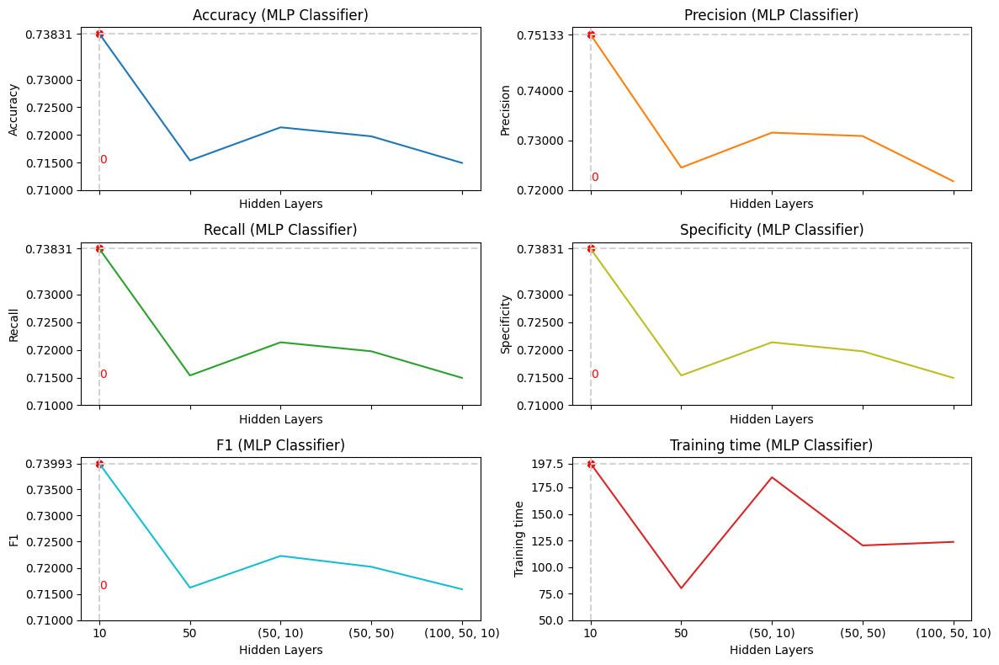

In [ ]:
plot_metric(eval_dict, 'MLP Classifier', 'Hidden Layers', list_param_neural_networks)

A we can see, the time increases when the hidden layer size is greater (obviously, because this means that it has to pass through more layers). The peaks for the other metrics seems to be around the range of 150-200 hidden layers, then values start to decrease despite the number of hidden layers increase.

One of the possible explanations for this performance is because the neural network with more layers "overfits" the training data and performs worse on test data as a result. A neural network with less layers tends to generalize more, and therefore may make more sense considering the low complexity of our data.

let's now load the best (hidden_layer = ) model and analyze the confusion matrix for this model

In [ ]:
clf = load('models/nonLinear/NN_best.joblib')
y_pred = clf.predict(X_test_final)

In [ ]:
print(classification_report(y_test_final, y_pred,target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.73      0.75      0.74     10000
        Mirai       1.00      0.96      0.98     10000
         DDoS       0.93      0.91      0.92     10000
     Spoofing       0.75      0.63      0.68     10000
          Web       0.57      0.69      0.63     10000
        Recon       0.73      0.50      0.59     10000
   BruteForce       0.28      0.56      0.37      3064
          DoS       0.90      0.89      0.90     10000

     accuracy                           0.75     73064
    macro avg       0.74      0.74      0.73     73064
 weighted avg       0.78      0.75      0.76     73064



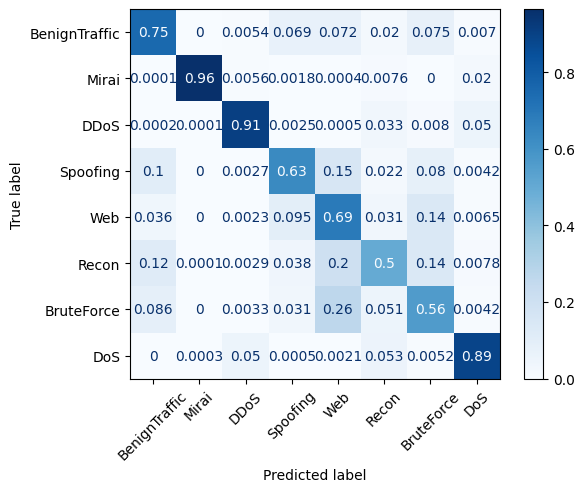

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, y_pred, display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

## Conclusions

From our analysis, the decision tree model performs the best out of all the non-linear classifiers

<a id="4"></a>
# Ensemble Classifiers

## Objective:
In this section of the project, we train ensemble classifiers and will evaluate it using the same metrics described above.

Some of the following code is a repetition from before, this is because originally we were using multiple notebooks and preferred to keep the structure to run single sections if needed.

In [41]:
!pip3 install xgboost

  Obtaining dependency information for xgboost from https://files.pythonhosted.org/packages/bc/43/242432efc3f60052a4a534dc4926b21e236ab4ec8d4920c593da3f65c65d/xgboost-2.0.2-py3-none-win_amd64.whl.metadata
   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB 640.0 kB/s eta 0:02:36
   ---------------------------------------- 0.1/99.8 MB 1.3 MB/s eta 0:01:17
   ---------------------------------------- 0.2/99.8 MB 1.8 MB/s eta 0:00:56
   ---------------------------------------- 0.3/99.8 MB 1.9 MB/s eta 0:00:53
   ---------------------------------------- 0.4/99.8 MB 1.7 MB/s eta 0:00:58
   ---------------------------------------- 0.5/99.8 MB 1.9 MB/s eta 0:00:53
   ---------------------------------------- 0.6/99.8 MB 2.0 MB/s eta 0:00:49
   ---------------------------------------- 0.7/99.8 MB 2.1 MB/s eta 0:00:48
   ---------------------------------------- 0.8/99.8 MB 2.1 MB/s eta 0:00:47
   ---------------------------

## Imports

In [42]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import os
from joblib import dump, load
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy import stats

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier, plot_importance
from sklearn.neural_network import MLPClassifier

import time
from sklearn.metrics import (
    accuracy_score, 
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    average_precision_score,
    roc_curve,
    roc_auc_score
)
from sklearn.calibration import CalibrationDisplay
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [43]:
df_train = pd.read_csv("data/df_train.csv")
df_test = pd.read_csv("data/df_test.csv")

print(df_train.shape)
df_test.shape

(55749, 32)


(16000, 32)

In [44]:
df_train.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'fin_flag_number', 'syn_flag_number', 'rst_flag_number',
       'psh_flag_number', 'ack_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'SSH', 'TCP',
       'UDP', 'ICMP', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT',
       'Covariance', 'Variance', 'label', 'category_label'],
      dtype='object')

In [45]:
X_train = df_train.drop(columns=["label", "category_label"])
X_test = df_test.drop(columns=["label", "category_label"])

y_train = df_train["category_label"]
y_test = df_test["category_label"]

Now we are scaling values in the train and the test set (everything in this case, because there are only numerical features) to have better performances and predictions.

In [46]:
standard_scaler = StandardScaler().fit(X_train)

X_train = standard_scaler.transform(X_train)
X_test = standard_scaler.transform(X_test)

Let's save the standars scaler also for the future

In [47]:
dump(standard_scaler, "scalers/standard_scaler.bin", compress=True)

['scalers/standard_scaler.bin']

In [48]:
X_train

array([[-0.36801019, -0.35346166,  0.46054157, ..., -0.01018213,
        -0.35051081, -1.27017796],
       [-0.36888444, -0.38354661, -0.52506693, ..., -0.01058209,
        -0.35051081, -1.27017796],
       [-0.36888444, -0.38354661, -0.52506693, ..., -0.00643102,
        -0.35051081, -1.27017796],
       ...,
       [ 0.36874052, -0.37683062, -0.33690531, ...,  1.26147349,
        -0.34579192,  0.99974844],
       [-0.11088783, -0.32960377, -0.52506693, ...,  1.2614745 ,
         1.57512056,  0.99974844],
       [ 0.73144974, -0.33881354, -0.22938438, ..., -1.27568763,
        -0.34866664,  0.7727558 ]])

In [49]:
X_test

array([[-0.3594684 ,  3.34878602, -0.52506693, ...,  1.26151154,
         3.37066307,  0.99974844],
       [-0.33873717, -0.38126271,  0.46054157, ..., -1.27568763,
        -0.3451429 ,  0.7727558 ],
       [-0.36784072, -0.38318251, -0.52506693, ..., -1.27568763,
        -0.35007724,  0.7727558 ],
       ...,
       [ 0.53284477, -0.34475238, -0.47130647, ...,  1.26163369,
        -0.34559026,  0.99974844],
       [ 0.09184591, -0.32815799,  0.26341987, ..., -1.27568763,
        -0.34286041,  0.7727558 ],
       [-0.36888444, -0.38354661, -0.52506693, ..., -0.00644665,
        -0.35051081, -1.27017796]])

In [50]:
label2id = {'BenignTraffic': 0, 'Mirai': 1, 'DDoS': 2, 'Spoofing': 3, 'Web': 4, 'Recon': 5, 'BruteForce': 6, 'DoS': 7}
id2label = {0: 'BenignTraffic', 1: 'Mirai', 2: 'DDoS', 3: 'Spoofing', 4: 'Web', 5: 'Recon', 6: 'BruteForce', 7: 'DoS'}
y_train = [label2id[label] for label in y_train]
y_test = [label2id[label] for label in y_test]

## Let's prepare also the final test we will use with each best classifier

In [51]:
df_test_final = pd.read_csv("data/final_test_data.csv")
df_test_final = df_test_final[df_train.columns]

X_test_final = df_test_final.drop(columns=["label", "category_label"])
y_test_final = df_test_final["category_label"]

X_test_final = standard_scaler.transform(X_test_final)
y_test_final = [label2id[label] for label in y_test_final]

In [52]:
X_test_final

array([[-0.36888444, -0.38354661, -0.52506693, ..., -0.00637693,
        -0.35051081, -1.27017796],
       [-0.36858791, -0.35326693,  0.46054157, ..., -0.01005686,
        -0.35051081, -1.27017796],
       [-0.3686571 , -0.36995928,  0.46054157, ..., -0.01019597,
        -0.35049261, -1.15668164],
       ...,
       [ 0.46692148, -0.34883984, -0.13082353, ...,  1.26109575,
        -0.04195424,  0.99974844],
       [-0.36870301, -0.3834317 , -0.417546  , ...,  1.26147301,
        -0.34580619,  0.99974844],
       [-0.10955779, -0.31405063, -0.48922662, ...,  1.26147385,
        -0.3486514 ,  0.99974844]])

In [53]:
df_train.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'fin_flag_number', 'syn_flag_number', 'rst_flag_number',
       'psh_flag_number', 'ack_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'SSH', 'TCP',
       'UDP', 'ICMP', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT',
       'Covariance', 'Variance', 'label', 'category_label'],
      dtype='object')

<Axes: >

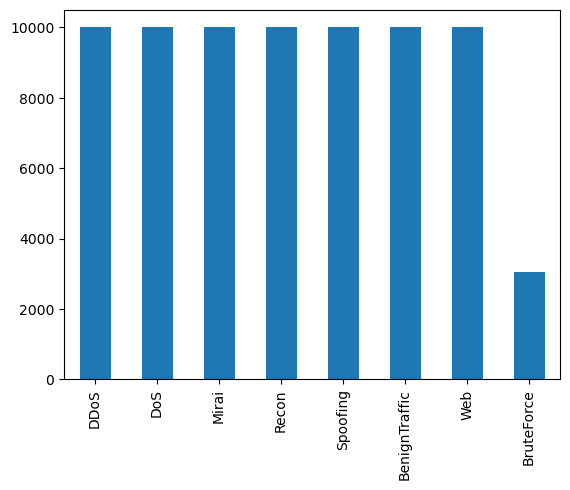

In [54]:
df_test_final.category_label.value_counts().plot(kind='bar')

## ENSEMBLE CLASSIFIERS

### Helper Function

In [55]:
def plot_metric(eval_dict, model_name, param_name, param_values, log_scale=False):
    fig, ax = plt.subplots(3, 2, figsize=(12, 8), sharex=True)

    metrics = {
        'Accuracy': 'list_accuracy',
        'Precision': 'list_precision',
        'Recall': 'list_recall',
        'Specificity': 'list_specificity',
        'F1': 'list_f1',
        'Training time': 'list_training_time'
    }

    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:olive', 'tab:cyan', 'tab:red']

    for i, (metric_name, metric_key) in enumerate(metrics.items()):
        x_value = list(range(0, len(eval_dict[metric_key])))
        ax[i // 2, i % 2].plot(x_value, eval_dict[metric_key], c=colors[i])
        if log_scale:
            ax[i // 2, i % 2].set_xscale('log')
        
        # Add xticks at the position of the maximum value
        max_idx = np.argmax(eval_dict[metric_key])
        max_value = eval_dict[metric_key][max_idx]
        ax[i // 2, i % 2].axvline(x=x_value[max_idx], color='lightgray', linestyle='--')
        ax[i // 2, i % 2].axhline(y=max_value, color='lightgray', linestyle='--')
        ax[i // 2, i % 2].scatter(x_value[max_idx], max_value, color='red', marker='o')
        ax[i // 2, i % 2].set_xticks(ticks=x_value, labels=param_values, rotation=90)
        
        ax[i // 2, i % 2].set_title(f'{metric_name} ({model_name})')
        ax[i // 2, i % 2].set_xlabel(param_name)
        
        # Add y-axis label (tick) for the maximum value
        ax[i // 2, i % 2].set_ylabel(metric_name)
        yticks = list(ax[i // 2, i % 2].get_yticks())
        del yticks[-2:]
        yticks.append(max_value)
        ax[i // 2, i % 2].set_yticks(yticks)
        if metric_name != 'Training time':
            ax[i // 2, i % 2].text(max_idx, eval_dict[metric_key][np.argmin(eval_dict[metric_key])], f'{param_values[max_idx]}', c='red')
        
    plt.tight_layout()
    plt.show()


## XGBoost

For XGBoost, the parameter we are considering is the number of estimators- which are the number of trees.

In [ ]:
list_estimators = range(1, 200, 5)

In [ ]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

In [ ]:
best_accuracy = 0.0

for val in list_estimators:
    # Create classifier instance
    clf = XGBClassifier(n_estimators=val, n_jobs=-1, random_state=777)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/ensemble/xgb_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

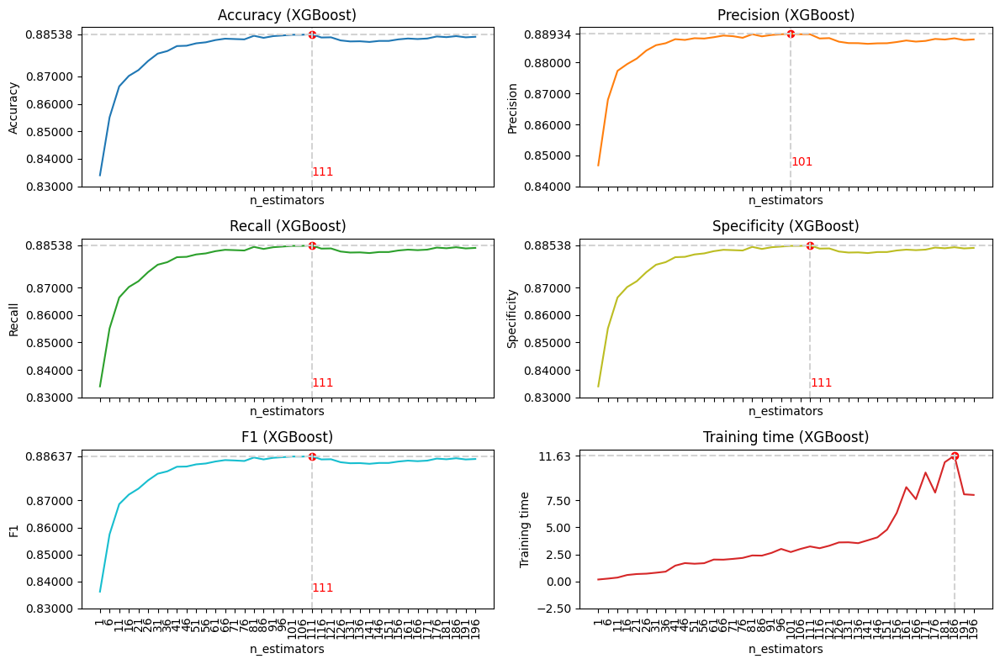

In [ ]:
plot_metric(eval_dict, 'XGBoost', 'n_estimators', list_estimators)

Overall, the model performance tends to reach an optimal performance with 111 estimators (except for precision, which has 101 estimators)

In [ ]:
clf = load('models/ensemble/xgb_best.joblib')
y_pred = clf.predict(X_test_final)

In [ ]:
print(classification_report(y_test_final, y_pred, target_names=label2id.keys()))

               precision    recall  f1-score   support

BenignTraffic       0.87      0.88      0.88     10000
        Mirai       1.00      0.98      0.99     10000
         DDoS       1.00      0.96      0.98     10000
     Spoofing       0.87      0.83      0.85     10000
          Web       0.78      0.87      0.82     10000
        Recon       0.86      0.78      0.82     10000
   BruteForce       0.60      0.81      0.69      3064
          DoS       1.00      0.97      0.98     10000

     accuracy                           0.89     73064
    macro avg       0.87      0.88      0.88     73064
 weighted avg       0.90      0.89      0.89     73064



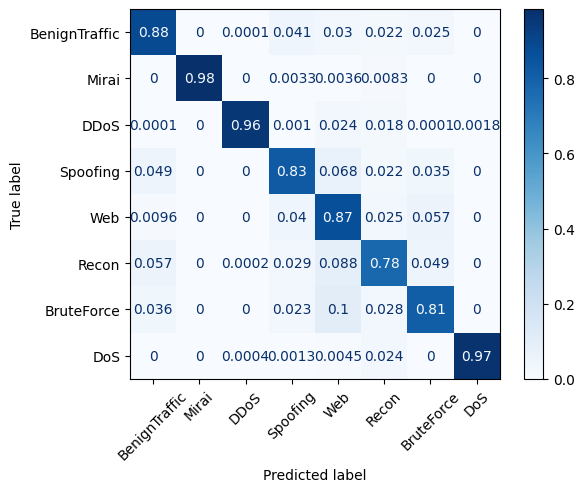

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, y_pred, display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

Let's try some features selection

In [ ]:
feature_names = df_train.drop(columns=["label", "category_label"]).columns
feature_importance = clf.feature_importances_
feature_importance_dict = dict(zip(feature_names, feature_importance))
sorted_features = sorted(feature_importance_dict.items(), key=lambda x: x[1])

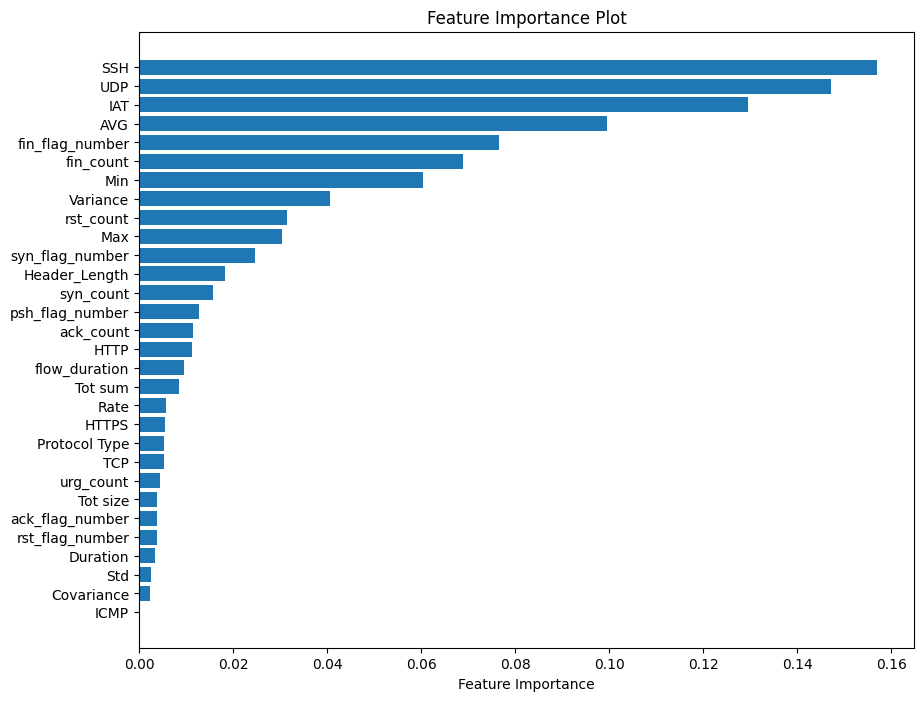

In [ ]:
feature_names, importance_values = zip(*sorted_features)

plt.figure(figsize=(10, 8))
plt.barh(range(len(feature_names)), importance_values, align='center')
plt.yticks(range(len(feature_names)), feature_names)
plt.xlabel('Feature Importance')
plt.title('Feature Importance Plot')
plt.show()

XGBoost gives importance to certain features by selecting the most relevant ones. What is important to notice is the threshold value can be chosen arbitrarily, it just is a matter of how complex you want the complexity of analysis to be. We decided to set the threshold as feature importance= 0.05.


In [ ]:
important_features = [feature for feature, importance in sorted_features if importance >= 0.05]

In [ ]:
important_features

['Min', 'fin_count', 'fin_flag_number', 'AVG', 'IAT', 'UDP', 'SSH']

In [ ]:
list_estimators = range(1, 200, 10)

In [ ]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

In [ ]:
X_train_xgb_important = df_train[important_features]
X_test_xgb_important = df_test[important_features]
X_train_xgb_important = standard_scaler.fit_transform(X_train_xgb_important)
X_test_xgb_important = standard_scaler.transform(X_test_xgb_important)

In [ ]:
best_accuracy = 0.0

for val in list_estimators:
    # Create classifier instance
    clf = XGBClassifier(n_estimators=val, n_jobs=-1, random_state=777)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train_xgb_important, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test_xgb_important)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/ensemble/xgb_best_feature_importance_05.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

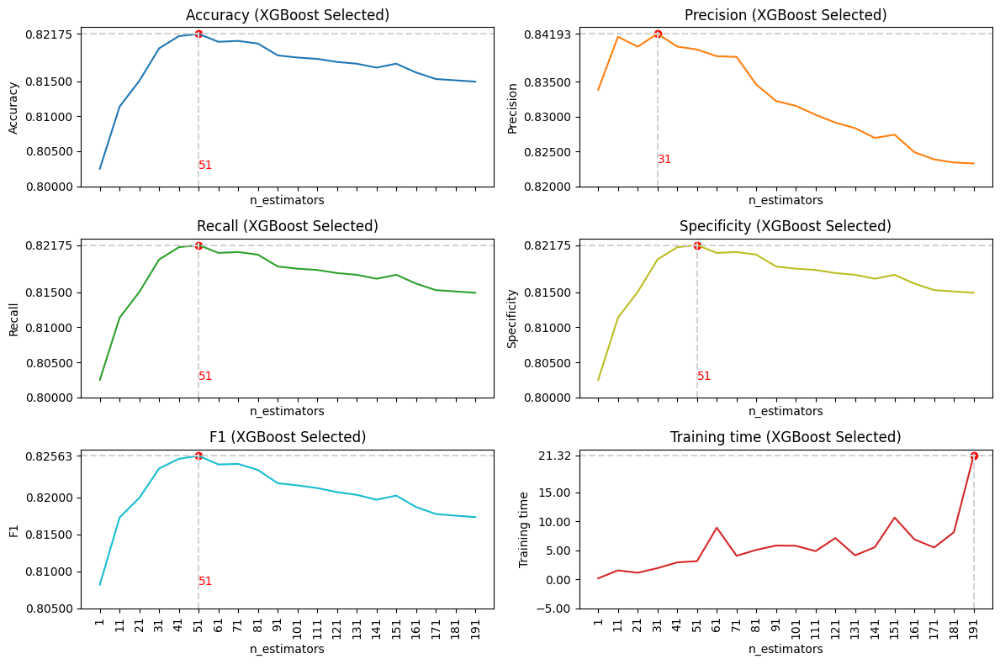

In [ ]:
plot_metric(eval_dict, 'XGBoost Selected', 'n_estimators', list_estimators)

Compared to before, the optimal number of estimators selected are 51 (as opposed to 111). We can see that the performance is much worse with this threshold, let's try with a smaller one.

In [ ]:
important_features = [feature for feature, importance in sorted_features if importance >= 0.02]

In [ ]:
important_features

['syn_flag_number',
 'Max',
 'rst_count',
 'Variance',
 'Min',
 'fin_count',
 'fin_flag_number',
 'AVG',
 'IAT',
 'UDP',
 'SSH']

In [ ]:
list_estimators = range(1, 200, 10)

In [ ]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

In [ ]:
X_train_xgb_important = df_train[important_features]
X_test_xgb_important = df_test[important_features]
X_train_xgb_important = standard_scaler.fit_transform(X_train_xgb_important)
X_test_xgb_important = standard_scaler.transform(X_test_xgb_important)

In [ ]:
best_accuracy = 0.0

for val in list_estimators:
    # Create classifier instance
    clf = XGBClassifier(n_estimators=val, n_jobs=-1, random_state=777)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train_xgb_important, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test_xgb_important)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/ensemble/xgb_best_feature_importance_02.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

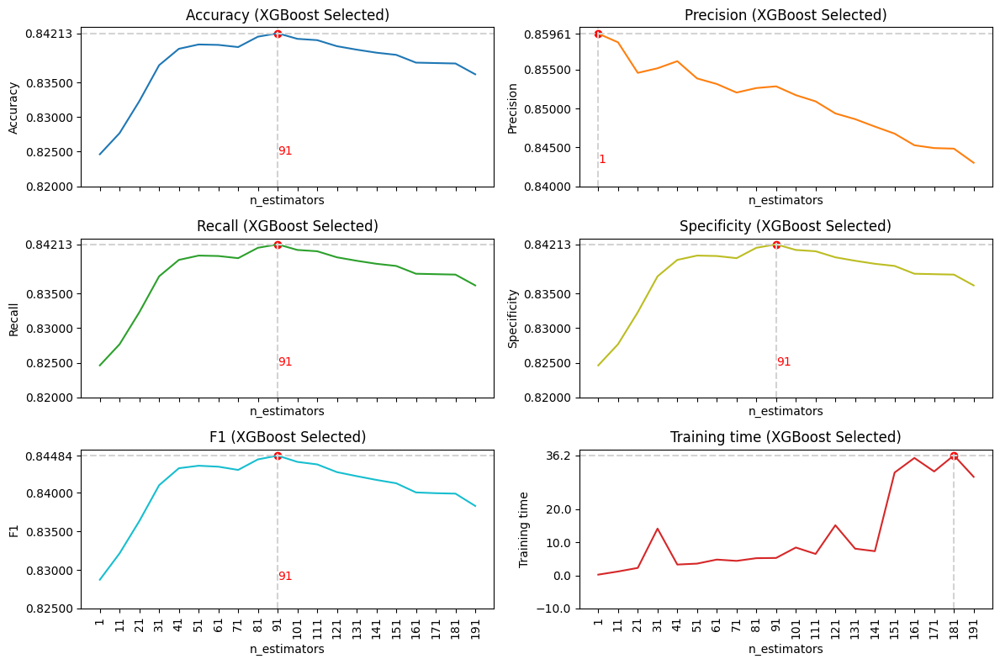

In [ ]:
plot_metric(eval_dict, 'XGBoost Selected', 'n_estimators', list_estimators)

A little better, but still not nearly as good as the full one, because the full one doesn't take too long, we will consider that as better.

## Random Forests

For Random Forests, the parameter under consideration is the number of trees. 

In [60]:
list_estimators = range(1,200,10)

In [61]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

In [62]:
best_accuracy = 0.0

for val in list_estimators:
    # Create classifier instance
    clf = RandomForestClassifier(n_estimators=val, n_jobs=-1, random_state=777)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/ensemble/RF_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[

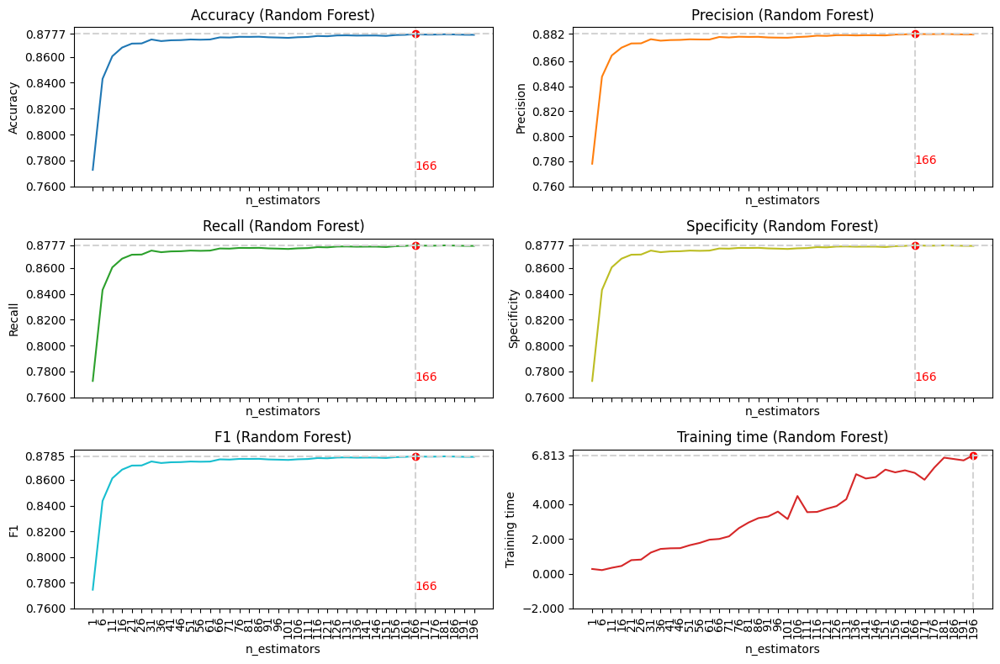

In [ ]:
plot_metric(eval_dict, 'Random Forest', 'n_estimators', list_estimators)

With random forests, we found that the optimal parameter is 166 trees, higher than XGBoost. 

In [ ]:
clf = load('models/ensemble/RF_best.joblib')
y_pred = clf.predict(X_test_final)

In [ ]:
print(classification_report(y_test_final, y_pred, target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.86      0.86      0.86     10000
        Mirai       0.99      0.99      0.99     10000
         DDoS       1.00      0.96      0.98     10000
     Spoofing       0.83      0.81      0.82     10000
          Web       0.78      0.87      0.82     10000
        Recon       0.88      0.75      0.81     10000
   BruteForce       0.59      0.82      0.68      3064
          DoS       1.00      0.97      0.98     10000

     accuracy                           0.88     73064
    macro avg       0.87      0.88      0.87     73064
 weighted avg       0.89      0.88      0.89     73064



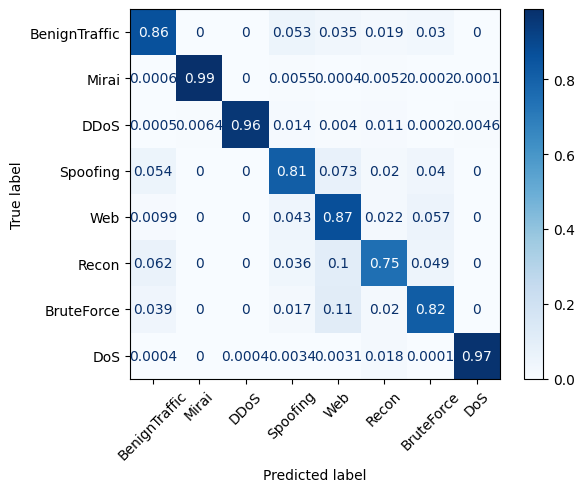

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, y_pred, display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

The performances overall are the same, but we believe that XGBoost in our case is a slightly better choice, considering that it is more relevant for our analysis (its performance is .88 with respect to .86)

## Let's try to do some features selection

In [63]:
feature_names = df_train.drop(columns=["label", "category_label"]).columns
feature_importance = clf.feature_importances_
feature_importance_dict = dict(zip(feature_names, feature_importance))
sorted_features = sorted(feature_importance_dict.items(), key=lambda x: x[1])

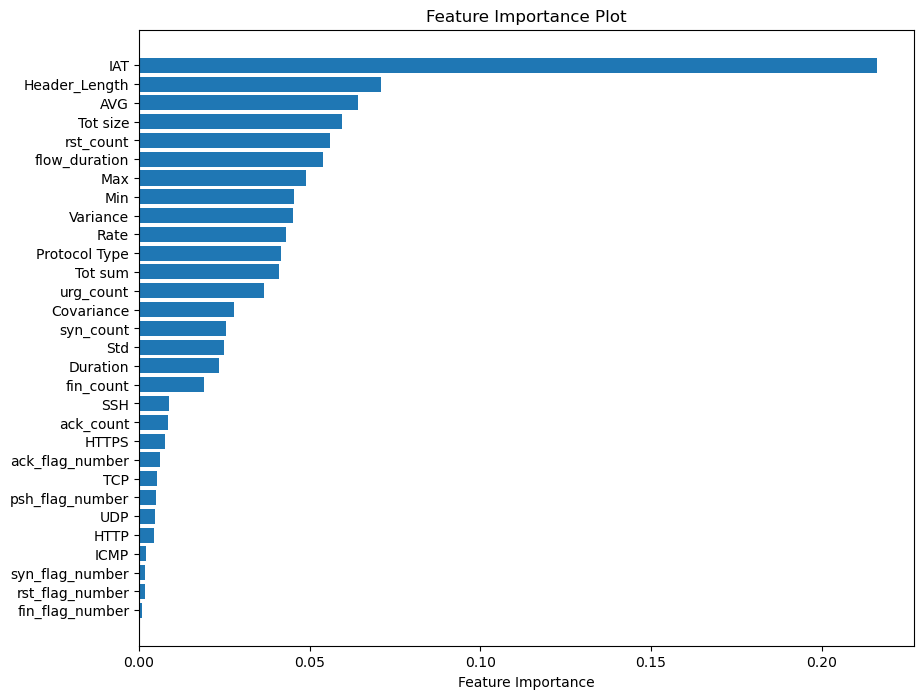

In [64]:
feature_names, importance_values = zip(*sorted_features)

plt.figure(figsize=(10, 8))
plt.barh(range(len(feature_names)), importance_values, align='center')
plt.yticks(range(len(feature_names)), feature_names)
plt.xlabel('Feature Importance')
plt.title('Feature Importance Plot')
plt.show()

In [65]:
important_features = [feature for feature, importance in sorted_features if importance >= 0.05]

In [66]:
important_features

['flow_duration', 'rst_count', 'Tot size', 'AVG', 'Header_Length', 'IAT']

In [67]:
list_estimators = range(1, 200, 10)

In [68]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

In [69]:
X_train_rf_important = df_train[important_features]
X_test_rf_important = df_test[important_features]
X_train_rf_important = standard_scaler.fit_transform(X_train_rf_important)
X_test_rf_important = standard_scaler.transform(X_test_rf_important)

In [70]:
best_accuracy = 0.0

for val in list_estimators:
    # Create classifier instance
    clf = RandomForestClassifier(n_estimators=val, n_jobs=-1, random_state=777)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train_rf_important, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test_rf_important)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/ensemble/RF_best_feature_importance_05.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[

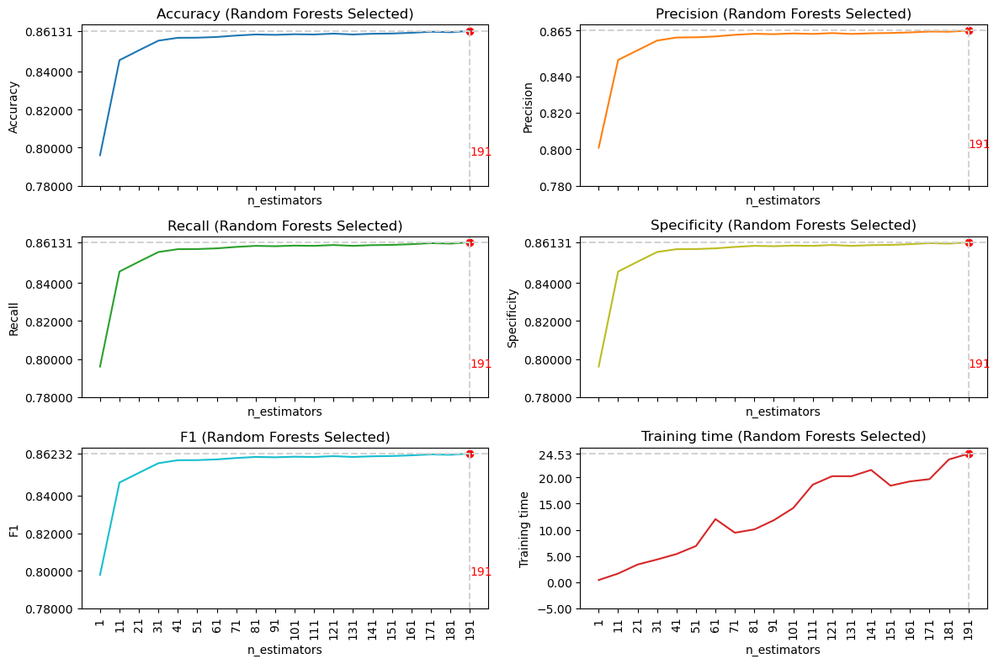

In [71]:
plot_metric(eval_dict, 'Random Forests Selected', 'n_estimators', list_estimators)

This one goes much better than with xgboost, and maybe with more DT it would get even better

In [72]:
important_features = [feature for feature, importance in sorted_features if importance >= 0.02]

In [73]:
important_features

['Duration',
 'Std',
 'syn_count',
 'Covariance',
 'urg_count',
 'Tot sum',
 'Protocol Type',
 'Rate',
 'Variance',
 'Min',
 'Max',
 'flow_duration',
 'rst_count',
 'Tot size',
 'AVG',
 'Header_Length',
 'IAT']

In [74]:
list_estimators = range(1, 200, 10)

In [75]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

In [76]:
X_train_rf_important = df_train[important_features]
X_test_rf_important = df_test[important_features]
X_train_rf_important = standard_scaler.fit_transform(X_train_rf_important)
X_test_rf_important = standard_scaler.transform(X_test_rf_important)

In [77]:
best_accuracy = 0.0

for val in list_estimators:
    # Create classifier instance
    clf = RandomForestClassifier(n_estimators=val, n_jobs=-1, random_state=777)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train_rf_important, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test_rf_important)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/ensemble/RF_best_feature_importance_02.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[

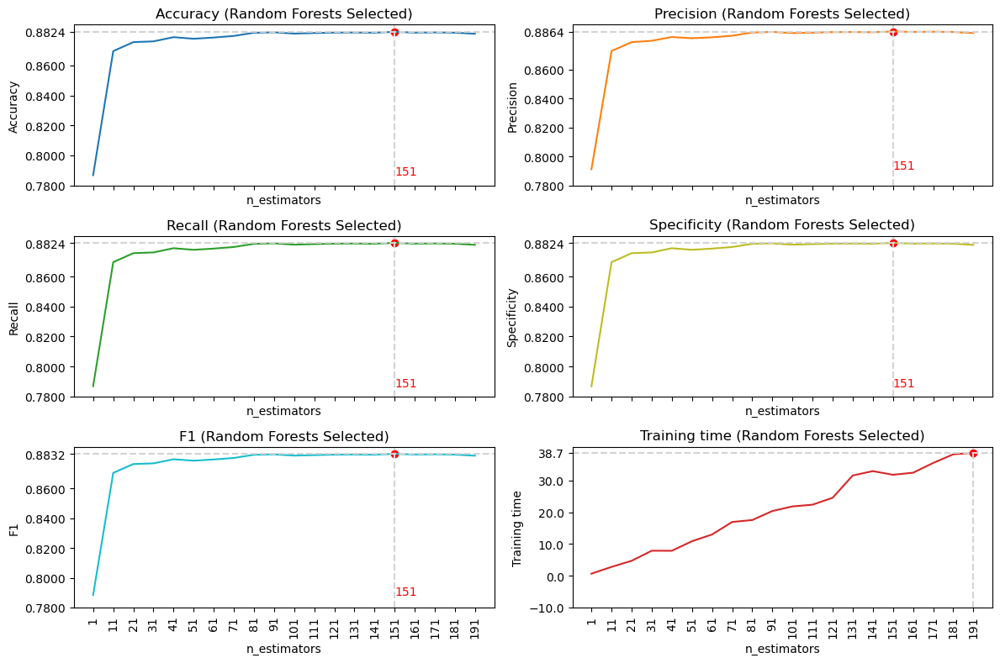

In [78]:
plot_metric(eval_dict, 'Random Forests Selected', 'n_estimators', list_estimators)

We can see that is actually works pretty similar to the one with all the features because some features are not really needed.

## Voting Classifiers

Let's try to see if the predictions that are created by different classifiers are different, so that we can think about a voting classifier

We will consider the following, all with the best paramethers: Decision Trees, Random Forests, XGBoost, since they were the ones that performed best

In [ ]:
y_dt = load('models/nonLinear/DT_best.joblib').predict(X_test_final)
y_rf = load('models/ensemble/RF_best.joblib').predict(X_test_final)
y_xgb = load('models/ensemble/xgb_best.joblib').predict(X_test_final)

In [ ]:
sum([1 for i, j in zip(y_dt, y_rf) if i != j])

6499

In [ ]:
sum([1 for i, j in zip(y_dt, y_xgb) if i != j])

6419

In [ ]:
sum([1 for i, j in zip(y_rf, y_xgb) if i != j])

4360

In [ ]:
sum([1 for i, j, k in zip(y_rf, y_xgb, y_dt) if i != j != k])

2598

We can see that some of them are definitely different, let's try to create a couple of voting classifiers to check for improvement

We had the best DT with 23 as max_depth\
We had the best RF with 166 estimators\
We had the best XGBoost with 111 estimators

In [ ]:
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier

In [ ]:
clf = VotingClassifier(estimators=[
    ('DT', DecisionTreeClassifier(max_depth=23, random_state=777)), 
    ('RF', RandomForestClassifier(n_estimators=166, random_state=777)),
    ('xgb', XGBClassifier(n_estimators=111, random_state=777))],
    voting='hard', n_jobs=-1, verbose=1)

In [ ]:
clf.fit(X_train, y_train)

[Voting] ....................... (1 of 3) Processing DT, total=   1.0s
[Voting] ...................... (3 of 3) Processing xgb, total=   7.0s
[Voting] ....................... (2 of 3) Processing RF, total=  23.9s


VotingClassifier(estimators=[('DT',
                              DecisionTreeClassifier(max_depth=23,
                                                     random_state=777)),
                             ('RF',
                              RandomForestClassifier(n_estimators=166,
                                                     random_state=777)),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False...
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=111, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=777, ...))],
                 n_jobs=-1, verbose=1)

In [ ]:
dump(clf, 'models/ensemble/voting_hard_best.joblib')

['models/ensemble/voting_hard_best.joblib']

In [ ]:
print(classification_report(y_test, clf.predict(X_test), target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.85      0.90      0.87      2036
        Mirai       0.99      0.99      0.99      2035
         DDoS       1.00      0.97      0.98      1973
     Spoofing       0.85      0.82      0.84      1960
          Web       0.73      0.88      0.80      1974
        Recon       0.88      0.77      0.82      2038
   BruteForce       0.84      0.81      0.82      2051
          DoS       1.00      0.98      0.99      1933

     accuracy                           0.89     16000
    macro avg       0.89      0.89      0.89     16000
 weighted avg       0.89      0.89      0.89     16000



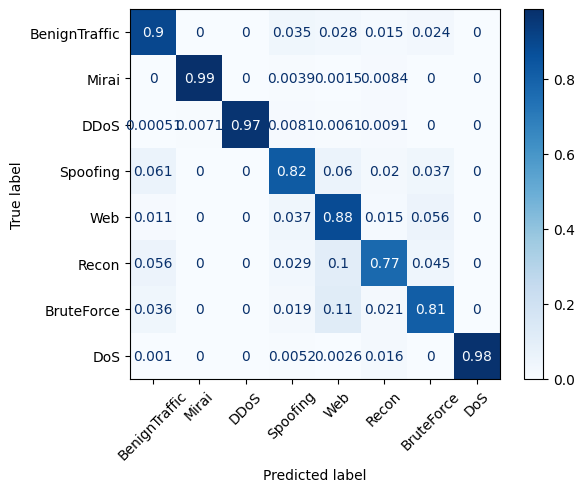

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, clf.predict(X_test), display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

In [ ]:
clf = VotingClassifier(estimators=[
    ('DT', DecisionTreeClassifier(max_depth=23, random_state=777)), 
    ('RF', RandomForestClassifier(n_estimators=166, random_state=777)),
    ('xgb', XGBClassifier(n_estimators=111, random_state=777))],
    voting='soft', n_jobs=-1, verbose=1)

In [ ]:
clf.fit(X_train, y_train)

[Voting] ....................... (1 of 3) Processing DT, total=   1.0s
[Voting] ...................... (3 of 3) Processing xgb, total=   8.2s
[Voting] ....................... (2 of 3) Processing RF, total=  24.1s


VotingClassifier(estimators=[('DT',
                              DecisionTreeClassifier(max_depth=23,
                                                     random_state=777)),
                             ('RF',
                              RandomForestClassifier(n_estimators=166,
                                                     random_state=777)),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False...
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=111, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=777, ...))],
                 n_jobs=-1, verbose=1, voting='soft')

In [ ]:
dump(clf, 'models/ensemble/voting_soft_best.joblib')

['models/ensemble/voting_soft_best.joblib']

In [ ]:
print(classification_report(y_test, clf.predict(X_test), target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.86      0.89      0.87      2036
        Mirai       1.00      0.98      0.99      2035
         DDoS       1.00      0.97      0.98      1973
     Spoofing       0.85      0.82      0.83      1960
          Web       0.73      0.87      0.80      1974
        Recon       0.85      0.78      0.81      2038
   BruteForce       0.83      0.81      0.82      2051
          DoS       1.00      0.98      0.99      1933

     accuracy                           0.89     16000
    macro avg       0.89      0.89      0.89     16000
 weighted avg       0.89      0.89      0.89     16000



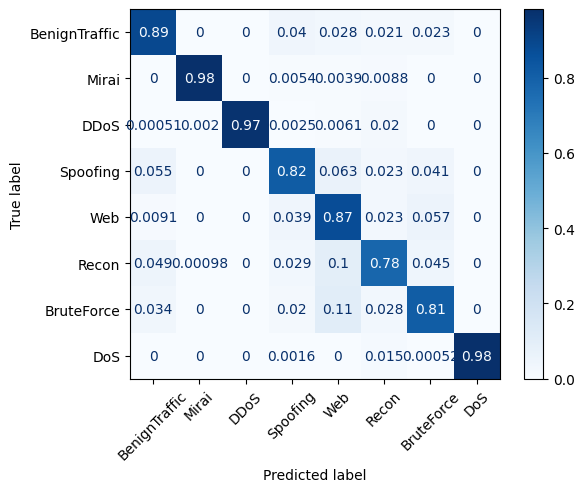

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, clf.predict(X_test), display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

the hard one seems a little better at understanding the Benign (on the small test), so we'll use that one

In [ ]:
print(classification_report(y_test_final, clf.predict(X_test_final), target_names=label2id))

               precision    recall  f1-score   support

BenignTraffic       0.87      0.88      0.87     10000
        Mirai       1.00      0.99      0.99     10000
         DDoS       1.00      0.96      0.98     10000
     Spoofing       0.87      0.82      0.85     10000
          Web       0.79      0.88      0.83     10000
        Recon       0.87      0.78      0.82     10000
   BruteForce       0.60      0.81      0.69      3064
          DoS       1.00      0.98      0.99     10000

     accuracy                           0.89     73064
    macro avg       0.87      0.89      0.88     73064
 weighted avg       0.90      0.89      0.90     73064



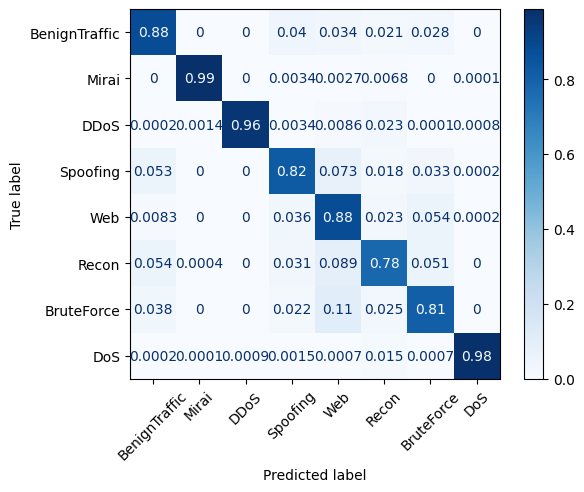

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_final, clf.predict(X_test_final), display_labels=label2id, cmap='Blues', normalize='true', xticks_rotation=45)
plt.show()

We get a slight increare in performace, without requiring too much time. We are happy that the predictions stay consistent in a larger test dataset.

## AdaBoost

From the sklearn documentation: An AdaBoost classifier is a meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases.

We will try this classifier after looking at this paper: https://www.mdpi.com/1424-8220/23/13/5941#B99-sensors-23-05941

The results in the paper for the AdaBoost are not great, but we will try just some to check how it works.

In [72]:
from sklearn.ensemble import AdaBoostClassifier

In [75]:
list_estimators = range(1,200,20)

In [76]:
eval_dict = {'list_accuracy': [], 
             'list_precision': [], 
             'list_recall': [], 
             'list_specificity': [], 
             'list_f1': [], 
             'list_training_time': []}

In [77]:
best_accuracy = 0.0

for val in list_estimators:
    # Create classifier instance
    clf = AdaBoostClassifier(n_estimators=val, random_state=777)
    
    # Register start time
    t_start = time.time()
    
    # Fit the classifier on the training data
    clf.fit(X_train, y_train)
    
    # Register end time
    t_stop = time.time()
    
    # Predict probabilities on the test data
    y_pred = clf.predict(X_test)
    
    # Calculate accuracy
    current_accuracy = accuracy_score(y_test, y_pred)
    
    # Save the model if it has the best accuracy so far
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        dump(clf, 'models/ensemble/RF_best.joblib')

    eval_dict['list_accuracy'].append(current_accuracy)
    eval_dict['list_precision'].append(precision_score(y_test, y_pred, average='weighted'))
    eval_dict['list_recall'].append(recall_score(y_test, y_pred, average='weighted'))
    eval_dict['list_specificity'].append(recall_score(y_test, y_pred, pos_label=0, average='weighted'))
    eval_dict['list_f1'].append(f1_score(y_test, y_pred, average='weighted'))
    eval_dict['list_training_time'].append(t_stop - t_start)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3

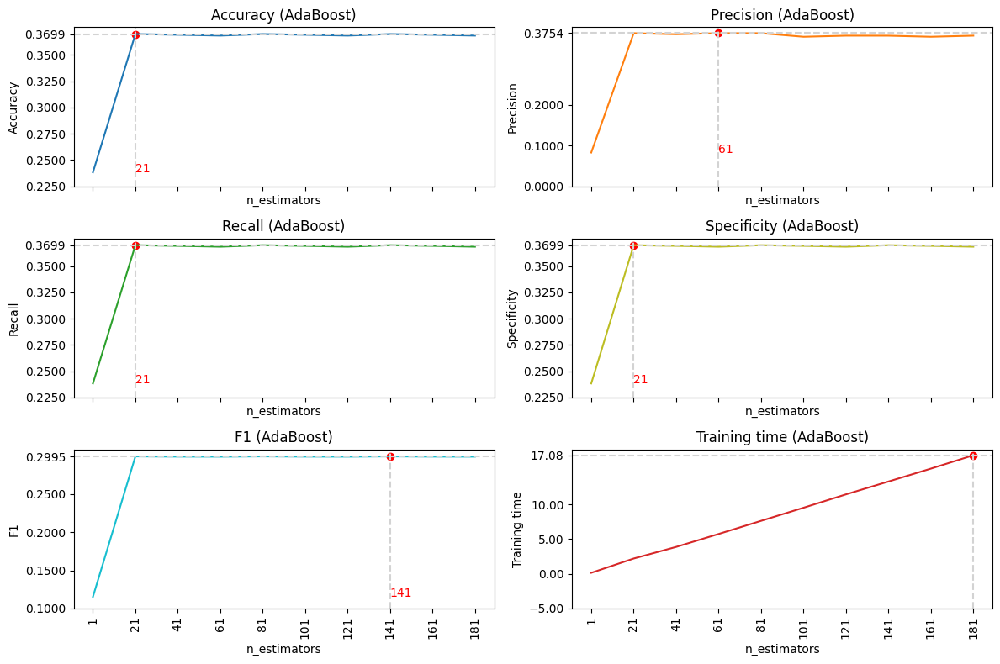

In [78]:
plot_metric(eval_dict, 'AdaBoost', 'n_estimators', list_estimators)

We can see in fact, that it performs quite bad. It was fun to try though.

<a id="5"></a>
# Unsupervised Classification

## Objective:
In this section of the project, we will train unsupervised classifiers.

We will use the following metrics to evaluate them:

**Homogeneity score:** A clustering result satisfies homogeneity if all of its clusters contain only data points which are members of a single class.

**Completeness score:** A clustering result satisfies completeness if all the data points that are members of a given class are elements of the same cluster.

**V-measure score:** the harmonic mean between homogeneity and completeness.

**Distortion score:** the sum of square distances from each point to its assigned center.

**calinski_harabasz_score:** The score is defined as ratio of the sum of between-cluster dispersion and of within-cluster dispersion.

Some of the following code is a repetition from before, this is because originally we were using multiple notebooks and preferred to keep the structure to run single sections if needed.

## Imports

In [ ]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import os
from joblib import dump, load
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler
from scipy import stats

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

from sklearn.metrics import (
    homogeneity_score,
    completeness_score,
    v_measure_score,
    silhouette_score,
    calinski_harabasz_score,
)

import time
from sklearn.metrics import (
    accuracy_score, 
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    average_precision_score,
    roc_curve,
    roc_auc_score
)
from sklearn.calibration import CalibrationDisplay
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

Because we are working with unlabeled data, it does't make sense to use the modified data we processed. We will use the full dataset we were able to obtain from the Kaggle Repository. 
This is because when we were processing the dataset, we looked at the distributions by label. 

In [ ]:
df = pd.read_csv("data/full_balanced_data.csv")

df.shape

(153064, 48)

In [ ]:
df.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number',
       'rst_flag_number', 'psh_flag_number', 'ack_flag_number',
       'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'DNS', 'Telnet',
       'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 'ARP', 'ICMP', 'IPv', 'LLC',
       'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number',
       'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'label',
       'category_label'],
      dtype='object')

We will just remove columns that have all same value

In [ ]:
def is_unique(s):
    a = s.to_numpy()
    return (a[0] == a).all()

col = []
for i in df.columns:
    out = is_unique(df[i])
    if out == False:
        col.append(i)

df = df[col]

In [ ]:
df.shape

(153064, 44)

In [ ]:
X = df.drop(columns=["label", "category_label"])

y = df["category_label"]

Now we are scaling values in the train and the test set (everything in this case, because there are only numerical features) to have better performances and predictions.

In [ ]:
standard_scaler = StandardScaler().fit(X)

X = standard_scaler.transform(X)

Let's save the standars scaler also for the future

In [ ]:
#dump(standard_scaler, "scalers/standard_scaler.bin", compress=True)

In [ ]:
X

array([[-0.09225225, -0.38725648, -0.52567095, ..., -0.22467681,
        -1.2470541 ,  0.00223954],
       [-0.09433133, -0.38733216, -0.96823971, ..., -0.22467681,
        -1.2470541 ,  0.00223954],
       [-0.09433133, -0.38728425, -0.52567095, ..., -0.22466911,
        -1.17866775,  0.00223954],
       ...,
       [-0.09406873,  0.04294229, -0.52567095, ...,  0.4295219 ,
         0.8045363 , -1.2954638 ],
       [-0.09426278, -0.38685539, -0.52567095, ..., -0.22456615,
        -0.10728166, -1.2954638 ],
       [-0.01101208, -0.37959922,  0.15588494, ..., -0.22321886,
         1.03249079,  1.29994288]])

Here we assigned numerical values to each label

In [ ]:
label2id = {'BenignTraffic': 0, 'Mirai': 1, 'DDoS': 2, 'Spoofing': 3, 'Web': 4, 'Recon': 5, 'BruteForce': 6, 'DoS': 7}
id2label = {0: 'BenignTraffic', 1: 'Mirai', 2: 'DDoS', 3: 'Spoofing', 4: 'Web', 5: 'Recon', 6: 'BruteForce', 7: 'DoS'}
y = [label2id[label] for label in y]

## Unsupervised Learning

## Helper function to plot KMeans after PCA

This helper function can help us plot KMeans when reduced to 2 dimensions with PCA

In [ ]:
def plot_data_C(ax, X, col):
    ax.scatter(X[:, 0], X[:, 1], c=col, marker='.', s=2)

def plot_centroids_C(ax, centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    ax.scatter(centroids[:, 0], centroids[:, 1],
               marker='o', s=35, linewidths=8,
               color=circle_color, zorder=10, alpha=0.9)
    ax.scatter(centroids[:, 0], centroids[:, 1],
               marker='x', s=2, linewidths=12,
               color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, col, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True, ax=None):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    ax.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    ax.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
               linewidths=1, colors='k')
    plot_data_C(ax, X, col)
    if show_centroids:
        plot_centroids_C(ax, clusterer.cluster_centers_)

    if show_xlabels:
        ax.set_xlabel("$x_1$", fontsize=14)
    else:
        ax.tick_params(labelbottom=False)
    if show_ylabels:
        ax.set_ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        ax.tick_params(labelleft=False)
    return ax


In [ ]:
pca = PCA(n_components = 2)
X_PCA_2 = pca.fit_transform(X)
print(X_PCA_2.shape)

(153064, 2)


In [ ]:
col = []
for c in y:
  if c == 0:
    col.append("b")
  elif c == 1:
    col.append("g")
  elif c == 2:
    col.append("r")
  elif col == 3:
    col.append("c")
  elif col == 4:
    col.append("m")
  elif col == 5:
    col.append("y")
  elif col == 6:
    col.append("#000000")
  else:
    col.append("#FFC0CB")
print(len(col))

153064


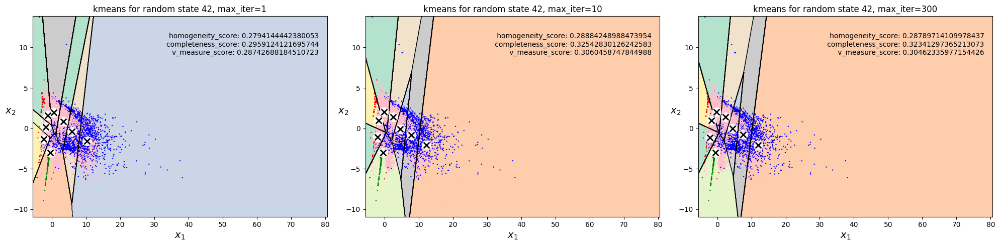

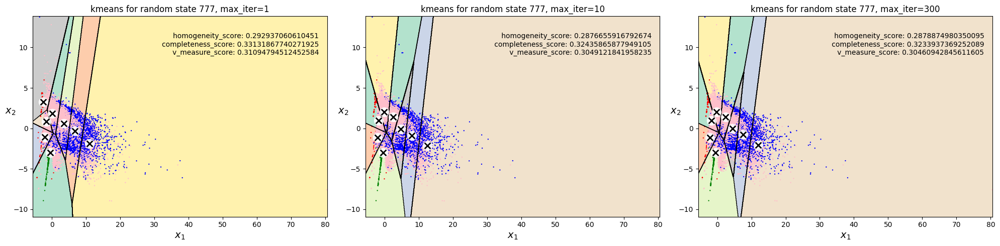

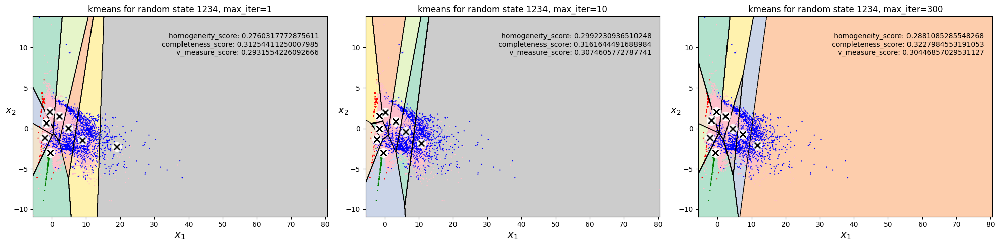

In [ ]:
from sklearn import metrics
from scipy import stats

k = 8
for i in [42, 777, 1234]:
  kmeans1 = KMeans(n_clusters=k, random_state=i, n_init=10, max_iter=1)
  kmeans10 = KMeans(n_clusters=k, random_state=i, n_init=10, max_iter=10)
  kmeans300 = KMeans(n_clusters=k, random_state=i, n_init=10, max_iter=300)

  kmeans1.fit(X_PCA_2)
  kmeans10.fit(X_PCA_2)
  kmeans300.fit(X_PCA_2)

  y_pred_1 = kmeans1.predict(X_PCA_2)
  y_pred_10 = kmeans10.predict(X_PCA_2)
  y_pred_300 = kmeans300.predict(X_PCA_2)

  
  fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
  axes[0].clear()
  plot_decision_boundaries(kmeans1, X_PCA_2, col, ax=axes[0])
  axes[0].set_title(f"kmeans for random state {i}, max_iter=1")
  axes[0].annotate(f"""
                homogeneity_score: {homogeneity_score(y, y_pred_1)}
                completeness_score: {completeness_score(y, y_pred_1)}
                v_measure_score: {v_measure_score(y, y_pred_1)}""",
                xy=(1, 1), xytext=(-12, -12), va='top', ha='right',
                xycoords='axes fraction', textcoords='offset points')


  axes[1].clear()
  plot_decision_boundaries(kmeans10, X_PCA_2, col, ax=axes[1])
  axes[1].set_title(f"kmeans for random state {i}, max_iter=10")
  axes[1].annotate(f"""
              homogeneity_score: {homogeneity_score(y, y_pred_10)}
              completeness_score: {completeness_score(y, y_pred_10)}
              v_measure_score: {v_measure_score(y, y_pred_10)}""",
              xy=(1, 1), xytext=(-12, -12), va='top', ha='right',
              xycoords='axes fraction', textcoords='offset points')

  axes[2].clear()
  plot_decision_boundaries(kmeans300, X_PCA_2, col, ax=axes[2])
  axes[2].set_title(f"kmeans for random state {i}, max_iter=300")
  axes[2].annotate(f"""
              homogeneity_score: {homogeneity_score(y, y_pred_300)}
              completeness_score: {completeness_score(y, y_pred_300)}
              v_measure_score: {v_measure_score(y, y_pred_300)}""",
              xy=(1, 1), xytext=(-12, -12), va='top', ha='right',
              xycoords='axes fraction', textcoords='offset points')

  plt.tight_layout()
  plt.show()

In the graphs above, the colored points our labels, the x's are the centroids and the lines are the decision boundaries for each label.

In [ ]:
pca = PCA(n_components=0.95)
low = pca.fit_transform(X)
low.shape

(153064, 24)

In [ ]:
k = 8
homogeneity_scores = []
completeness_scores = []
v_measure_scores = []
for i in [42, 777, 1234]:
  kmeans300 = KMeans(n_clusters=k, random_state=i, n_init=10, max_iter=300)

  kmeans300.fit(low)

  y_pred_300 = kmeans300.predict(low)

  homogeneity_scores.append(homogeneity_score(y, y_pred_300))
  completeness_scores.append(completeness_score(y, y_pred_300))
  v_measure_scores.append(v_measure_score(y, y_pred_300))

print(f"homogeneity_scores: {homogeneity_scores}\t mean: {np.mean(homogeneity_scores)}")
print(f"completeness_scores: {completeness_scores}\t mean: {np.mean(completeness_scores)}")
print(f"v_measure_scores: {v_measure_scores}\t\t mean: {np.mean(v_measure_scores)}")

homogeneity_scores: [0.30056590362428914, 0.30692794252012123, 0.30265663118413055]	 mean: 0.30338349244284696
completeness_scores: [0.36823037734485575, 0.36674136401404195, 0.3696466973289305]	 mean: 0.36820614622927605
v_measure_scores: [0.3309752140014537, 0.33417931083414854, 0.3328141313515469]		 mean: 0.3326562187290497


we can see that the 1234 random state, using a PCA with 24 features (95% of variance) works better than the others

In [ ]:
pca.explained_variance_ratio_

array([0.19141727, 0.08275136, 0.07633586, 0.0611547 , 0.05323904,
       0.05001338, 0.04734656, 0.04511688, 0.03811467, 0.03409679,
       0.02761397, 0.02642667, 0.02431798, 0.02380349, 0.02372975,
       0.02314458, 0.02225953, 0.02114544, 0.01793775, 0.01521524,
       0.01429797, 0.01227503, 0.01047544, 0.00964015])

In [ ]:
cumsum = np.cumsum(pca.explained_variance_ratio_)
cumsum = np.append(0, cumsum)
d = np.argmax(cumsum >= 0.95)
d

24

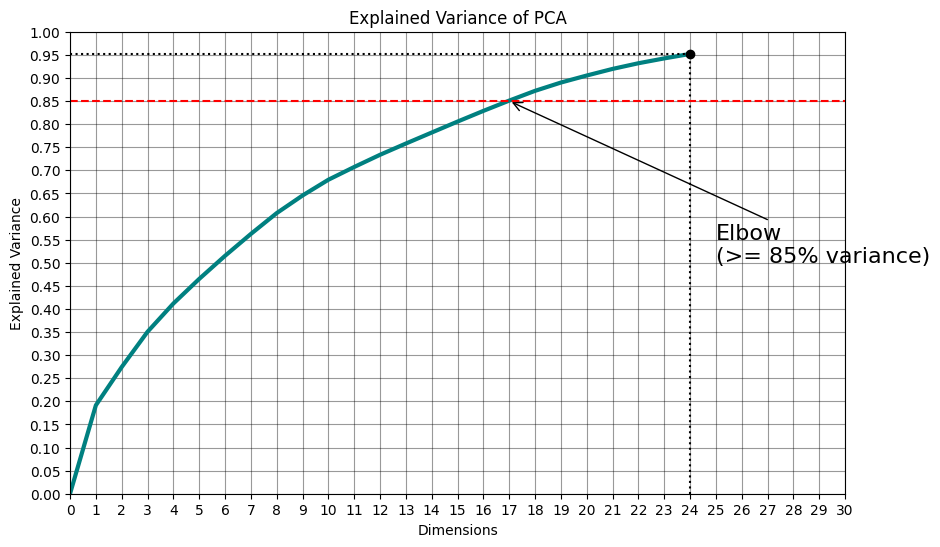

In [ ]:
plt.figure(figsize=(10,6))
plt.grid(True, alpha=0.4, c="black")
plt.plot(cumsum, linewidth=3, c="teal")
plt.axis([0, 30, 0, 1])
plt.xlabel("Dimensions")
plt.ylabel("Explained Variance")
plt.yticks(np.linspace(0,1,21))
plt.xticks(np.linspace(0,30,31))
plt.title("Explained Variance of PCA")
plt.plot([d, d], [0, cumsum[-1]], "k:")
plt.plot([0, d], [cumsum[-1], cumsum[-1]], "k:")
plt.plot(d, cumsum[-1], "ko")
plt.axhline(y=0.85, c="r", linestyle="--")
plt.annotate("Elbow\n(>= 85% variance)", xy=(np.argmax(cumsum >= 0.85), 0.85),
             xytext=(np.argmax(cumsum >= 0.85)+8, 0.5),
             arrowprops=dict(arrowstyle="->", color = "black"), fontsize=16)
# save_fig("explained_variance_plot")
plt.show()

According to this graph, the "Elbow" (which is when the explained variance for PCA reaches 85%) is at 17 dimensions. Additionally, the 95% explained variance -which we have selected- is reached with 24 dimensions.

In [ ]:
k = 8
homogeneity_scores = []
completeness_scores = []
v_measure_scores = []
for i in [42, 777, 1234]:
  kmeans300 = KMeans(n_clusters=k, random_state=i, n_init=10, max_iter=300)

  kmeans300.fit(X)

  y_pred_300 = kmeans300.predict(X)

  homogeneity_scores.append(homogeneity_score(y, y_pred_300))
  completeness_scores.append(completeness_score(y, y_pred_300))
  v_measure_scores.append(v_measure_score(y, y_pred_300))

print(f"homogeneity_scores: {homogeneity_scores}\t mean: {np.mean(homogeneity_scores)}")
print(f"completeness_scores: {completeness_scores}\t mean: {np.mean(completeness_scores)}")
print(f"v_measure_scores: {v_measure_scores}\t\t mean: {np.mean(v_measure_scores)}")

homogeneity_scores: [0.2669532676877738, 0.2245389988080147, 0.3562568737666425]	 mean: 0.28258304675414364
completeness_scores: [0.3323773756505023, 0.3155165607007077, 0.4131955445354732]	 mean: 0.3536964936288944
v_measure_scores: [0.296094409727378, 0.2623647563651861, 0.3826195082350512]		 mean: 0.3136928914425384


PCA is okay. We would need 24 dimensions to keep 95% of the variance. The PCA in two dimensions is not really helpful since it maintains less than 30% of the variance.

We chose k=8 because the number of labels are 8. 

### Let's test with tsne and UMAP (better for large datasets)

Both take extremely long, we weren't able to run them. Ideally, we would have done the same analysis that was done for pca.

In [ ]:
from sklearn.manifold import TSNE

X_tsne = TSNE(n_components=2, random_state=42).fit_transform(X)

In [ ]:
with open('data/reduced/test.npy', 'wb') as f:
    np.save(f, X_tsne)

In [ ]:
!pip3 install umap-learn

In [ ]:
import umap.umap_ as umap

embedding = umap.UMAP(n_jobs=-1).fit_transform(X)

In [ ]:
with open('data/reduced/umap.npy', 'wb') as f:
    np.save(f, embedding)

## KMeans++

Uses data distribution to first set the centroids, instead of randomly plotting them. 

In [ ]:
from sklearn.cluster import kmeans_plusplus

homogeneity_scores = []
completeness_scores = []
v_measure_scores = []

k = 8
accuracy_scores = []
for i in [42, 777, 1234]:
  centroids, indices = kmeans_plusplus(X, n_clusters = k, random_state=i)
  kmeans = KMeans(n_clusters=k, random_state=i, n_init='auto')
  kmeans.fit(centroids)
  y_pred = kmeans.predict(X)
  homogeneity_scores.append(homogeneity_score(y, y_pred))
  completeness_scores.append(completeness_score(y, y_pred))
  v_measure_scores.append(v_measure_score(y, y_pred))
  

print(f"homogeneity_scores: {homogeneity_scores}\t mean: {np.mean(homogeneity_scores)}")
print(f"completeness_scores: {completeness_scores}\t mean: {np.mean(completeness_scores)}")
print(f"v_measure_scores: {v_measure_scores}\t mean: {np.mean(v_measure_scores)}")
  



homogeneity_scores: [0.23574583121575773, 0.23027245094576904, 0.2272843275507588]	 mean: 0.23110086990409517
completeness_scores: [0.29582280918189474, 0.40363199123803906, 0.3068577598686748]	 mean: 0.3354375200962029
v_measure_scores: [0.2623894215843747, 0.29324712596209834, 0.26114384635905963]	 mean: 0.27226013130184423


KMeans++ does not get better. We can see this through the low scores above

## Let's try with various number of clusters
By looking at the distortion score according to the number of clusters, we can determine the best number of clusters by finding the elbow within the graph.

In [ ]:
!pip3 install yellowbrick

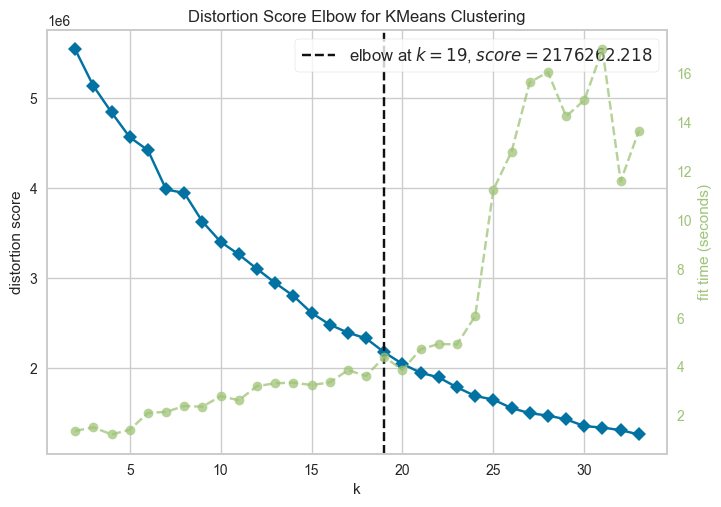

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from yellowbrick.cluster import KElbowVisualizer

model = KMeans(random_state=42, n_init=10, max_iter=300)
visualizer = KElbowVisualizer(model, k=(2,34))

visualizer.fit(X)
visualizer.show() 

Our optimal number of clusters k=19, but we can also see that the "elbow shape" is not very well defined

In [ ]:
n_clusters = list(range(2, 34))

In [ ]:
homogeneity_scores = []
completeness_scores = []
v_measure_scores = []
ch_scores = []

for k in n_clusters:
    t_start = time.time()
    kmeans = KMeans(n_clusters=k, n_init = 'auto', random_state=42).fit(X)
    y_pred = kmeans.predict(X)
    homogeneity_scores.append(homogeneity_score(y, y_pred))
    completeness_scores.append(completeness_score(y, y_pred))
    v_measure_scores.append(v_measure_score(y, y_pred))
    ch_scores.append(calinski_harabasz_score(X, y_pred))
    t_stop = time.time()
    print(f"Elapsed time: {t_stop - t_start:.5f} seconds (k: {k:2d})")

Elapsed time: 0.56051 seconds (k:  2)
Elapsed time: 0.52666 seconds (k:  3)
Elapsed time: 0.65544 seconds (k:  4)
Elapsed time: 0.65302 seconds (k:  5)
Elapsed time: 0.50405 seconds (k:  6)
Elapsed time: 0.50621 seconds (k:  7)
Elapsed time: 0.68009 seconds (k:  8)
Elapsed time: 0.62339 seconds (k:  9)
Elapsed time: 0.53888 seconds (k: 10)
Elapsed time: 0.54268 seconds (k: 11)
Elapsed time: 0.53101 seconds (k: 12)
Elapsed time: 0.55879 seconds (k: 13)
Elapsed time: 0.57854 seconds (k: 14)
Elapsed time: 0.76132 seconds (k: 15)
Elapsed time: 0.74158 seconds (k: 16)
Elapsed time: 0.75521 seconds (k: 17)
Elapsed time: 0.80725 seconds (k: 18)
Elapsed time: 0.79295 seconds (k: 19)
Elapsed time: 0.80438 seconds (k: 20)
Elapsed time: 0.84930 seconds (k: 21)
Elapsed time: 0.76353 seconds (k: 22)
Elapsed time: 0.85016 seconds (k: 23)
Elapsed time: 0.86430 seconds (k: 24)
Elapsed time: 1.38692 seconds (k: 25)
Elapsed time: 1.81350 seconds (k: 26)
Elapsed time: 1.56237 seconds (k: 27)
Elapsed time

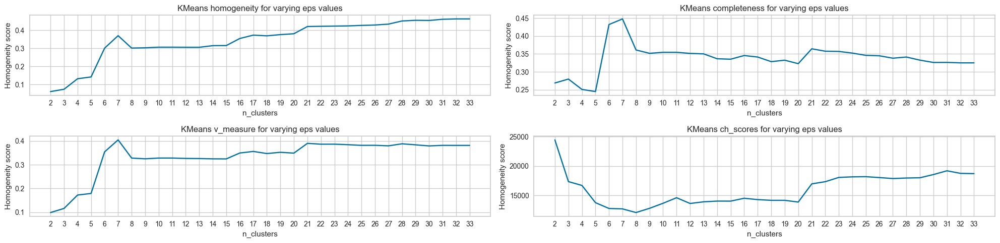

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 5))

ax[0, 0].plot(n_clusters, homogeneity_scores)
ax[0, 0].set_title('KMeans homogeneity for varying eps values')
ax[0, 0].set_xlabel('n_clusters')
ax[0, 0].set_ylabel('Homogeneity score')
ax[0, 0].set_xticks(n_clusters)
ax[0, 0].grid(visible=True)

ax[0, 1].plot(n_clusters, completeness_scores)
ax[0, 1].set_title('KMeans completeness for varying eps values')
ax[0, 1].set_xlabel('n_clusters')
ax[0, 1].set_ylabel('Completeness score')
ax[0, 1].set_xticks(n_clusters)
ax[0, 1].grid(visible=True)

ax[1, 0].plot(n_clusters, v_measure_scores)
ax[1, 0].set_title('KMeans v_measure for varying eps values')
ax[1, 0].set_xlabel('n_clusters')
ax[1, 0].set_ylabel('V_measure score')
ax[1, 0].set_xticks(n_clusters)
ax[1, 0].grid(visible=True)

ax[1, 1].plot(n_clusters, ch_scores)
ax[1, 1].set_title('KMeans ch_scores for varying eps values')
ax[1, 1].set_xlabel('n_clusters')
ax[1, 1].set_ylabel('Ch_scores score')
ax[1, 1].set_xticks(n_clusters)
ax[1, 1].grid(visible=True)

plt.tight_layout()
plt.show()

By following homogeneity, completeness, and v_measure, clustering tends to perform better with a higher number of clusters (except for completeness, which slightly falls after k=7 clusters). 

## Let's test also DBScan
In DBScan, the eps_values are the radius around the mean points created. 

In [ ]:
eps_values = [0.1, 0.3, 0.5, 0.7, 1.0]

In [ ]:
homogeneity_scores = []
completeness_scores = []
v_measure_scores = []
ch_scores = []

for eps in eps_values:
    # Register start time
    t_start = time.time()
    dbscan = DBSCAN(eps=eps, n_jobs=-1).fit(X)
    y_pred = dbscan.labels_
    homogeneity_scores.append(homogeneity_score(y, y_pred))
    completeness_scores.append(completeness_score(y, y_pred))
    v_measure_scores.append(v_measure_score(y, y_pred))
    ch_scores.append(calinski_harabasz_score(X, y_pred))
    # Register end time
    t_stop = time.time()
    # Print elapsed time
    print(f"Elapsed time: {t_stop - t_start:.5f} seconds (k: {eps})")

Elapsed time: 53.72845 seconds (k: 0.1)
Elapsed time: 71.60856 seconds (k: 0.3)
Elapsed time: 103.42766 seconds (k: 0.5)
Elapsed time: 59.01302 seconds (k: 0.7)
Elapsed time: 62.92873 seconds (k: 1.0)


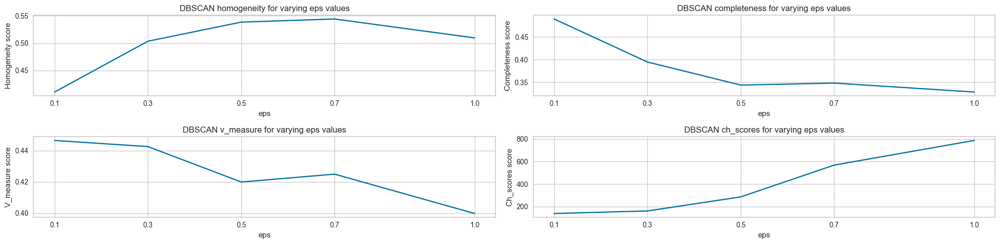

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 5))

ax[0, 0].plot(eps_values, homogeneity_scores)
ax[0, 0].set_xticks(eps_values)
ax[0, 0].set_title('DBSCAN homogeneity for varying eps values')
ax[0, 0].set_xlabel('eps')
ax[0, 0].set_ylabel('Homogeneity score')
ax[0, 0].set_xticks(eps_values)
ax[0, 0].grid(visible=True)

ax[0, 1].plot(eps_values, completeness_scores)
ax[0, 1].set_xticks(eps_values)
ax[0, 1].set_title('DBSCAN completeness for varying eps values')
ax[0, 1].set_xlabel('eps')
ax[0, 1].set_ylabel('Completeness score')
ax[0, 1].set_xticks(eps_values)
ax[0, 1].grid(visible=True)

ax[1, 0].plot(eps_values, v_measure_scores)
ax[1, 0].set_xticks(eps_values)
ax[1, 0].set_title('DBSCAN v_measure for varying eps values')
ax[1, 0].set_xlabel('eps')
ax[1, 0].set_ylabel('V_measure score')
ax[1, 0].set_xticks(eps_values)
ax[1, 0].grid(visible=True)

ax[1, 1].plot(eps_values, ch_scores)
ax[1, 1].set_xticks(eps_values)
ax[1, 1].set_title('DBSCAN ch_scores for varying eps values')
ax[1, 1].set_xlabel('eps')
ax[1, 1].set_ylabel('Ch_scores score')
ax[1, 1].set_xticks(eps_values)
ax[1, 1].grid(visible=True)

plt.tight_layout()
plt.show()

We can see an upward trend in both homogeneity score and DBScan when increasing the eps score. On the other hand v_measure and completeness worsen with higher eps values. 

## Let's test hierarchical clustering

Hierarchical clustering on the entire dataset is extremely slow, because of that we we took a smaller sample of the dataset to work with, with a size of 10000 points. 

In [ ]:
X_small, _, y_small, _ = train_test_split(X, y, train_size=10000, random_state=42)

In [ ]:
from collections import Counter
Counter(y_small)

Counter({3: 1305,
         5: 1292,
         6: 885,
         1: 1261,
         2: 1306,
         4: 1295,
         0: 1310,
         7: 1346})

In [ ]:
X_small.shape

(10000, 42)

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram

In [ ]:
clustering = AgglomerativeClustering(n_clusters=8)
clustering.fit(X_small)
linkage_matrix = linkage(clustering.children_, method='single')

In [ ]:
labels = clustering.fit_predict(X_small)

In [ ]:
Counter(labels)

Counter({1: 2109, 0: 2880, 3: 2793, 6: 1732, 4: 164, 7: 291, 2: 22, 5: 9})

In [ ]:
print("Completeness score: ", completeness_score(y_small, labels))
print("v_measure_score: ", v_measure_score(y_small, labels))
print("Homogeneity score: ", homogeneity_score(y_small, labels))

Completeness score:  0.28742295699392867
v_measure_score:  0.2447527911377867
Homogeneity score:  0.21311431863211572


Does not work well, we see that all three score have values < 0.30.
Hierarchical clustering doesn't work because we already know the amount of clusters we need = 8. 

# Conclusion
We noticed that unsupervised learning for the dataset we selected doesn't work as well as supervised. There can be a few reasons for this:
- Since the data doesn't have a clear distinction from one label to another, assigning the labels within supervised allows the model to learn the correct label while unsupervised doesn't have this point of reference to refer to.   

# Binary Classification

We will now train and test some of the classifiers on the data labeled either as Benign or Malign, instead then on the 8.

Some of the following code is a repetition from before, this is because originally we were using multiple notebooks and preferred to keep the structure to run single sections if needed.

## Imports

In [ ]:
!pip3 install imblearn

  Using cached imblearn-0.0-py2.py3-none-any.whl (1.9 kB)
     |████████████████████████████████| 235 kB 1.9 MB/s eta 0:00:01
You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.9/bin/python3.9 -m pip install --upgrade pip' command.


In [ ]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from joblib import dump, load
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy import stats
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neural_network import MLPClassifier
import time
from sklearn.metrics import (
    accuracy_score, 
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    average_precision_score,
    roc_curve,
    roc_auc_score,
    RocCurveDisplay,
    auc
)
from sklearn.calibration import CalibrationDisplay
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_validate

from sklearn.svm import OneClassSVM
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

from collections import Counter
from imblearn.under_sampling import RandomUnderSampler

## Preparing the data

In [ ]:
df_train = pd.read_csv("data/df_train.csv")
df_test = pd.read_csv("data/df_test.csv")

print(df_train.shape)
df_test.shape

(55749, 32)


(16000, 32)

In [ ]:
df_train.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'fin_flag_number', 'syn_flag_number', 'rst_flag_number',
       'psh_flag_number', 'ack_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'SSH', 'TCP',
       'UDP', 'ICMP', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT',
       'Covariance', 'Variance', 'label', 'category_label'],
      dtype='object')

In [ ]:
X_train = df_train.drop(columns=["label", "category_label"])
X_test = df_test.drop(columns=["label", "category_label"])

y_train = df_train["category_label"]
y_test = df_test["category_label"]

Let's divide the dataset into train and test sets. In this case, we are using 20% of the dataset as test.

Now we are scaling values in the train and the test set (everything in this case, because there are only numerical features) to have better performances and predictions.

In [ ]:
standard_scaler = StandardScaler().fit(X_train)

X_train = standard_scaler.transform(X_train)
X_test = standard_scaler.transform(X_test)

Let's save the standars scaler also for the future

In [ ]:
#dump(standard_scaler, "scalers/standard_scaler.bin", compress=True)

In [ ]:
X_train

array([[-0.36801019, -0.35346166,  0.46054157, ..., -0.01018213,
        -0.35051081, -1.27017796],
       [-0.36888444, -0.38354661, -0.52506693, ..., -0.01058209,
        -0.35051081, -1.27017796],
       [-0.36888444, -0.38354661, -0.52506693, ..., -0.00643102,
        -0.35051081, -1.27017796],
       ...,
       [ 0.36874052, -0.37683062, -0.33690531, ...,  1.26147349,
        -0.34579192,  0.99974844],
       [-0.11088783, -0.32960377, -0.52506693, ...,  1.2614745 ,
         1.57512056,  0.99974844],
       [ 0.73144974, -0.33881354, -0.22938438, ..., -1.27568763,
        -0.34866664,  0.7727558 ]])

In [ ]:
X_test

array([[-0.3594684 ,  3.34878602, -0.52506693, ...,  1.26151154,
         3.37066307,  0.99974844],
       [-0.33873717, -0.38126271,  0.46054157, ..., -1.27568763,
        -0.3451429 ,  0.7727558 ],
       [-0.36784072, -0.38318251, -0.52506693, ..., -1.27568763,
        -0.35007724,  0.7727558 ],
       ...,
       [ 0.53284477, -0.34475238, -0.47130647, ...,  1.26163369,
        -0.34559026,  0.99974844],
       [ 0.09184591, -0.32815799,  0.26341987, ..., -1.27568763,
        -0.34286041,  0.7727558 ],
       [-0.36888444, -0.38354661, -0.52506693, ..., -0.00644665,
        -0.35051081, -1.27017796]])

In [ ]:
label2id = {'BenignTraffic': 0, 'Mirai': 1, 'DDoS': 1, 'Spoofing': 1, 'Web': 1, 'Recon': 1, 'BruteForce': 1, 'DoS': 1}
id2label = {0: 'BenignTraffic', 1: 'MaliciousTraffic'}

y_train = [label2id[label] for label in y_train]
y_test = [label2id[label] for label in y_test]


In [ ]:
Counter(y_train)

Counter({1: 48731, 0: 7018})

because the classes are very much unbalanced, we'll perform some undersampling


(14036, 30) (14036,)
0    7018
1    7018
dtype: int64


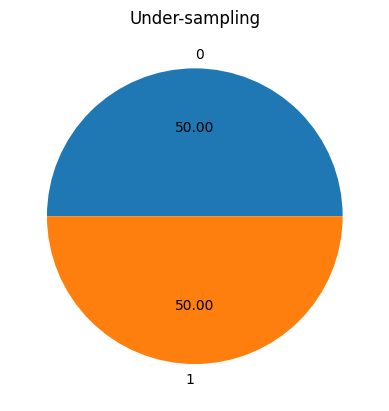

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(sampling_strategy="auto", random_state=42)
X_res, y_res = rus.fit_resample(X_train, pd.Series( (v for v in y_train) ))
print(X_res.shape, y_res.shape)
print(y_res.value_counts())

ax = y_res.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Under-sampling")

Now our data is balanced. We undersampled our malicious values to be the same amount benign values. 

## Let's prepare also the final test we will use with each best classifier

In [ ]:
df_test_final = pd.read_csv("data/final_test_data.csv")
df_test_final = df_test_final[df_train.columns]

X_test_final = df_test_final.drop(columns=["label", "category_label"])
y_test_final = df_test_final["category_label"]

X_test_final = standard_scaler.transform(X_test_final)

label2id = {'BenignTraffic': 0, 'Mirai': 1, 'DDoS': 1, 'Spoofing': 1, 'Web': 1, 'Recon': 1, 'BruteForce': 1, 'DoS': 1}
id2label = {0: 'BenignTraffic', 1: 'MaliciousTraffic'}

y_test_final = [label2id[label] for label in y_test_final]

label2id = {'BenignTraffic': 0, 'MaliciousTraffic': 1}

In [ ]:
X_test_final

array([[-0.36888444, -0.38354661, -0.52506693, ..., -0.00637693,
        -0.35051081, -1.27017796],
       [-0.36858791, -0.35326693,  0.46054157, ..., -0.01005686,
        -0.35051081, -1.27017796],
       [-0.3686571 , -0.36995928,  0.46054157, ..., -0.01019597,
        -0.35049261, -1.15668164],
       ...,
       [ 0.46692148, -0.34883984, -0.13082353, ...,  1.26109575,
        -0.04195424,  0.99974844],
       [-0.36870301, -0.3834317 , -0.417546  , ...,  1.26147301,
        -0.34580619,  0.99974844],
       [-0.10955779, -0.31405063, -0.48922662, ...,  1.26147385,
        -0.3486514 ,  0.99974844]])

In [ ]:
df_test_final.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'fin_flag_number', 'syn_flag_number', 'rst_flag_number',
       'psh_flag_number', 'ack_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'SSH', 'TCP',
       'UDP', 'ICMP', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT',
       'Covariance', 'Variance', 'label', 'category_label'],
      dtype='object')

In [ ]:
Counter(y_test_final)

Counter({1: 63064, 0: 10000})

Let's now try the various classifiers

In [ ]:
models = {'logistic': LogisticRegression(random_state=42, max_iter=1000),
        'knn': KNeighborsClassifier(n_neighbors=10),
        'decision_tree': DecisionTreeClassifier(random_state=42),
        'random_forest': RandomForestClassifier(random_state=42),
        'mlp': MLPClassifier((10, 10, 5), random_state=42),
        'deeper_mlp': MLPClassifier((10, 10, 100, 100, 100, 100, 50, 50, 50, 10), early_stopping=True, random_state=42)}

predictions = {'logistic': None,
               'knn': None,
               'random_forest': None,
                'decision_tree': None,
                'mlp': None,
                'deeper_mlp': None}

Classification Report for logistic:
              precision    recall  f1-score   support

           0       0.43      0.85      0.57      2036
           1       0.97      0.84      0.90     13964

    accuracy                           0.84     16000
   macro avg       0.70      0.84      0.74     16000
weighted avg       0.91      0.84      0.86     16000



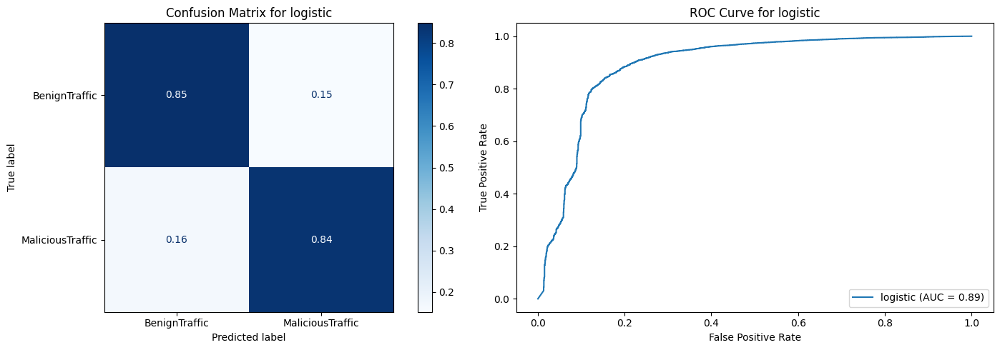

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/threadpoolctl.py:1019: RuntimeWarning: libc not found. The ctypes module in Python 3.9 is maybe too old for this OS.
  warnings.warn(


Classification Report for knn:
              precision    recall  f1-score   support

           0       0.39      0.87      0.54      2036
           1       0.98      0.80      0.88     13964

    accuracy                           0.81     16000
   macro avg       0.68      0.83      0.71     16000
weighted avg       0.90      0.81      0.84     16000



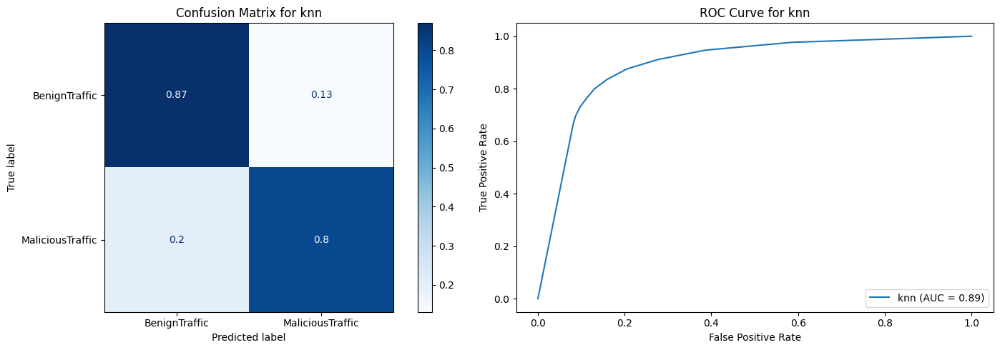

Classification Report for decision_tree:
              precision    recall  f1-score   support

           0       0.68      0.91      0.77      2036
           1       0.99      0.94      0.96     13964

    accuracy                           0.93     16000
   macro avg       0.83      0.92      0.87     16000
weighted avg       0.95      0.93      0.94     16000



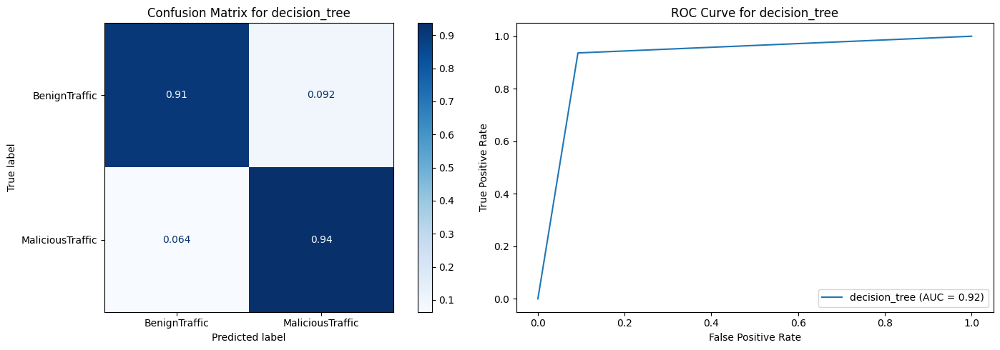

Classification Report for random_forest:
              precision    recall  f1-score   support

           0       0.73      0.90      0.81      2036
           1       0.99      0.95      0.97     13964

    accuracy                           0.95     16000
   macro avg       0.86      0.93      0.89     16000
weighted avg       0.95      0.95      0.95     16000



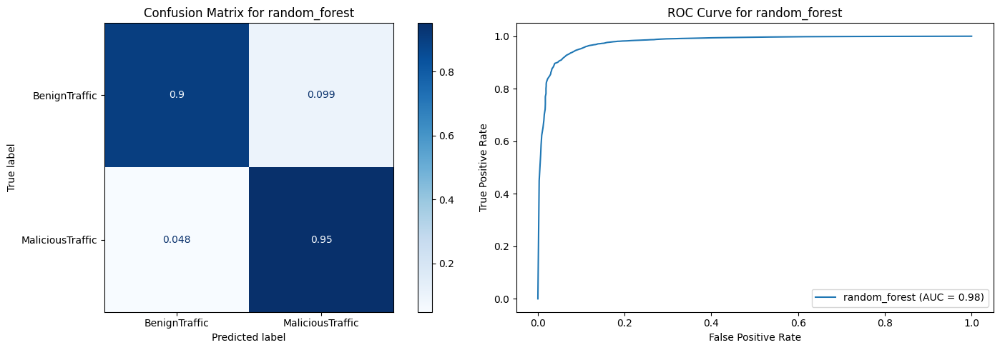

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Classification Report for mlp:
              precision    recall  f1-score   support

           0       0.54      0.84      0.66      2036
           1       0.98      0.90      0.93     13964

    accuracy                           0.89     16000
   macro avg       0.76      0.87      0.80     16000
weighted avg       0.92      0.89      0.90     16000



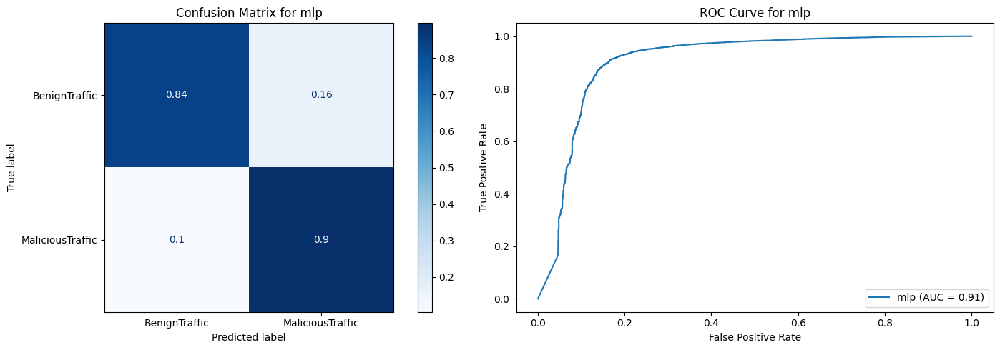

Classification Report for deeper_mlp:
              precision    recall  f1-score   support

           0       0.54      0.81      0.65      2036
           1       0.97      0.90      0.93     13964

    accuracy                           0.89     16000
   macro avg       0.75      0.85      0.79     16000
weighted avg       0.91      0.89      0.90     16000



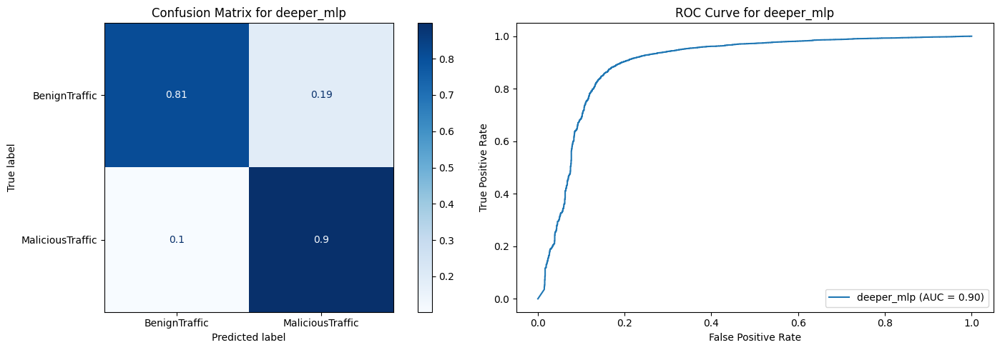

In [ ]:
for i, (model_name, model) in enumerate(models.items()):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    model.fit(X_res, y_res)

    dump(model, f"models/binary/{model_name}.joblib")
    y_pred = model.predict(X_test)
    predictions[model_name] = y_pred

    # Classification Report
    print(f"Classification Report for {model_name}:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    disp_cm = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred, normalize='true'), display_labels=label2id)
    disp_cm.plot(cmap='Blues',ax=axes[0])
    axes[0].set_title(f"Confusion Matrix for {model_name}")

    # ROC Curve
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    disp_roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_name)
    disp_roc.plot(ax=axes[1])
    axes[1].set_title(f'ROC Curve for {model_name}')

    plt.tight_layout()
    plt.show()

Classification Report for logistic:
              precision    recall  f1-score   support

           0       0.47      0.85      0.61     10000
           1       0.97      0.85      0.91     63064

    accuracy                           0.85     73064
   macro avg       0.72      0.85      0.76     73064
weighted avg       0.90      0.85      0.87     73064



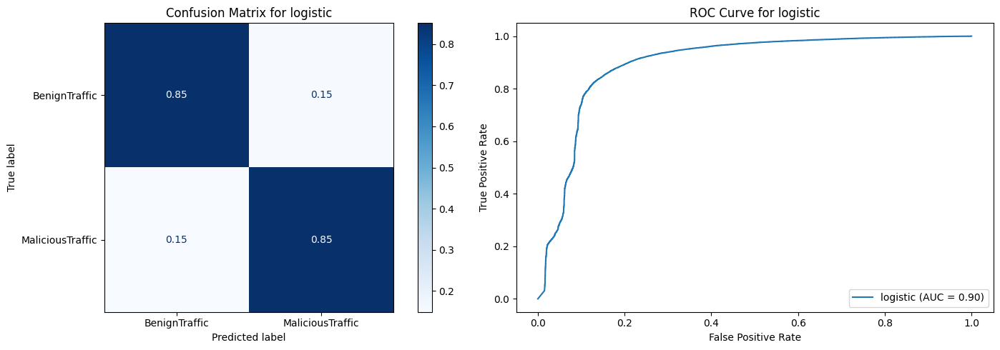

Classification Report for knn:
              precision    recall  f1-score   support

           0       0.43      0.87      0.58     10000
           1       0.98      0.82      0.89     63064

    accuracy                           0.82     73064
   macro avg       0.70      0.85      0.73     73064
weighted avg       0.90      0.82      0.85     73064



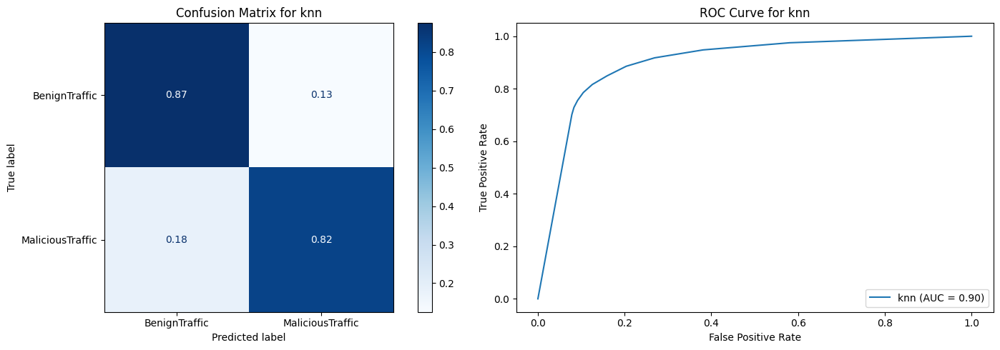

Classification Report for decision_tree:
              precision    recall  f1-score   support

           0       0.71      0.90      0.79     10000
           1       0.98      0.94      0.96     63064

    accuracy                           0.94     73064
   macro avg       0.85      0.92      0.88     73064
weighted avg       0.95      0.94      0.94     73064



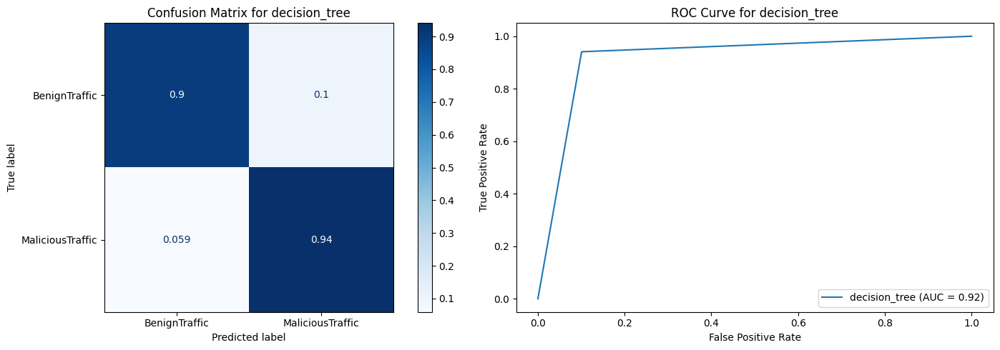

Classification Report for random_forest:
              precision    recall  f1-score   support

           0       0.77      0.90      0.83     10000
           1       0.98      0.96      0.97     63064

    accuracy                           0.95     73064
   macro avg       0.88      0.93      0.90     73064
weighted avg       0.96      0.95      0.95     73064



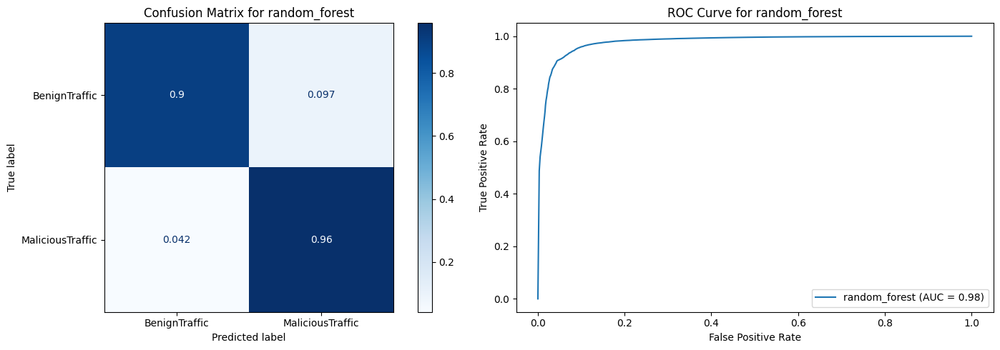

Classification Report for mlp:
              precision    recall  f1-score   support

           0       0.58      0.84      0.68     10000
           1       0.97      0.90      0.94     63064

    accuracy                           0.89     73064
   macro avg       0.77      0.87      0.81     73064
weighted avg       0.92      0.89      0.90     73064



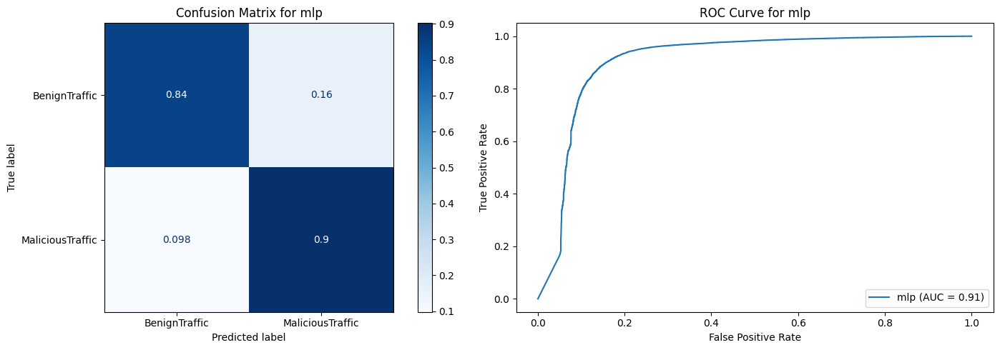

Classification Report for deeper_mlp:
              precision    recall  f1-score   support

           0       0.57      0.82      0.67     10000
           1       0.97      0.90      0.93     63064

    accuracy                           0.89     73064
   macro avg       0.77      0.86      0.80     73064
weighted avg       0.91      0.89      0.90     73064



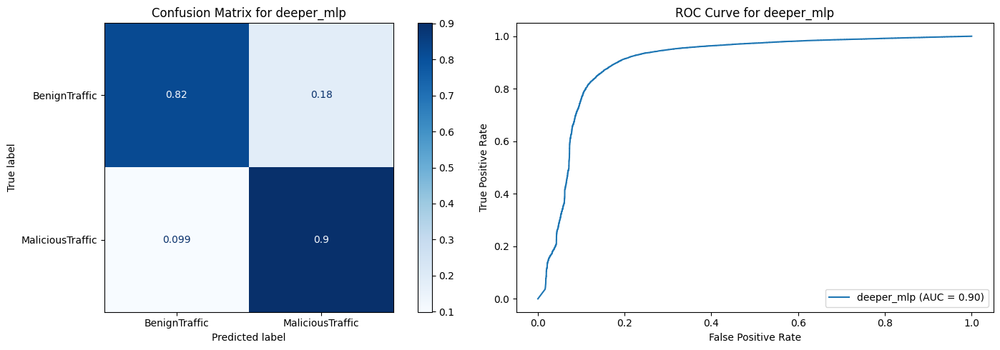

In [ ]:
for i, (model_name, model) in enumerate(models.items()):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

    model = load(f"models/binary/{model_name}.joblib")
    y_pred = model.predict(X_test_final)

    # Classification Report
    print(f"Classification Report for {model_name}:")
    print(classification_report(y_test_final, y_pred))

    # Confusion Matrix
    disp_cm = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test_final, y_pred, normalize='true'), display_labels=label2id)
    disp_cm.plot(cmap='Blues',ax=axes[0])
    axes[0].set_title(f"Confusion Matrix for {model_name}")

    # ROC Curve
    y_prob = model.predict_proba(X_test_final)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test_final, y_prob)
    roc_auc = auc(fpr, tpr)

    disp_roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_name)
    disp_roc.plot(ax=axes[1])
    axes[1].set_title(f'ROC Curve for {model_name}')

    plt.tight_layout()
    plt.show()

We noticed that classifying malicious labels works better than classifying the benign ones - which could be better in the context of our data (better to detect malicious labels).
Above we see that decision trees and random forest perform better.

Remember that the y_final test is highly unbalanced, and we see that the binary classifiers, without too much of an analysis, perform quite well\
Remember that you tried to create a classifier with the unbalanced X_train, and it performed quite worse in the BenignTraffic (the one that is under represented)

## Let's try a voting classifier with all of our previously created ones (only one MLP)
We will look at hard voting and soft voting, one looks at the models and it selects one that has the majority of the classification. 
Soft voting on the other hand looks at the probabilities of each. 

In [ ]:
models = {'logistic': LogisticRegression(random_state=42, max_iter=1000),
        'knn': KNeighborsClassifier(n_neighbors=10),
        'decision_tree': DecisionTreeClassifier(random_state=42),
        'random_forest': RandomForestClassifier(random_state=42),
        'mlp': MLPClassifier((10, 10, 5), random_state=42)}

clf_hard = VotingClassifier(estimators=[(name, model) for name, model in models.items()], voting='hard', verbose=True, n_jobs=-1)
clf_soft = VotingClassifier(estimators=[(name, model) for name, model in models.items()], voting='soft', verbose=True, n_jobs=-1)

In [ ]:
clf_hard.fit(X_res, y_res)

[Voting] ...................... (2 of 5) Processing knn, total=   0.0s
[Voting] ................. (1 of 5) Processing logistic, total=   0.2s
[Voting] ............ (3 of 5) Processing decision_tree, total=   0.2s
[Voting] ............ (4 of 5) Processing random_forest, total=   2.9s
[Voting] ...................... (5 of 5) Processing mlp, total=   7.7s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


VotingClassifier(estimators=[('logistic',
                              LogisticRegression(max_iter=1000,
                                                 random_state=42)),
                             ('knn', KNeighborsClassifier(n_neighbors=10)),
                             ('decision_tree',
                              DecisionTreeClassifier(random_state=42)),
                             ('random_forest',
                              RandomForestClassifier(random_state=42)),
                             ('mlp',
                              MLPClassifier(hidden_layer_sizes=(10, 10, 5),
                                            random_state=42))],
                 n_jobs=-1, verbose=True)

In [ ]:
dump(clf_hard, f"models/binary/voting_hard.joblib")

['models/binary/voting_hard.joblib']

Classification Report for Hard Voting:
              precision    recall  f1-score   support

           0       0.57      0.87      0.69      2036
           1       0.98      0.90      0.94     13964

    accuracy                           0.90     16000
   macro avg       0.77      0.89      0.81     16000
weighted avg       0.93      0.90      0.91     16000



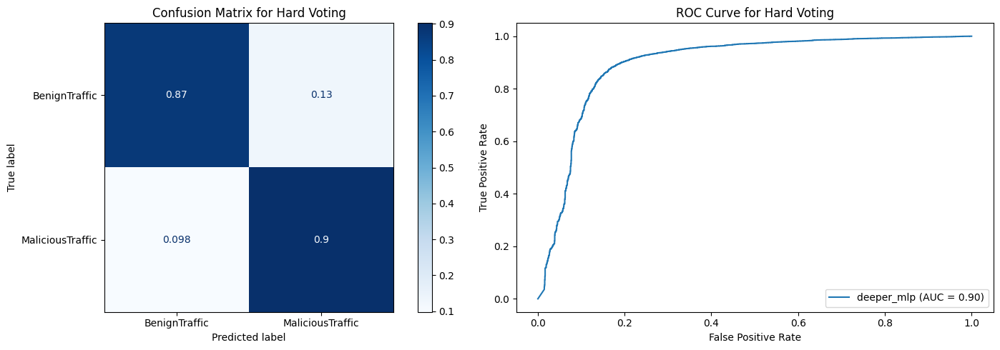

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

y_pred = clf_hard.predict(X_test)
predictions[model_name] = y_pred

# Classification Report
print(f"Classification Report for Hard Voting:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
disp_cm = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred, normalize='true'), display_labels=label2id)
disp_cm.plot(cmap='Blues',ax=axes[0])
axes[0].set_title(f"Confusion Matrix for Hard Voting")

# ROC Curve
y_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

disp_roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_name)
disp_roc.plot(ax=axes[1])
axes[1].set_title(f'ROC Curve for Hard Voting')

plt.tight_layout()
plt.show()

Classification Report for Voting Hard:
              precision    recall  f1-score   support

           0       0.61      0.88      0.72     10000
           1       0.98      0.91      0.94     63064

    accuracy                           0.90     73064
   macro avg       0.79      0.89      0.83     73064
weighted avg       0.93      0.90      0.91     73064



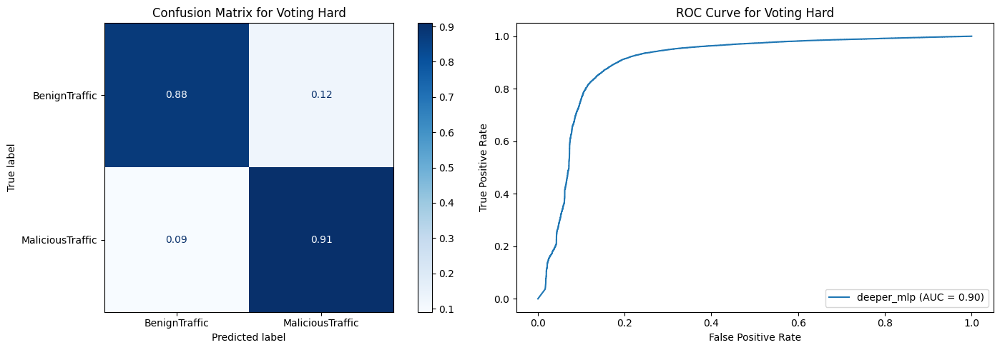

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

y_pred = clf_hard.predict(X_test_final)

# Classification Report
print(f"Classification Report for Voting Hard:")
print(classification_report(y_test_final, y_pred))

# Confusion Matrix
disp_cm = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test_final, y_pred, normalize='true'), display_labels=label2id)
disp_cm.plot(cmap='Blues',ax=axes[0])
axes[0].set_title(f"Confusion Matrix for Voting Hard")

# ROC Curve
y_prob = model.predict_proba(X_test_final)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_final, y_prob)
roc_auc = auc(fpr, tpr)

disp_roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_name)
disp_roc.plot(ax=axes[1])
axes[1].set_title(f'ROC Curve for Voting Hard')

plt.tight_layout()
plt.show()

In [ ]:
clf_soft.fit(X_res, y_res)

[Voting] ...................... (2 of 5) Processing knn, total=   0.0s
[Voting] ............ (3 of 5) Processing decision_tree, total=   0.3s
[Voting] ................. (1 of 5) Processing logistic, total=   0.2s
[Voting] ............ (4 of 5) Processing random_forest, total=   3.2s
[Voting] ...................... (5 of 5) Processing mlp, total=   7.6s


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


VotingClassifier(estimators=[('logistic',
                              LogisticRegression(max_iter=1000,
                                                 random_state=42)),
                             ('knn', KNeighborsClassifier(n_neighbors=10)),
                             ('decision_tree',
                              DecisionTreeClassifier(random_state=42)),
                             ('random_forest',
                              RandomForestClassifier(random_state=42)),
                             ('mlp',
                              MLPClassifier(hidden_layer_sizes=(10, 10, 5),
                                            random_state=42))],
                 n_jobs=-1, verbose=True, voting='soft')

In [ ]:
dump(clf_hard, f"models/binary/voting_soft.joblib")

['models/binary/voting_soft.joblib']

Classification Report for Soft Voting:
              precision    recall  f1-score   support

           0       0.62      0.87      0.73      2036
           1       0.98      0.92      0.95     13964

    accuracy                           0.92     16000
   macro avg       0.80      0.90      0.84     16000
weighted avg       0.93      0.92      0.92     16000



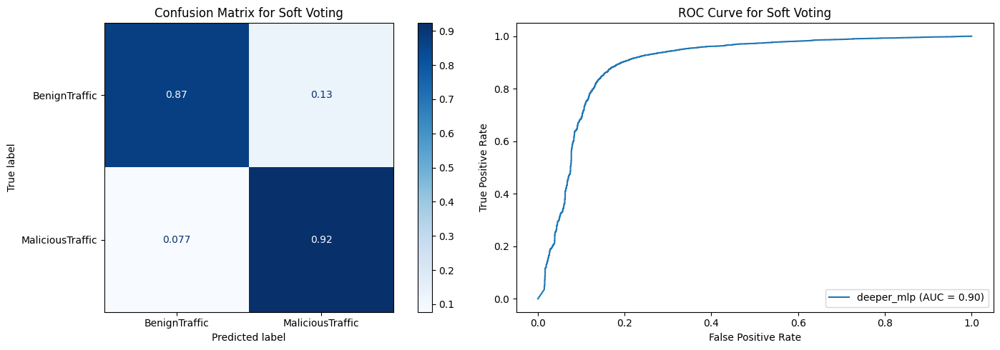

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

y_pred = clf_soft.predict(X_test)
predictions[model_name] = y_pred

# Classification Report
print(f"Classification Report for Soft Voting:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
disp_cm = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred, normalize='true'), display_labels=label2id)
disp_cm.plot(cmap='Blues',ax=axes[0])
axes[0].set_title(f"Confusion Matrix for Soft Voting")

# ROC Curve
y_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

disp_roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_name)
disp_roc.plot(ax=axes[1])
axes[1].set_title(f'ROC Curve for Soft Voting')

plt.tight_layout()
plt.show()

Classification Report for Voting Soft:
              precision    recall  f1-score   support

           0       0.66      0.87      0.75     10000
           1       0.98      0.93      0.95     63064

    accuracy                           0.92     73064
   macro avg       0.82      0.90      0.85     73064
weighted avg       0.94      0.92      0.93     73064



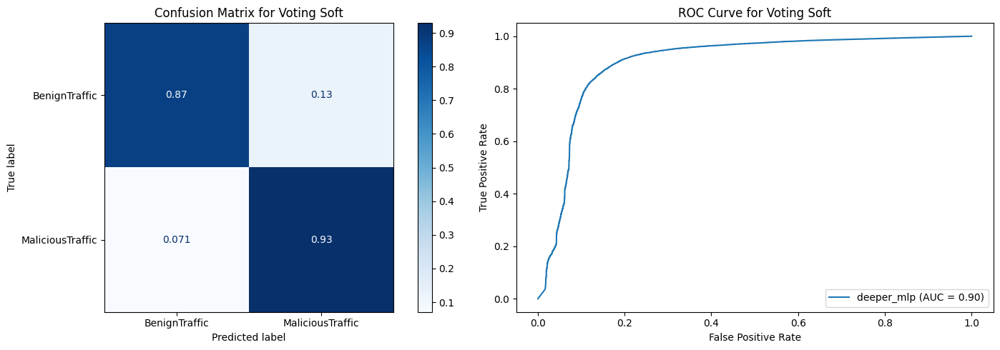

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

y_pred = clf_soft.predict(X_test_final)

# Classification Report
print(f"Classification Report for Voting Soft:")
print(classification_report(y_test_final, y_pred))

# Confusion Matrix
disp_cm = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test_final, y_pred, normalize='true'), display_labels=label2id)
disp_cm.plot(cmap='Blues',ax=axes[0])
axes[0].set_title(f"Confusion Matrix for Voting Soft")

# ROC Curve
y_prob = model.predict_proba(X_test_final)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_final, y_prob)
roc_auc = auc(fpr, tpr)

disp_roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_name)
disp_roc.plot(ax=axes[1])
axes[1].set_title(f'ROC Curve for Voting Soft')

plt.tight_layout()
plt.show()

Both hard and soft voting work almost the same.

<a id="6"></a>
# Anomaly Detection Techniques

Let's try with some of the techniques within anomaly detection

We also tried resampling so that the malicious are much less than the benign.

After performing the analysis both with scaled and not scaled data, we saw that the acuracy was usually a little better with scaled data.

X_res, y_res
(40000, 46) (40000,)
-1    20000
 1    20000
dtype: int64


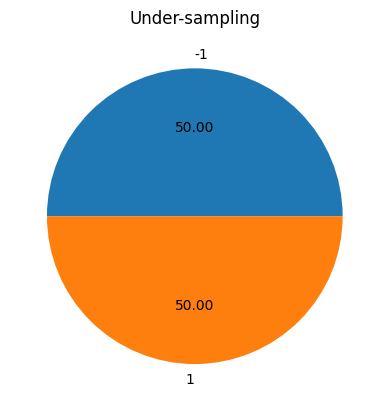

X_res_small, y_res_small
(25000, 46) (25000,)
 1    20000
-1     5000
dtype: int64


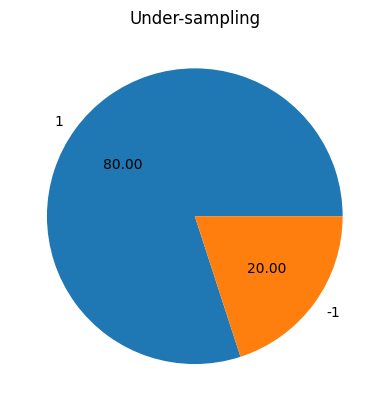

In [ ]:
df = pd.read_csv('data/full_balanced_data.csv')

X = df.drop(['category_label', 'label'], axis=1).copy()
y = df['category_label'].copy()
standard_scaler = StandardScaler()

X = standard_scaler.fit_transform(X)

label2id = {'BenignTraffic': 1, 'Mirai': -1, 'DDoS': -1, 'Spoofing': -1, 'Web': -1, 'Recon': -1, 'BruteForce': -1, 'DoS': -1}
id2label = {1: 'BenignTraffic', -1: 'MaliciousTraffic'}

y = [label2id[label] for label in y]

rus = RandomUnderSampler(sampling_strategy="auto", random_state=42)
X_res, y_res = rus.fit_resample(X, pd.Series( (v for v in y) ))
print('X_res, y_res')
print(X_res.shape, y_res.shape)
print(y_res.value_counts())

ax = y_res.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Under-sampling")
plt.show()

rus = RandomUnderSampler(sampling_strategy={-1: 5000})
X_res_small, y_res_small = rus.fit_resample(X, pd.Series( (v for v in y) ))
print('X_res_small, y_res_small')
print(X_res_small.shape, y_res_small.shape)
print(y_res_small.value_counts())

ax = y_res_small.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Under-sampling")
plt.show()

label2id = {'BenignTraffic': 1, 'MaliciousTraffic': -1}

In [ ]:
outlier_fraction = 0.01

Fit the model on the cleaned data set

In [ ]:
t_start = time.time()
y_pred = EllipticEnvelope(contamination=outlier_fraction).fit_predict(X)
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
np.unique(y_pred, return_counts=True)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/covariance/_robust_covariance.py:747: UserWarning: The covariance matrix associated to your dataset is not full rank
  warnings.warn(


Fitting time: 28.59 s


(array([-1,  1]), array([  1531, 151533]))

In [ ]:
print('Accuracy on full dataset')
accuracy_score(y, y_pred)

Accuracy on full dataset


0.13052709977525742

The accuracy score is extremely low, as expected anomaly detection on the entire dataset does not work well. 

In [ ]:
t_start = time.time()
y_pred = EllipticEnvelope(contamination=outlier_fraction).fit_predict(X_res)
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
np.unique(y_pred, return_counts=True)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/covariance/_robust_covariance.py:747: UserWarning: The covariance matrix associated to your dataset is not full rank
  warnings.warn(


Fitting time: 7.68 s


(array([-1,  1]), array([  400, 39600]))

Looking at the smaller dataset, our accuracy score slightly improves. This is because more of the benign values are captured, automatically leading to a higher accuracy score. But the anomalies are very few. This could be because our dataset doesn't really have "anomalies" intended as in these techniques. 

In [ ]:
print('Accuracy on smaller dataset')
accuracy_score(y_res, y_pred)

Accuracy on smaller dataset


0.5074

In [ ]:
t_start = time.time()
y_pred = EllipticEnvelope(contamination=outlier_fraction).fit_predict(X_res_small)
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
np.unique(y_pred, return_counts=True)

print('Accuracy on even smaller dataset')
accuracy_score(y_res_small, y_pred)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/covariance/_robust_covariance.py:747: UserWarning: The covariance matrix associated to your dataset is not full rank
  warnings.warn(


Fitting time: 5.12 s
Accuracy on even smaller dataset


0.79456

Because the ellipticenvelope tries to find the normally distributed data, and point the outliers as anomalies, and in our dataset the majority of the data is "an anomaly" the methods don't work well.

In [ ]:
t_start = time.time()
y_pred_svm = OneClassSVM(nu=outlier_fraction, kernel="rbf", gamma=0.1).fit(X).predict(X)
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
print(np.unique(y_pred_svm, return_counts=True))
accuracy_score(y, y_pred_svm)

Fitting time: 215.15 s
(array([-1,  1]), array([  2233, 150831]))


0.14040532065018554

In [ ]:
t_start = time.time()
y_pred_svm = OneClassSVM(nu=outlier_fraction, kernel="rbf", gamma=0.1).fit(X_res).predict(X_res)
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
print(np.unique(y_pred_svm, return_counts=True))
accuracy_score(y_res, y_pred_svm)

Fitting time: 22.94 s
(array([-1,  1]), array([ 1385, 38615]))


0.513725

In [ ]:
t_start = time.time()
y_pred_svm = OneClassSVM(nu=outlier_fraction, kernel="rbf", gamma=0.1).fit(X_res_small).predict(X_res_small)
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
print(np.unique(y_pred_svm, return_counts=True))
accuracy_score(y_res_small, y_pred_svm)

Fitting time: 8.08 s
(array([-1,  1]), array([  696, 24304]))


0.79064

### Isolation forest

In [ ]:
t_start = time.time()
y_pred_svm = IsolationForest(contamination=outlier_fraction, random_state=42).fit(X).predict(X) 
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
print(np.unique(y_pred_svm, return_counts=True))
accuracy_score(y, y_pred_svm)

Fitting time: 1.71 s
(array([-1,  1]), array([  1531, 151533]))


0.13664218888830815

In [ ]:
t_start = time.time()
y_pred_svm = IsolationForest(contamination=outlier_fraction, random_state=42).fit(X_res).predict(X_res) 
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
print(np.unique(y_pred_svm, return_counts=True))
accuracy_score(y_res, y_pred_svm)

Fitting time: 0.78 s
(array([-1,  1]), array([  400, 39600]))


0.49765

In [ ]:
t_start = time.time()
y_pred_svm = IsolationForest(contamination=outlier_fraction, random_state=42).fit(X_res_small).predict(X_res_small) 
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
print(np.unique(y_pred_svm, return_counts=True))
accuracy_score(y_res_small, y_pred_svm)

Fitting time: 0.47 s
(array([-1,  1]), array([  250, 24750]))


0.79408

### Local outlier factor

In [ ]:
t_start = time.time()
y_pred_svm = LocalOutlierFactor(n_neighbors=35, contamination=outlier_fraction).fit_predict(X)
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
print(np.unique(y_pred_svm, return_counts=True))
accuracy_score(y, y_pred_svm)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/threadpoolctl.py:1019: RuntimeWarning: libc not found. The ctypes module in Python 3.9 is maybe too old for this OS.
  warnings.warn(


Fitting time: 55.56 s
(array([-1,  1]), array([  1531, 151533]))


0.14053598494747296

In [ ]:
t_start = time.time()
y_pred_svm = LocalOutlierFactor(n_neighbors=35, contamination=outlier_fraction).fit_predict(X_res)
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
print(np.unique(y_pred_svm, return_counts=True))
accuracy_score(y_res, y_pred_svm)

Fitting time: 4.89 s
(array([-1,  1]), array([  400, 39600]))


0.51

In [ ]:
t_start = time.time()
y_pred_svm = LocalOutlierFactor(n_neighbors=35, contamination=outlier_fraction).fit_predict(X_res_small)
t_stop = time.time()

print(f"Fitting time: {t_stop - t_start:.2f} s")
print(np.unique(y_pred_svm, return_counts=True))
accuracy_score(y_res_small, y_pred_svm)

Fitting time: 2.00 s
(array([-1,  1]), array([  250, 24750]))


0.81

We can see that anomaly detection doesn't work well, this is even if some times the accuracy score can be quite high (81%). This is because even if the accuracy are quite high, it fails to find many anomalies (for the datasrt with very few anomalies, it is on the line of 250/5000). So the accuracy is high because the majority of the data is benign and it is correctly identified as benign.

<a id="7"></a>
# Extra: comparison with the paper

With our assignment, for this specific dataset, a paper (can be found at this link: https://www.mdpi.com/1424-8220/23/13/5941#B99-sensors-23-05941), they were able to get much better results than us. Reading the paper, we don't think they balanced the dataset in any way, leading to better results. To test our hypothesis, we will create some simple classifiers (similar to the one used in the paper) using the 5% dataset (that have labels distributed unevenly) and see if this is the case.

We will also use the standard scaler, as they mention is what they used.

In [79]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import os
from joblib import dump, load
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy import stats

from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

import time
from sklearn.metrics import (
    accuracy_score, 
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    average_precision_score,
    roc_curve,
    roc_auc_score
)
from sklearn.calibration import CalibrationDisplay
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [80]:
df = pd.read_csv('data/IoT_5Percent.csv')

dict_8classes = {}
dict_8classes['DDoS-RSTFINFlood'] = 'DDoS'
dict_8classes['DDoS-PSHACK_Flood'] = 'DDoS'
dict_8classes['DDoS-SYN_Flood'] = 'DDoS'
dict_8classes['DDoS-UDP_Flood'] = 'DDoS'
dict_8classes['DDoS-TCP_Flood'] = 'DDoS'
dict_8classes['DDoS-ICMP_Flood'] = 'DDoS'
dict_8classes['DDoS-SynonymousIP_Flood'] = 'DDoS'
dict_8classes['DDoS-ACK_Fragmentation'] = 'DDoS'
dict_8classes['DDoS-UDP_Fragmentation'] = 'DDoS'
dict_8classes['DDoS-ICMP_Fragmentation'] = 'DDoS'
dict_8classes['DDoS-SlowLoris'] = 'DDoS'
dict_8classes['DDoS-HTTP_Flood'] = 'DDoS'

dict_8classes['DoS-UDP_Flood'] = 'DoS'
dict_8classes['DoS-SYN_Flood'] = 'DoS'
dict_8classes['DoS-TCP_Flood'] = 'DoS'
dict_8classes['DoS-HTTP_Flood'] = 'DoS'


dict_8classes['Mirai-greeth_flood'] = 'Mirai'
dict_8classes['Mirai-greip_flood'] = 'Mirai'
dict_8classes['Mirai-udpplain'] = 'Mirai'

dict_8classes['Recon-PingSweep'] = 'Recon'
dict_8classes['Recon-OSScan'] = 'Recon'
dict_8classes['Recon-PortScan'] = 'Recon'
dict_8classes['VulnerabilityScan'] = 'Recon'
dict_8classes['Recon-HostDiscovery'] = 'Recon'

dict_8classes['DNS_Spoofing'] = 'Spoofing'
dict_8classes['MITM-ArpSpoofing'] = 'Spoofing'

dict_8classes['BrowserHijacking'] = 'Web'
dict_8classes['Backdoor_Malware'] = 'Web'
dict_8classes['XSS'] = 'Web'
dict_8classes['Uploading_Attack'] = 'Web'
dict_8classes['SqlInjection'] = 'Web'
dict_8classes['CommandInjection'] = 'Web'

dict_8classes['DictionaryBruteForce'] = 'BruteForce'

dict_8classes['BenignTraffic'] = 'BenignTraffic'


category_labels = [dict_8classes[label] for label in df['label']]
df["category_label"] = category_labels

<Axes: xlabel='category_label'>

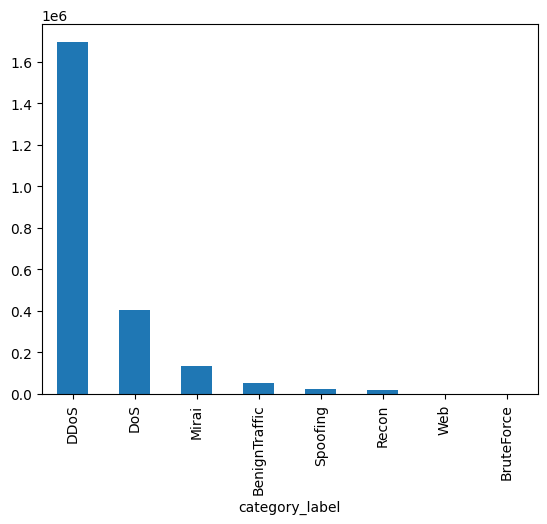

In [83]:
df.category_label.value_counts().plot(kind='bar')

In [87]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(['label', 'category_label'], axis=1), df['category_label'], test_size=0.2, random_state=42)


In [88]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [89]:
X_train

array([[-1.94929421e-02, -1.66170783e-01, -3.42858899e-01, ...,
        -9.95041577e-02, -4.13856083e-01,  2.10318842e-03],
       [-1.94929421e-02, -1.66170783e-01, -3.42858899e-01, ...,
        -9.95041577e-02, -4.13856083e-01,  2.10318842e-03],
       [-1.94929421e-02, -1.66287304e-01,  4.13247593e+00, ...,
        -9.64875574e-02, -2.41900322e-01,  2.10318842e-03],
       ...,
       [-1.94929421e-02, -1.66171948e-01, -3.49561847e-01, ...,
        -9.95034195e-02,  1.60333186e-02,  2.10318842e-03],
       [ 5.03788482e-01, -1.65594215e-01,  2.58032316e-02, ...,
        -7.05213438e-02,  3.88503793e+00,  4.90838713e+00],
       [-1.93909497e-02, -1.10958849e-01,  8.68140342e-01, ...,
        -9.94934764e-02,  1.02011199e-01,  2.10318842e-03]])

In [90]:
X_test

array([[-0.00857309, -0.16582911, -0.31828142, ..., -0.09948054,
         0.18798908,  0.00210319],
       [-0.01949294, -0.16617078, -0.3428589 , ..., -0.09950416,
        -0.41385608,  0.00210319],
       [-0.01930461, -0.12696981,  0.88601487, ..., -0.09950416,
        -0.41385608,  0.00210319],
       ...,
       [-0.01949294, -0.16617078, -0.3428589 , ..., -0.09950416,
        -0.41385608,  0.00210319],
       [-0.01926746, -0.09869385,  0.88601487, ..., -0.09950416,
        -0.41385608,  0.00210319],
       [-0.01949294, -0.16617078, -0.3428589 , ..., -0.09950416,
        -0.41385608,  0.00210319]])

In [106]:
models ={
    'logistic': LogisticRegression(random_state=42, max_iter=500, n_jobs=-1),
    'RandomForestClassifier': RandomForestClassifier(random_state=42, n_jobs=-1),
    'MLP': MLPClassifier(hidden_layer_sizes=(50, 50, 10), random_state=42, early_stopping=True, verbose=True)
}

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Classification Report for logistic:
               precision    recall  f1-score   support

BenignTraffic       0.71      0.90      0.80     10789
   BruteForce       1.00      0.15      0.26       129
         DDoS       0.84      0.99      0.91    339357
          DoS       0.85      0.21      0.33     80858
        Mirai       0.99      0.99      0.99     26451
        Recon       0.67      0.42      0.52      3631
     Spoofing       0.76      0.47      0.58      4986
          Web       1.00      0.01      0.03       229

     accuracy                           0.84    466430
    macro avg       0.85      0.52      0.55    466430
 weighted avg       0.84      0.84      0.80    466430



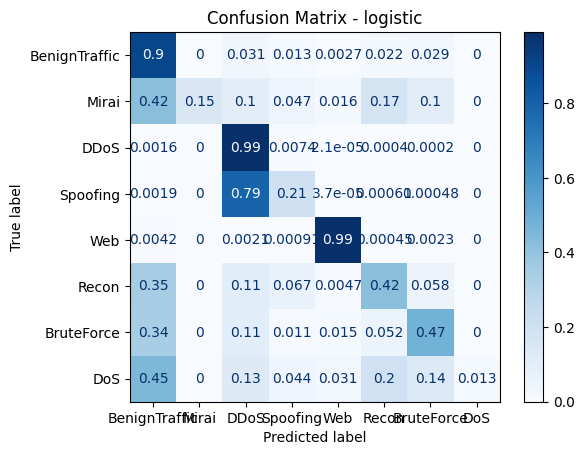

Classification Report for RandomForestClassifier:
               precision    recall  f1-score   support

BenignTraffic       0.91      0.98      0.94     10789
   BruteForce       1.00      0.28      0.44       129
         DDoS       1.00      1.00      1.00    339357
          DoS       1.00      1.00      1.00     80858
        Mirai       1.00      1.00      1.00     26451
        Recon       0.89      0.81      0.84      3631
     Spoofing       0.89      0.84      0.87      4986
          Web       0.96      0.20      0.33       229

     accuracy                           1.00    466430
    macro avg       0.96      0.76      0.80    466430
 weighted avg       1.00      1.00      1.00    466430



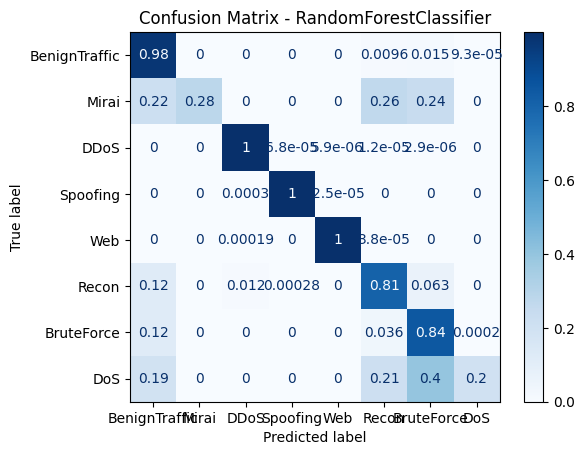

Iteration 1, loss = 0.27689271
Validation score: 0.959565
Iteration 2, loss = 0.06017070
Validation score: 0.986633
Iteration 3, loss = 0.04149161
Validation score: 0.987072
Iteration 4, loss = 0.03698626
Validation score: 0.988085
Iteration 5, loss = 0.03538981
Validation score: 0.988734
Iteration 6, loss = 0.03337441
Validation score: 0.989216
Iteration 7, loss = 0.03241351
Validation score: 0.989682
Iteration 8, loss = 0.03133883
Validation score: 0.989591
Iteration 9, loss = 0.03033049
Validation score: 0.989666
Iteration 10, loss = 0.02930050
Validation score: 0.989650
Iteration 11, loss = 0.02868498
Validation score: 0.990074
Iteration 12, loss = 0.02803804
Validation score: 0.989264
Iteration 13, loss = 0.02761532
Validation score: 0.989720
Iteration 14, loss = 0.02739238
Validation score: 0.990534
Iteration 15, loss = 0.02706570
Validation score: 0.990047
Iteration 16, loss = 0.02661239
Validation score: 0.990610
Iteration 17, loss = 0.02671318
Validation score: 0.990829
Iterat

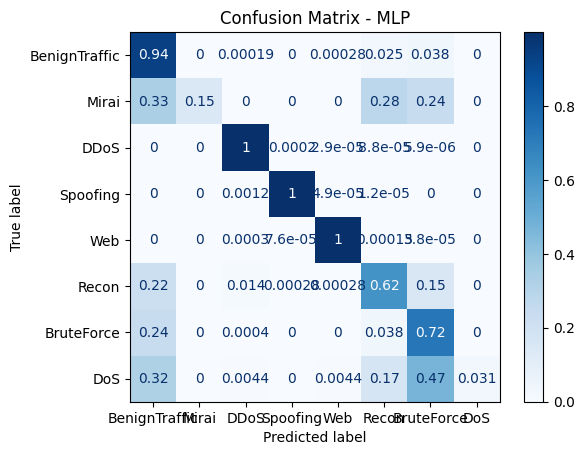

In [107]:
for i, (model_name, model) in enumerate(models.items()):
    model.fit(X_train, y_train)

    #model = load(f"models/binary/{model_name}.joblib")
    y_pred = model.predict(X_test)

    # Classification Report
    print(f"Classification Report for {model_name}:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    disp_cm = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred, normalize='true'), display_labels=label2id)
    
    # Plot the confusion matrix
    disp_cm.plot(cmap='Blues')

    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()


We can see that the the metrics of these models are in fact similar to the metrics that were obtained in the paper (8 classes):

Our Accuracy:
- Logistic: 84%
- RF: 100%
- MLP: 99%

Paper's Accuracy:
- Logistic: slighlty more than 80%
- RF: around 100%
- MLP: around 100%

Our F1:
- Logistic: 55%
- RF: 80%
- MLP: 70%

Paper's F1:
- Logistic: around 55%
- RF: around 70%
- MLP: around 70%

Even though these models have much better accuracies than the one we tested before, we believe that it is wrong to use the unbalanced data. The accuracy score merely represents the model's ability to classify correctly the majority of the classes, ignoring the ability for the model to work well with the less apparent ones.  This is mainly because we can see that the most represented classes are classified very well, the others get misclassified very badly (as can be seen from the confusion matrixes), and we believe that when testing on a big dataset the models would tend to misclassify most of them.

This is even more apparent when we look at the f1 scores, that are 80% in this case (unbalanced data) while it was almost 88% in the balanced case while accuracy was higher for the unbalanced data.